In [9]:
import matplotlib
matplotlib.use('Agg')

import numpy as np
import collections
from functools import partial
from os.path import expanduser
from tqdm import tqdm
import h5py

from surround.image_processing import *
from surround.data_handling import *
from surround.efficient_coding import *
from aesthetics.plotting import *
from surround.modeling import gaussian, difference_of_gaussians

import pyret.filtertools as ft
from sklearn.decomposition import PCA
from scipy.stats import sem, pearsonr
from scipy.optimize import curve_fit, minimize
from scipy.interpolate import interp1d
from mpl_toolkits.axes_grid1 import make_axes_locatable

# This is a bit of magic to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

plt.style.use('deepretina')

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/home/lane/.local/lib/python3.5/site-packages/matplotlib-2.0.0-py3.5-linux-x86_64.egg/matplotlib/__init__.py:1401: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
/home/lane/.local/lib/python3.5/site-packages/matplotlib-2.0.0-py3.5-linux-x86_64.egg/matplotlib/style/core.py:53: UserWarning: Style includes a parameter, 'interactive', that is not related to style.  Ignoring
  "to style.  Ignoring".format(key))
/home/lane/.local/lib/python3.5/site-packages/matplotlib-2.0.0-py3.5-linux-x86_64.egg/matplotlib/style/core.py:53: UserWarning: Style includes a parameter, 'timezone', that is not related to style.  Ignoring
  "to style.  Ignoring".format(key))
/home/lane/.local/lib/python3.5/site-packages/matplotlib-2.0.0-py3.5-linux-x86_64.egg/matplotlib/__init__.py:917: UserWarning: axes.ho

Changes from previous versions:
- Constrain spacing by photoreceptor spacing
- Constrain width by visual field of salamander retina  
- Constrain output power instead of output variance

In [2]:
microns_per_degree = 50.0 # depends on species; this is for salamander
photoreceptor_width = 10.0/microns_per_degree # salamander photoreceptors have width of 10-20 microns
retina_width = 4000.0/microns_per_degree # salamander retina is about 4 mm
frequency_spacing = 1./retina_width # this is the lowest non-DC frequency we can estimate
highest_frequency = 0.5/photoreceptor_width # this is the highest frequency we can estimate (Nyquist freq.)

N = retina_width//photoreceptor_width
freqs = np.linspace(0, highest_frequency, N//2 + 1)
space = np.concatenate([np.linspace(-0.5*retina_width, 0, N//2 + 1)[:-1], np.linspace(0, 0.5*retina_width, N//2 + 1)])

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:8: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:9: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.


### Load receptive fields

In [3]:
# These are loaded as (space, receptive) field tuples
cells = {}
cells['ganglion'] = load_ganglion_cells(space_mode='peak')
cells['bipolar'] = load_bipolar_cells(space_mode='peak')
cells['amacrine'] = load_amacrine_cells(space_mode='peak')
cells['horizontal'] = load_horizontal_cells(space_mode='peak')

In [6]:
receptive_fields = collections.defaultdict(list)
for c in cells.keys():
    for s, rf in cells[c]:
        this_cell_interp = interp1d(s, rf, kind='slinear', bounds_error=False, fill_value=[0])
        receptive_fields[c].append(this_cell_interp(space))
        
average_ganglion_rf = np.mean(receptive_fields['ganglion'], axis=0)

In [7]:
# David's 1721 receptive field dataset
data_path = expanduser('~/data/kastner/receptive_fields/')
spatialDelta = 0.05 # mm
micronsPerDeg = 50.
ganglion_rfs = {
    'fast_on': np.loadtxt(data_path + 'linesRF1.txt').reshape((126, 101, -1)),
    'fast_off_adapting': np.loadtxt(data_path + 'linesRF19.txt').reshape((-1, 101, 96)),
    'fast_off_sensitizing': np.loadtxt(data_path + 'linesRF8.txt').reshape((-1, 101, 96)),
    'medium_off_adapting': np.loadtxt(data_path + 'linesRF29.txt').reshape((-1, 101, 96)),
    'slow_off': np.loadtxt(data_path + 'linesRF17.txt').reshape((-1, 101, 96)),
}

for celltype in ganglion_rfs.keys():
    for rf in ganglion_rfs[celltype]:
        # since receptive fields are noisy, use PCA
        pca = PCA(n_components=2)
        pca.fit(rf)
        g_pca = pca.components_[0]

        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        this_space = get_space(g_pca, spatialDelta, micronsPerDeg, kind='peak')
        
        rf_interp = interp1d(this_space, sign_of_pc*g_pca, kind='slinear', bounds_error=False, fill_value=[0])

        receptive_fields[celltype].append(rf_interp(space))

#### Remove duplicates

In [10]:
corr_map = {}
for celltype in receptive_fields.keys():
    corr_map[celltype] = np.zeros((len(receptive_fields[celltype]), len(receptive_fields[celltype])))
    for idr1, rf1 in tqdm(enumerate(receptive_fields[celltype])):
        for idr2 in range(idr1+1, len(receptive_fields[celltype])):
            rf2 = receptive_fields[celltype][idr2]
            corr_map[celltype][idr1, idr2] = pearsonr(rf1, rf2)[0]

unduplicated_receptive_fields = collections.defaultdict(list)
duplicates = collections.defaultdict(list)

for celltype in corr_map.keys():
    these_dups = []
    for row in corr_map[celltype]:
        these_dups.append([i for i in range(len(row)) if row[i] == 1.0])
    duplicates[celltype] = np.unique(np.hstack(these_dups))
    
unduplicated_receptive_fields = collections.defaultdict(list)
for celltype in receptive_fields.keys():
    for idr, rf in enumerate(receptive_fields[celltype]):
        if idr not in duplicates[celltype]:
            unduplicated_receptive_fields[celltype].append(rf)
            
receptive_fields = unduplicated_receptive_fields.copy()
del unduplicated_receptive_fields

sum([len(receptive_fields[k]) for k in receptive_fields.keys()]) - sum([len(receptive_fields[k]) for k in ['horizontal',
                                                                                                           'amacrine',
                                                                                                          'bipolar']])

2it [00:00, 8184.01it/s]
28it [00:00, 1037.41it/s]
2it [00:00, 10369.11it/s]
126it [00:00, 234.63it/s]
772it [00:20, 37.29it/s] 
2it [00:00, 5656.51it/s]
253it [00:02, 112.26it/s]
249it [00:02, 118.08it/s]
321it [00:03, 89.67it/s] 


1382

### Compute projective fields

In [11]:
horz_pfs_full = get_horizontal_projective_field(conv_mode='full')
horz_pfs_same = get_horizontal_projective_field(conv_mode='same')
ama_pfs_full = get_amacrine_projective_field(conv_mode='full')
ama_pfs_same = get_amacrine_projective_field(conv_mode='same')

space_h_full, horz_pf_full, horz_sem_full = get_mean(horz_pfs_full)
space_h_same, horz_pf_same, horz_sem_same = get_mean(horz_pfs_same)
space_a_full, ama_pf_full, ama_sem_full = get_mean(ama_pfs_full)
space_a_same, ama_pf_same, ama_sem_same = get_mean(ama_pfs_same)

horz_pf_interp = interp1d(space_h_full, horz_pf_full, kind='slinear', bounds_error=False, fill_value=[0])
ama_pf_interp = interp1d(space_a_full, ama_pf_full, kind='slinear', bounds_error=False, fill_value=[0])

horz_pf = horz_pf_interp(space)
ama_pf = ama_pf_interp(space)

### Signal

In [12]:
# choose an image path from cd13A (flood plain, water, horizon) or cd01A (baboons, trees, bushes)
pixelsToDeg = 92./2 # or 2./92 degrees per pixel (spacing)
spacing = 1./pixelsToDeg # number of degree spacing between pixels
normalize = 'divisive'
contrast = 0.35
signal = np.array(np.load('signal_3_23.npy'))

### Noise  
Note that the amplitude of the average_ganglion_fft will change the SNR. As the amplitude $\rightarrow \infty$, we get $$\rm{SNR} \rightarrow \frac{\sum (\rm{filter}_{1:f} \times \rm{signal}_{1:f})^2}{\sum (\rm{filter}_{1:f} \times N_{\rm{in}})^2}$$.  

Since the scale of the ganglion fft is arbitrary, we can look at the SNR in this limit.

In [14]:
input_noise = 0.098762200628786892
output_noise = 0.35
target_power = 54.131410989171826

In [16]:
# SNR = 0.269 is total SNR from ganglion recordings of 112 repeats to 30 seconds natural scenes
average_ganglion_fft = abs(np.fft.rfft(average_ganglion_rf))
def find_filt_const(filt_const):
    this_snr = get_snr(input_noise, output_noise, signal, filt_const*average_ganglion_fft, mode='variance')
    return (this_snr - 0.26912469)**2

filt_const_opt = scipy.optimize.minimize_scalar(find_filt_const)

print(get_snr(input_noise, output_noise, signal, filt_const_opt.x*average_ganglion_fft, mode='variance'))

0.269124689452


### Ideal filter

In [17]:
ideal_filter = unique_soln(signal**2, input_noise, output_noise)

The relative error from this choice of Lagrangian multiplier is 1.63219720822e-07.


### Model of Horizontal Projective Field + Amacrine Projective Field + Center

In [19]:
horz_pf /= np.sum(horz_pf)
ama_pf /= np.sum(ama_pf)

Get center widths for each celltype

In [20]:
diff_of_gauss_mu0 = partial(difference_of_gaussians, mu=0)

In [21]:
def center_and_surround(space, center_width, surround_width, center_strength, surround_strength):
    return diff_of_gauss_mu0(space, abs(center_width), abs(surround_width),
                            -abs(center_strength), abs(surround_strength))

In [22]:
center_widths = np.load('center_widths_3_29.npy').item()
surround_widths = np.load('surround_widths_3_29.npy').item()
center_strengths = np.load('center_strengths_3_29.npy').item()
surround_strengths = np.load('surround_strengths_3_29.npy').item()
fit_failures = np.load('fit_failures_3_29.npy').item()

In [23]:
for f in fit_failures.keys():
    print("couldn't fit %d in %s" %(len(fit_failures[f]), f))

couldn't fit 3 in ganglion
couldn't fit 3 in fast_off_sensitizing
couldn't fit 1 in fast_on
couldn't fit 4 in fast_off_adapting
couldn't fit 4 in medium_off_adapting
couldn't fit 13 in slow_off


In [28]:
median_center_widths = {}
for celltype in center_widths.keys():
    cws = np.array(center_widths[celltype])
    sws = np.array(surround_widths[celltype])
    css = np.array(center_strengths[celltype])
    sss = np.array(surround_strengths[celltype])
#     mean_center_widths[celltype] = np.mean(cws[cws < 500])
#     mean_surround_width = np.mean(sws[sws < 500])
#     mean_center_strength = np.mean(css[abs(css) < 500])
#     mean_surround_strength = np.mean(sss[abs(sss) < 500])
    
    median_center_widths[celltype] = np.median(abs(cws))
    median_surround_width = np.median(abs(sws))
    median_center_strength = np.median(-abs(css))
    median_surround_strength = np.median(abs(sss))
#     plt.plot(space, diff_of_gauss_mu0(space, median_center_widths[celltype], median_surround_width,
#                                      median_center_strength, median_surround_strength), label=celltype)
# plt.legend(frameon=False, fontsize=9, loc='lower left')
# adjust_spines(plt.gca())

median_center_widths

{'fast_off_adapting': 1.6921005209471627,
 'fast_off_sensitizing': 2.0456543257003039,
 'fast_on': 2.1703662900605498,
 'ganglion': 1.3731413963691115,
 'medium_off_adapting': 1.555772399380934,
 'slow_off': 1.5248731503974167}

# Compute information while varying surround widths

In [34]:
widths = np.linspace(0.01, 17, 100)
init_filt_const = 10.9
resolution = 150
horz_weights = np.linspace(0,1,resolution)
center_weights = np.linspace(0,1,resolution)

In [79]:
infos_varying_width = collections.defaultdict(list)
celltype = 'fast_off_adapting'
with h5py.File('infos_varying_width.h5', 'r') as f:
    tmp = dict(f)
    width_tuples = list(tmp.keys())
    for k in width_tuples:
        lhs, rhs = k.split(',')
        w1 = float(lhs.split('(')[1])
        w2 = float(rhs.split(')')[0])
        infos_varying_width[(w1, w2)] = np.array(f[k])

In [80]:
colorscheme = {
    'ganglion': 'k',
    'fast_off_sensitizing': 'r',
    'fast_off_adapting': 'g',
    'slow_off': 'y',
    'fast_on': 'b',
    'medium_off_adapting': 'c'
}

For each cell type, there is a map of information as a function of the two surround sizes. For each of these maps is another map of how information varies with weighting, conditioned on the two surround sizes.

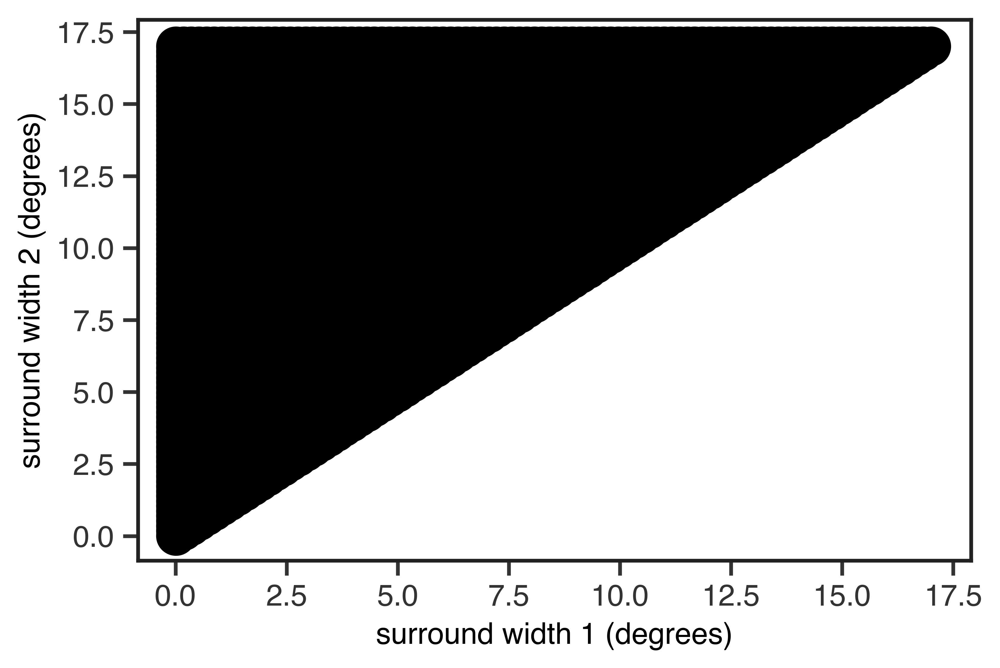

In [81]:
celltype = 'fast_off_adapting'
for idw,w1 in enumerate(widths):
    for w2 in widths[idw:]:
        plt.scatter(w1, w2, color='k')
plt.xlabel('surround width 1 (degrees)')
plt.ylabel('surround width 2 (degrees)')

In [83]:
max_info_vs_width = np.zeros((len(widths), len(widths)))
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        max_info_vs_width[idw1, idw2+idw1] = np.max(infos_varying_width[(w1,w2)])
        max_info_vs_width[idw2+idw1, idw1] = np.max(infos_varying_width[(w1,w2)])

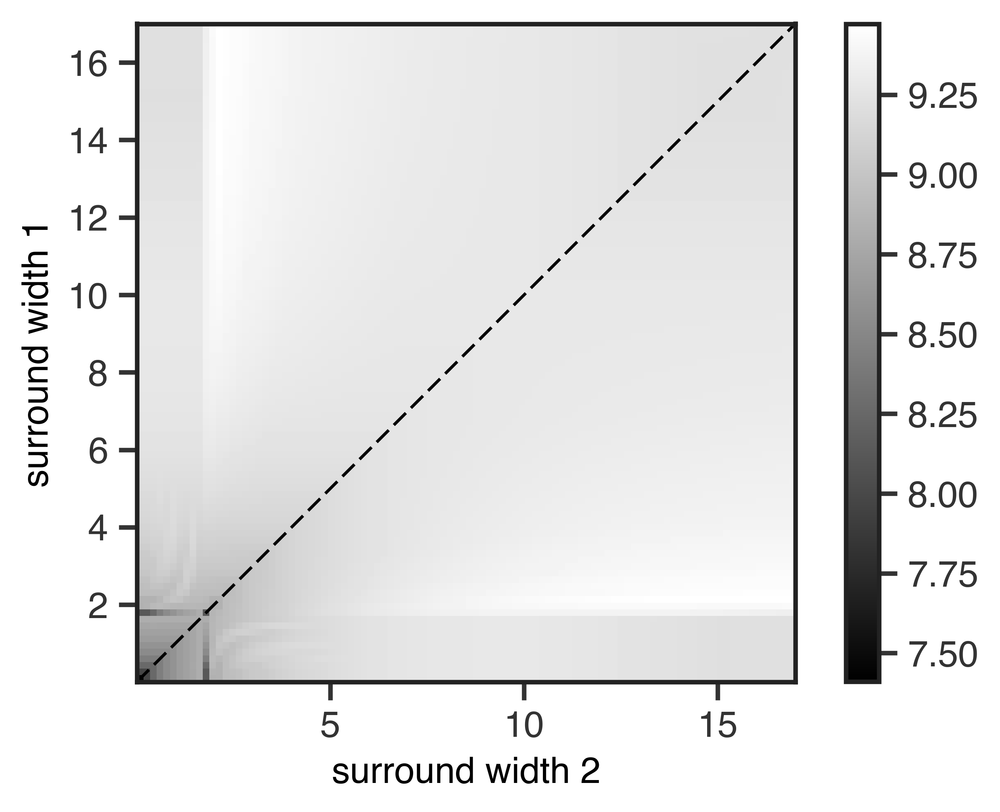

In [84]:
plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.plot(widths, widths, 'k--', linewidth=1)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.colorbar()

### Plot data on this map

In [85]:
tmp = gaussian(space, 7.51067749, 0, 1)/np.max(gaussian(space, 7.51067749, 0, 1))

In [86]:
space[np.argmin(abs(tmp - 0.5))]

-8.8442211055276374

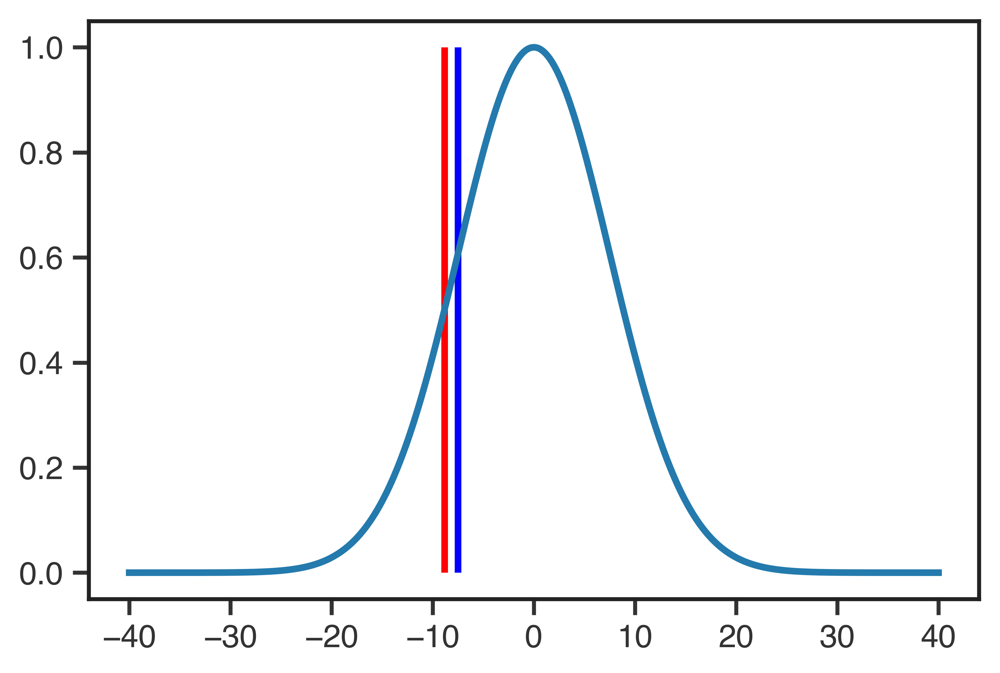

In [87]:
plt.plot(space, tmp)
plt.vlines(space[np.argmin(abs(tmp - 0.5))], 0, 1, color='r')
plt.vlines(-7.51067749, 0, 1, color='b')

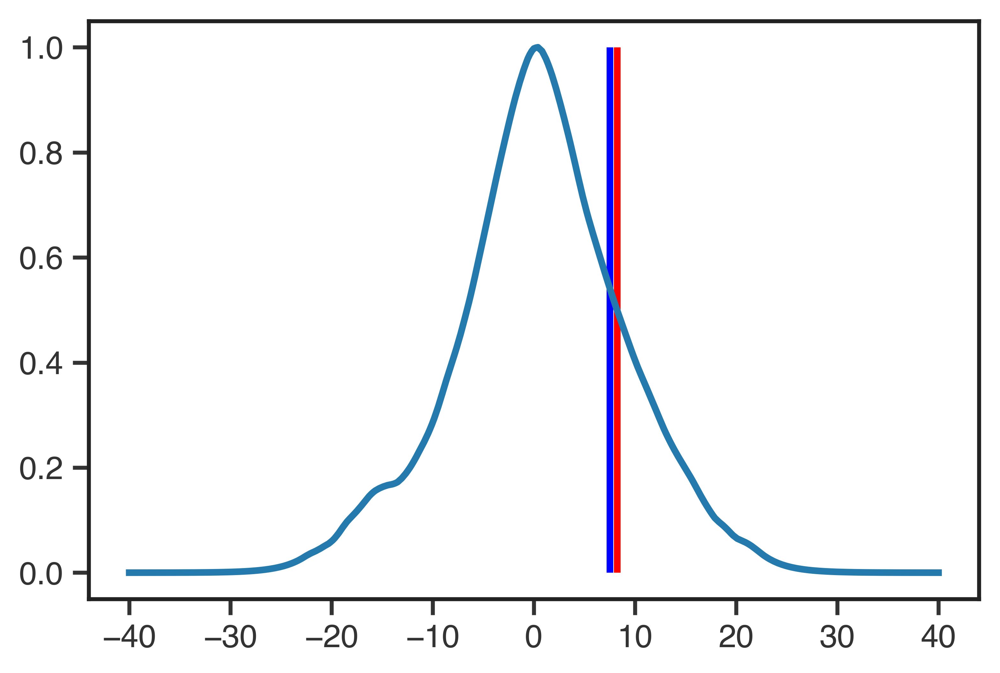

In [88]:
normed_horz_pf = horz_pf/np.max(horz_pf)
normed_ama_pf = ama_pf/np.max(ama_pf)
plt.plot(space, normed_horz_pf)
plt.vlines(space[np.argmin(abs(normed_horz_pf - 0.5))], 0, 1, color='r')
plt.vlines(7.51067749, 0, 1, color='b')

In [675]:
space[np.argmin(abs(normed_horz_pf - 0.5))]

8.2412060301507548

In [678]:
space[np.argmin(abs(normed_ama_pf - 0.5))]

-2.613065326633162

In [ ]:
popt_horz, pcov = curve_fit(gaussian, space, horz_pf, p0=[2.5, 0.0, 2.1])
popt_ama, pcov = curve_fit(gaussian, space, ama_pf, p0=[2.5, 0.0, 2.1])

In [163]:
print(popt_horz)
print(popt_ama)

[ 7.51067749  0.71845123  3.63992111]
[ 2.65155836  0.03148983  1.12148378]


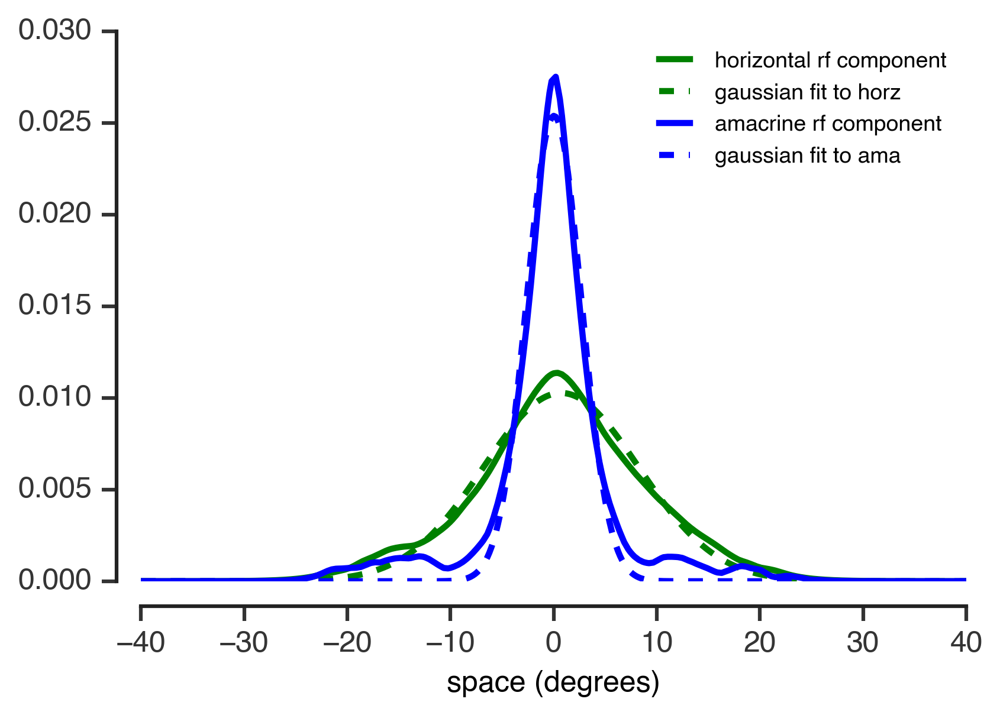

In [164]:
plt.plot(space, horz_pf, 'g', label='horizontal rf component')
plt.plot(space, gaussian(space, *popt_horz), 'g--', label='gaussian fit to horz')
plt.plot(space, ama_pf, 'b', label='amacrine rf component')
plt.plot(space, gaussian(space, *popt_ama), 'b--', label='gaussian fit to ama')
plt.xlabel('space (degrees)')
plt.legend(frameon=False, loc='upper right', fontsize=9)
adjust_spines(plt.gca())

In [ ]:
plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.colorbar()
plt.plot(widths, widths, 'k--', linewidth=1)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='w', linewidth=0.8)
plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='w', linewidth=0.8)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

What does (2,10) or (2,5) look like?

In [ ]:
center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)
width1 = widths[2]
width2 = widths[5]
surround1 = gaussian(x=space, sigma=width1, mu=0.)
surround1 /= np.sum(surround1)
surround2 = gaussian(x=space, sigma=width2, mu=0.)
surround2 /= np.sum(surround2)

def rf_model(horz_weight, center_weight):
    return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

plt.plot(space, rf_model(0.8, 0.6), color='k', alpha=0.7, linewidth=1)
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

In [ ]:
center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)
width1 = widths[2]
width2 = widths[10]
surround1 = gaussian(x=space, sigma=width1, mu=0.)
surround1 /= np.sum(surround1)
surround2 = gaussian(x=space, sigma=width2, mu=0.)
surround2 /= np.sum(surround2)

def rf_model(horz_weight, center_weight):
    return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

plt.plot(space, rf_model(0.8, 0.6), color='k', alpha=0.7, linewidth=1)
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

### Check that the info maps per parameter look reasonable

Closest to past surround data is:

In [162]:
print(widths[4])
print(widths[9])

0.696464646465
1.55454545455


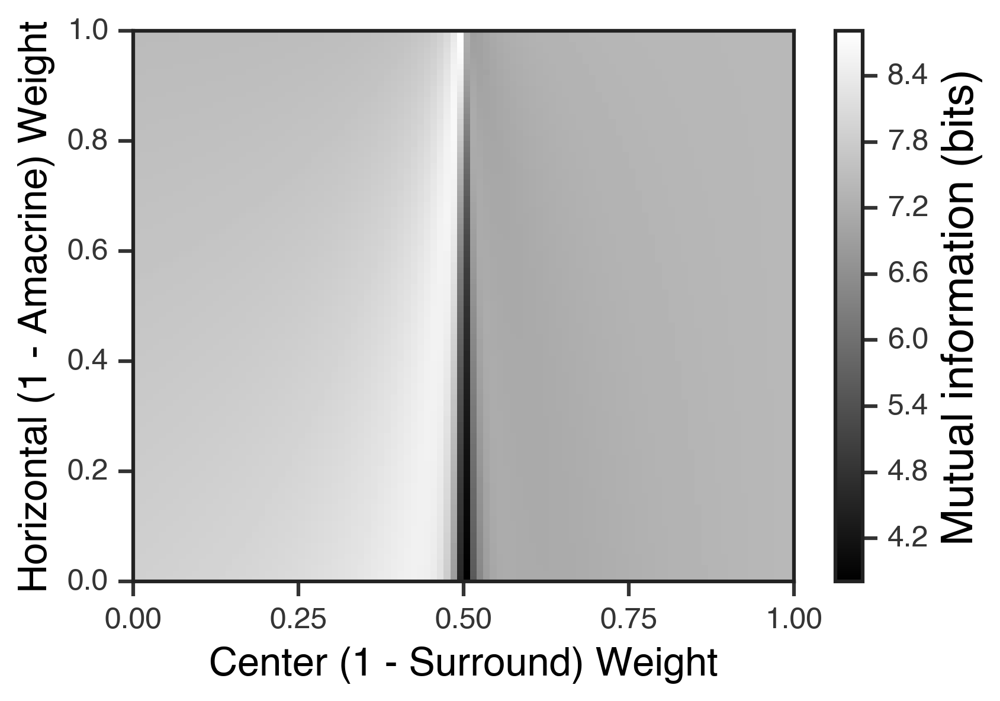

In [161]:
plt.imshow(infos_varying_width[celltype][(widths[4], widths[9])], origin='bottom left',
          extent=(center_weights[0], center_weights[-1], horz_weights[0], horz_weights[-1]),
          aspect='auto')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

What's happening at the slight diagonal to the left of 0.5 center weight?

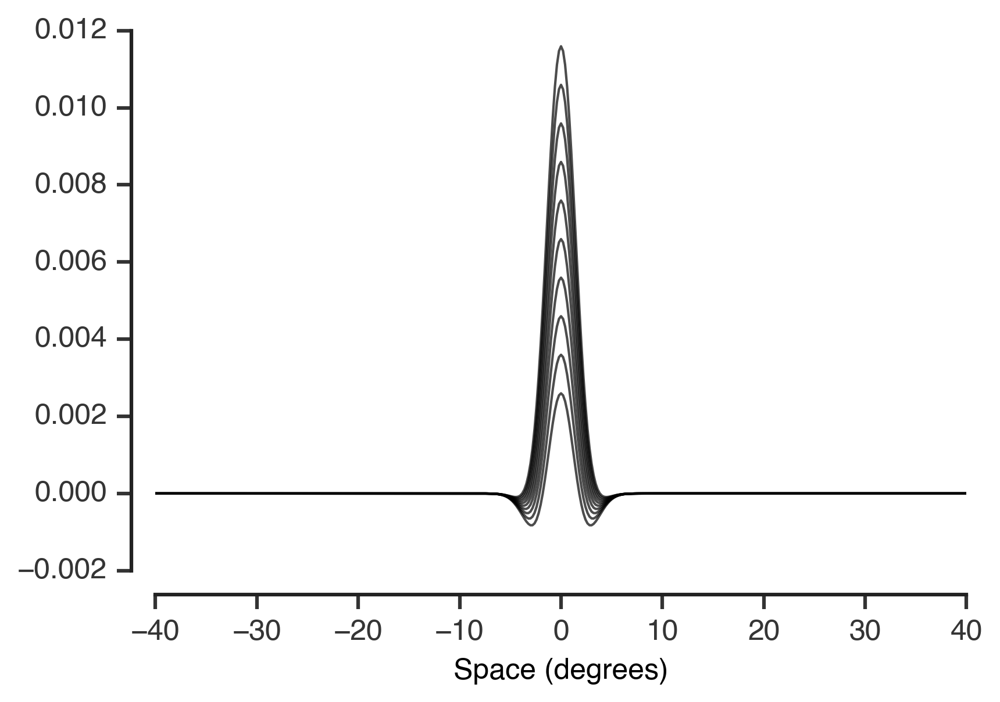

In [166]:
center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)
width1 = widths[4]
width2 = widths[9]
surround1 = gaussian(x=space, sigma=width1, mu=0.)
surround1 /= np.sum(surround1)
surround2 = gaussian(x=space, sigma=width2, mu=0.)
surround2 /= np.sum(surround2)

def rf_model(horz_weight, center_weight):
    return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

these_cws = [cw for cw in center_weights if (cw >= 0.4) and (cw <= 0.5)]
model_means = []
for cw in these_cws:
    plt.plot(space, rf_model(1.0, cw), color='k', alpha=0.7, linewidth=1)
    model_means.append(np.mean(rf_model(1.0, cw)))
    
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

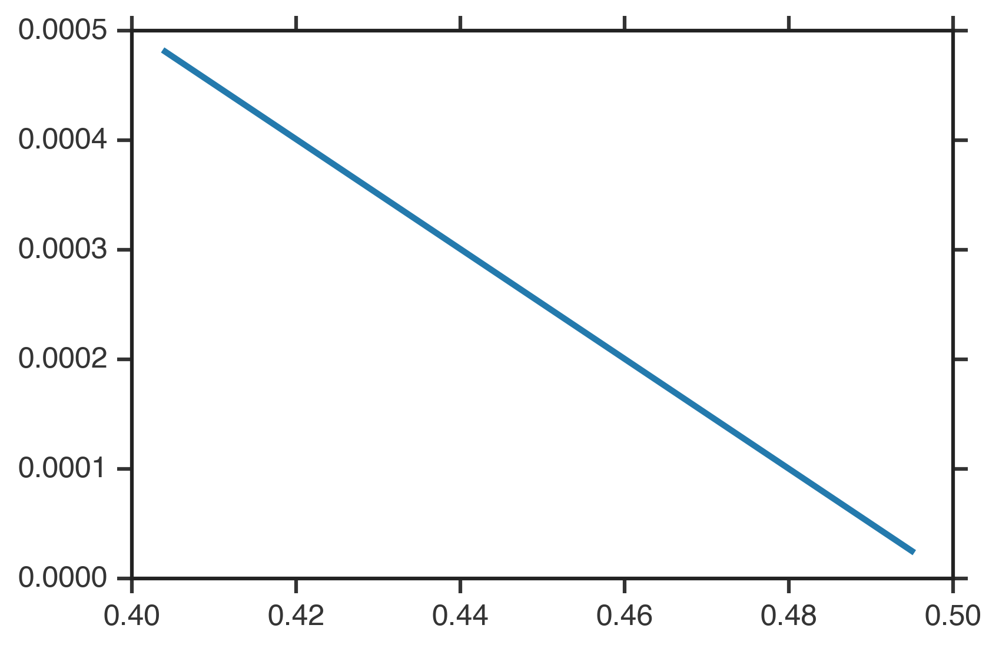

In [160]:
plt.plot(these_cws, model_means)

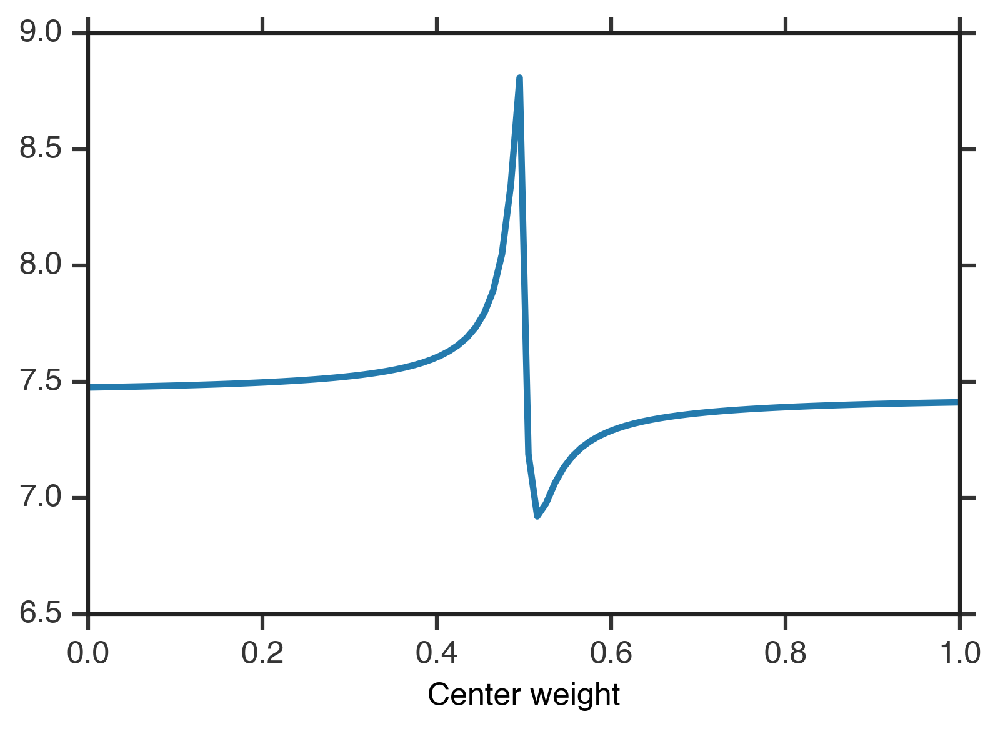

In [167]:
plt.plot(center_weights, infos_varying_width[celltype][(widths[4], widths[9])][-1,:])
plt.xlabel('Center weight')

### So it does look very similar to what we've seen before. What does it look like for a very different combo of surround sizes?

In [ ]:
min_info = None
max_info = None
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        new_min = np.min(infos_varying_width[celltype][(w1,w2)])
        new_max = np.max(infos_varying_width[celltype][(w1,w2)])
        if (not min_info) or (min_info > new_min):
            min_info = new_min
        if (not max_info) or (max_info < new_max):
            max_info = new_max

In [168]:
min_info

1.8099359746554101e-14

In [169]:
max_info

9.4720612730635256

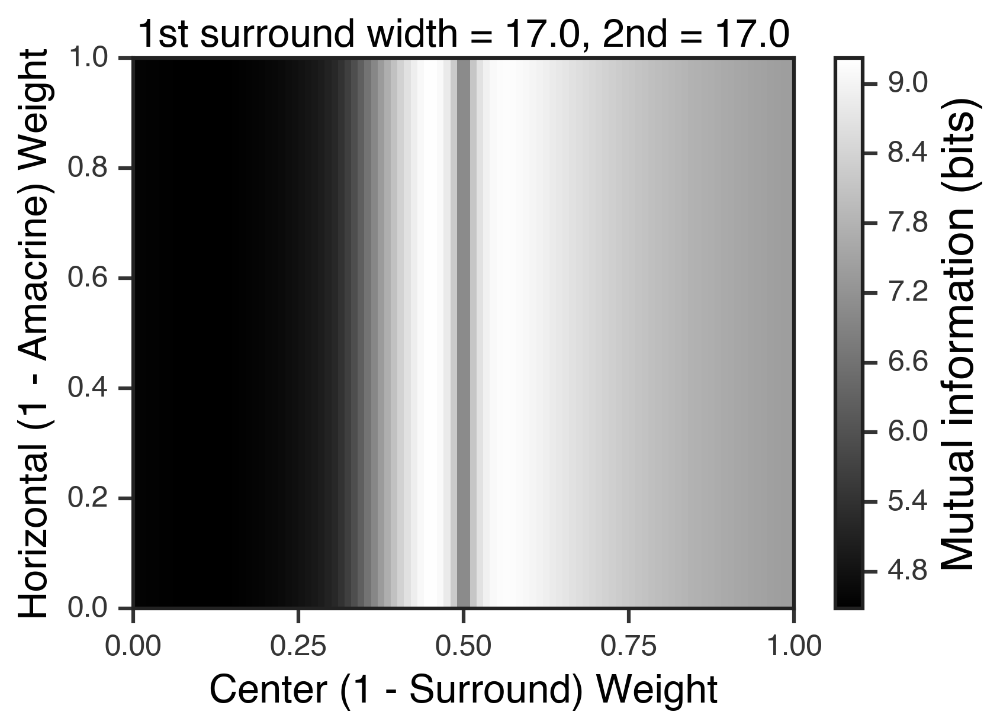

In [170]:
id1 = -1
id2 = -1
plt.imshow(infos_varying_width[celltype][(widths[id1], widths[id2])], origin='bottom left',
          extent=(center_weights[0], center_weights[-1], horz_weights[0], horz_weights[-1]),
          aspect='auto')
plt.title('1st surround width = %0.1f, 2nd = %0.1f' %(widths[id1], widths[id2]), fontsize=16)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.ylim([0,1])
plt.xticks([0, 0.25, 0.5, 0.75, 1])
plt.xlim([center_weights[0], center_weights[-1]])
# plt.title('Total information of various models \n with fitted ganglion cells', fontsize=16)
plt.xlabel('Center (1 - Surround) Weight', fontsize=16)
plt.ylabel('Horizontal (1 - Amacrine) Weight', fontsize=16)
ax = plt.gca()
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

In [ ]:
massive_info_table = np.zeros((len(horz_weights)*len(widths), len(center_weights)*len(widths)))
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        massive_info_table[(len(horz_weights)*idw1):(len(horz_weights)*(idw1+1)),
                           len(center_weights)*(idw1+idw2):(len(center_weights)*(idw1+idw2+1))] = infos_varying_width[celltype][(w1,w2)]

(700, 900)

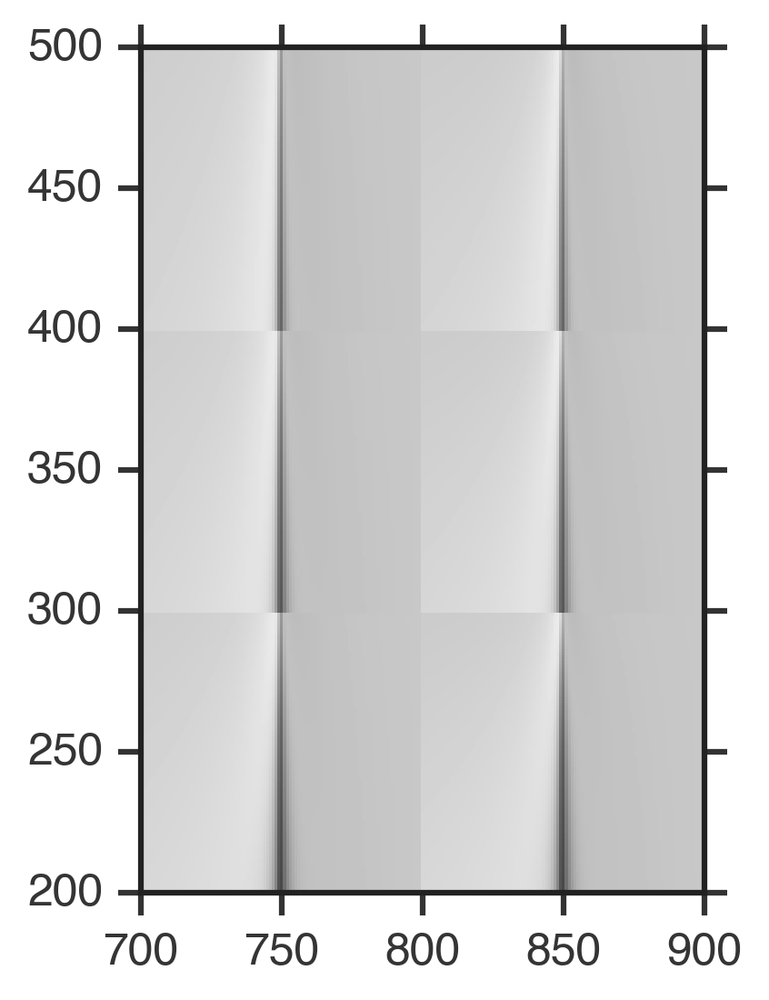

In [171]:
plt.imshow(massive_info_table, origin='bottom left')
plt.ylim(200,500)
plt.xlim(700,900)

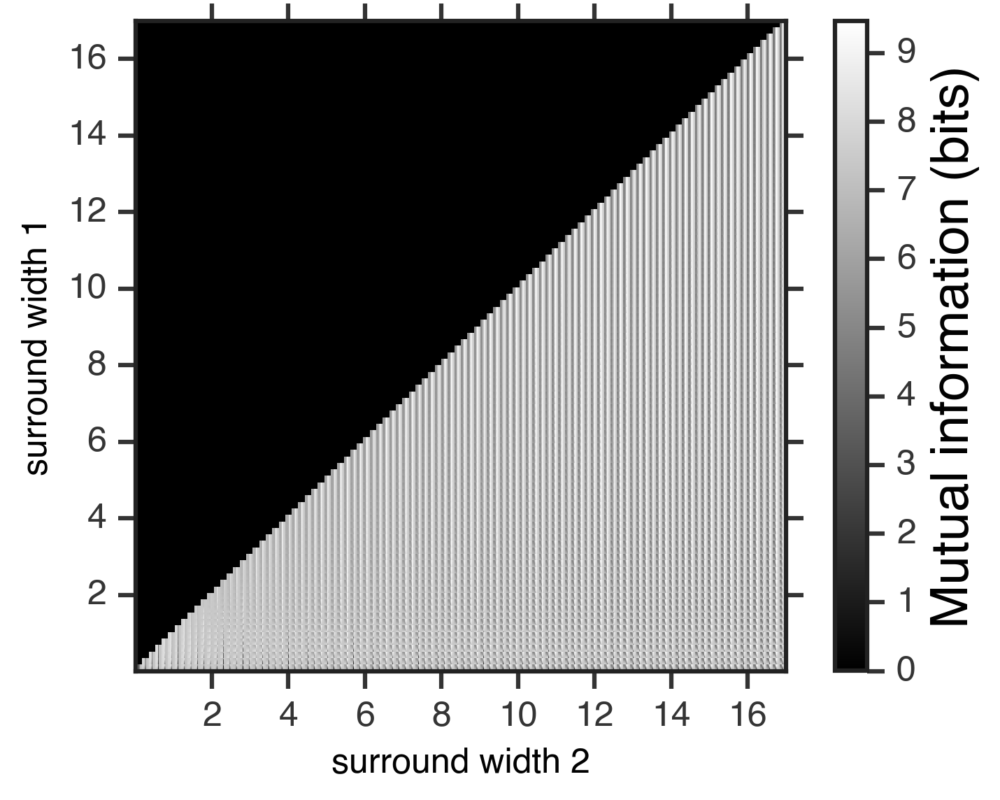

In [157]:
plt.imshow(massive_info_table, origin='bottom left', clim=[min_info, max_info],
          extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.savefig('12-2 massive info table.png')

## Explore other metrics of the space

#### Mean

In [ ]:
mean_info_vs_width = np.zeros((len(widths), len(widths)))
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        mean_info_vs_width[idw1, idw2+idw1] = np.mean(infos_varying_width[celltype][(w1,w2)])
        mean_info_vs_width[idw2+idw1, idw1] = np.mean(infos_varying_width[celltype][(w1,w2)])

(0.01, 17.0)

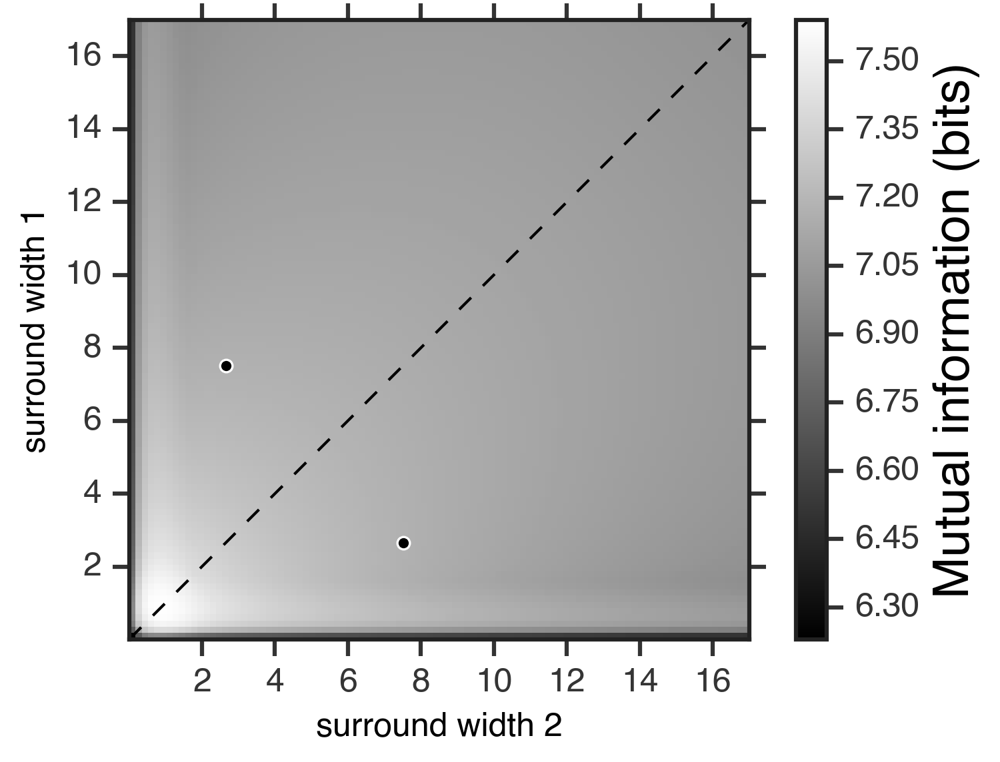

In [156]:
plt.imshow(mean_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='w', linewidth=0.8)
plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='w', linewidth=0.8)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

#### Min

In [ ]:
min_info_vs_width = np.zeros((len(widths), len(widths)))
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        min_info_vs_width[idw1, idw2+idw1] = np.min(infos_varying_width[celltype][(w1,w2)])
        min_info_vs_width[idw2+idw1, idw1] = np.min(infos_varying_width[celltype][(w1,w2)])

(0.01, 17.0)

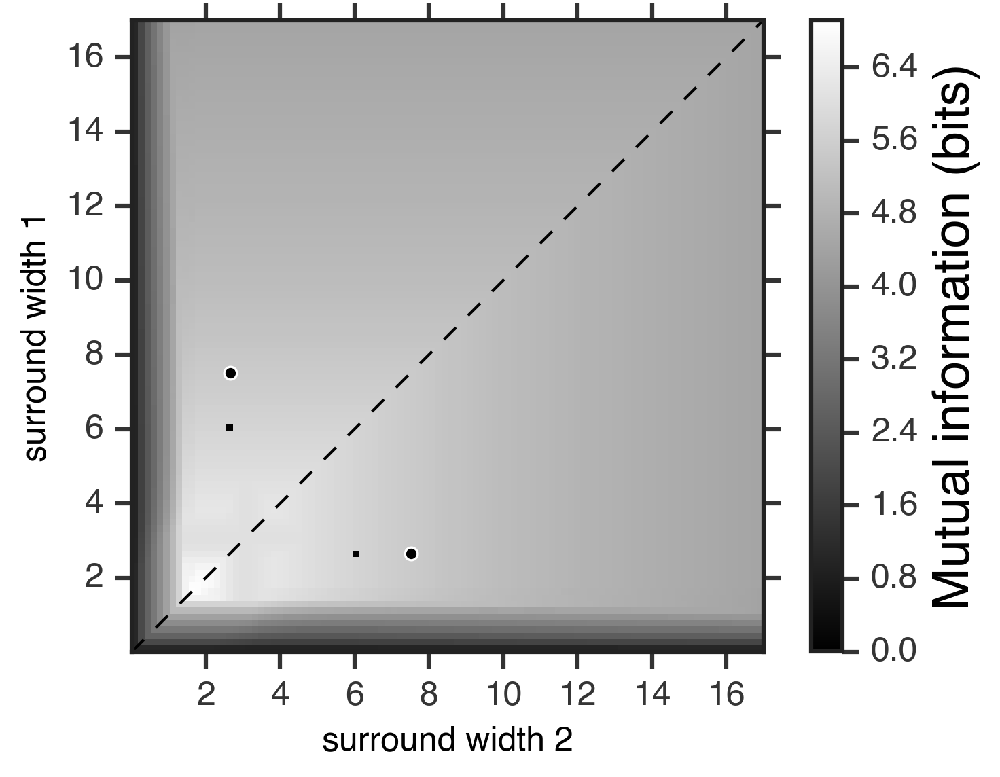

In [172]:
plt.imshow(min_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='w', linewidth=0.8)
plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='w', linewidth=0.8)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

#### Median

In [ ]:
median_info_vs_width = np.zeros((len(widths), len(widths)))
for idw1,w1 in enumerate(widths):
    for idw2,w2 in enumerate(widths[idw1:]):
        median_info_vs_width[idw1, idw2+idw1] = np.median(infos_varying_width[celltype][(w1,w2)])
        median_info_vs_width[idw2+idw1, idw1] = np.median(infos_varying_width[celltype][(w1,w2)])

(0.01, 17.0)

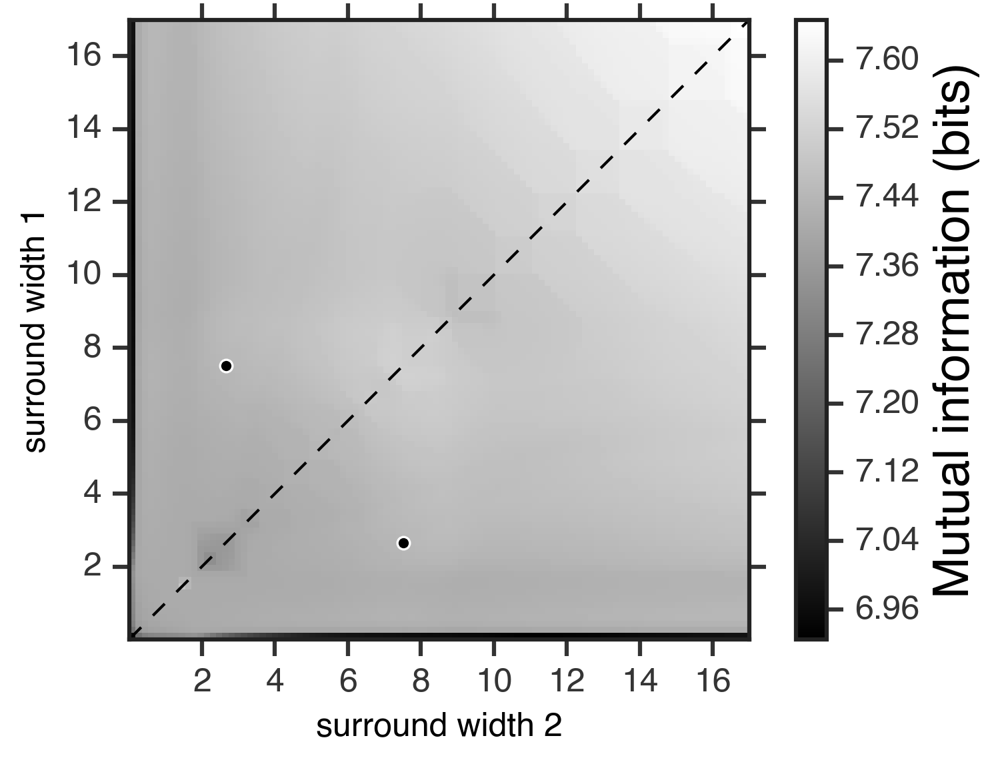

In [155]:
plt.imshow(median_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='w', linewidth=0.8)
plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='w', linewidth=0.8)
plt.xlabel('surround width 2')
plt.ylabel('surround width 1')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

## What do these RF models look like?

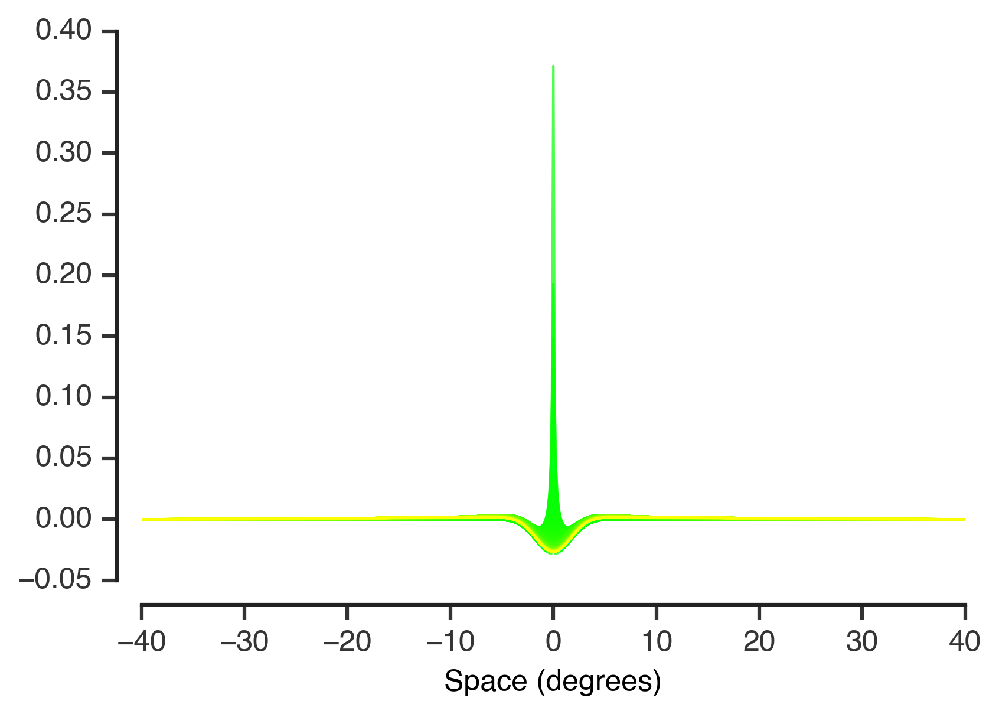

In [173]:
models = {}
center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)
for idw1, width1 in enumerate(widths):
    surround1 = gaussian(x=space, sigma=width1, mu=0.)
    surround1 /= np.sum(surround1)
    for idw2, width2 in enumerate(widths[idw1:]):
        surround2 = gaussian(x=space, sigma=width2, mu=0.)
        surround2 /= np.sum(surround2)

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        plt.plot(space, rf_model(0.8, 0.6), color=[idw1/len(widths), 1, idw2/len(widths)], alpha=0.7, linewidth=1)
        models[(width1, width2)] = rf_model(0.8, 0.6)
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

In [174]:
median_center_widths['fast_on']

1.9647399365227634

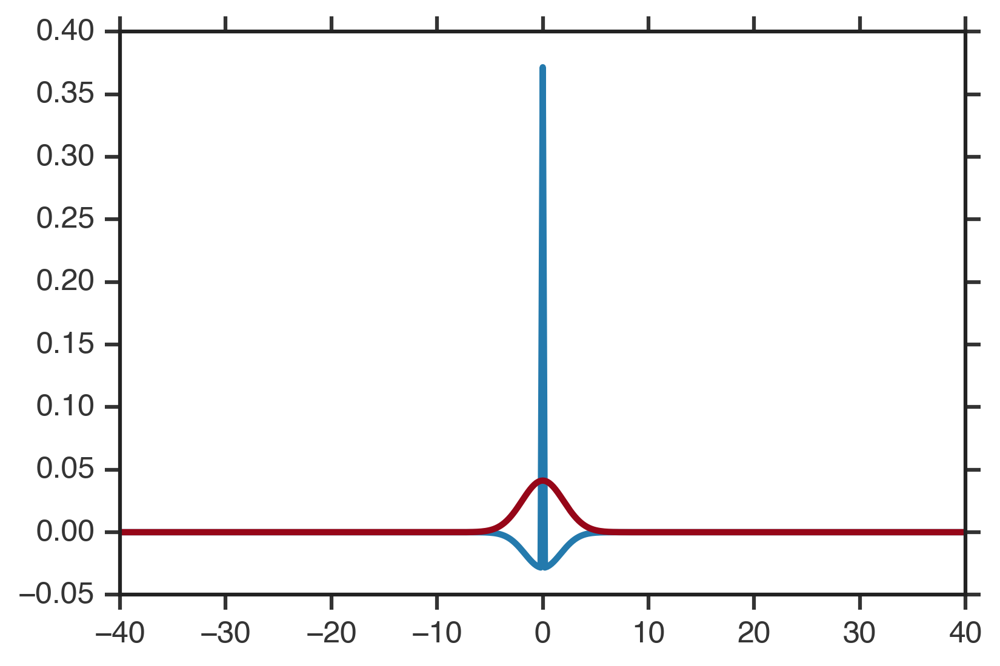

In [175]:
plt.plot(space, models[(widths[0], widths[0])])
plt.plot(space, gaussian(space, 1.964))
# plt.xlim(-5,5)

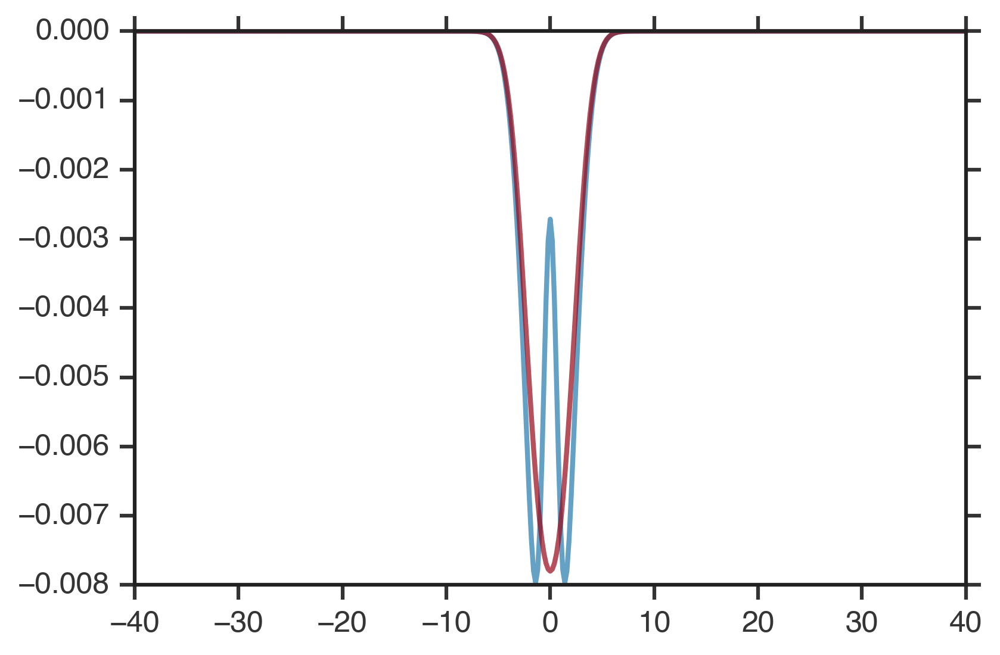

In [176]:
plt.plot(space, models[(widths[4], widths[9])], linewidth=2, alpha=0.7)
plt.plot(space, models[(widths[9], widths[9])], linewidth=2, alpha=0.7)

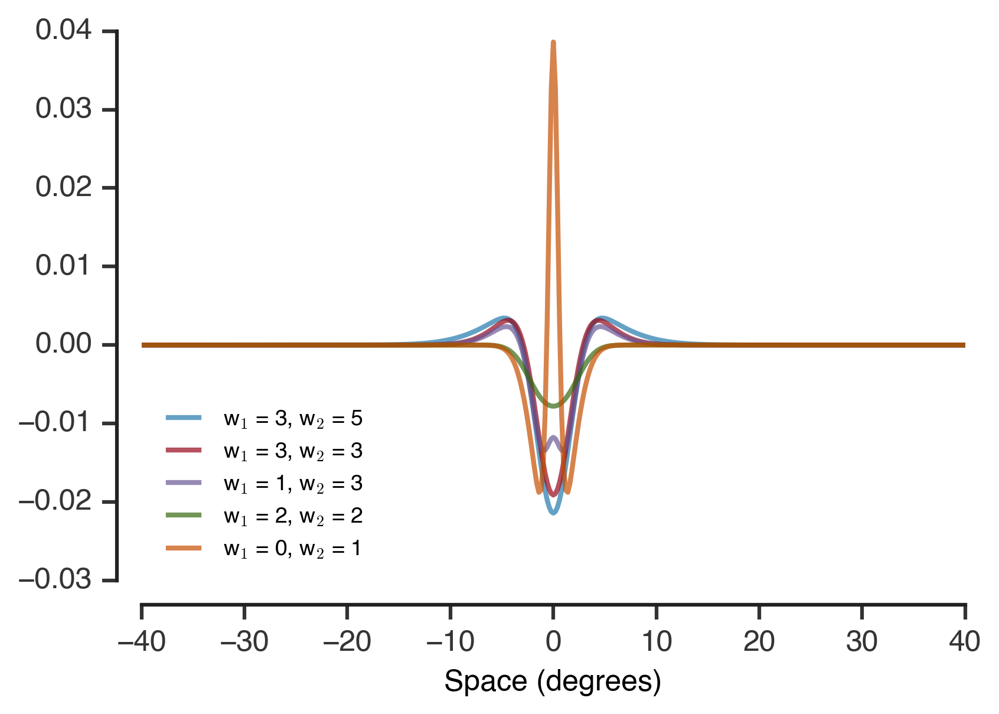

In [177]:
plt.plot(space, models[(widths[20], widths[29])], linewidth=2, alpha=0.7, label='w$_1$ = %0.f, w$_2$ = %0.f' %(widths[20], widths[29]))
plt.plot(space, models[(widths[20], widths[20])], linewidth=2, alpha=0.7, label='w$_1$ = %0.f, w$_2$ = %0.f' %(widths[20], widths[20]))
plt.plot(space, models[(widths[4], widths[20])], linewidth=2, alpha=0.7, label='w$_1$ = %0.f, w$_2$ = %0.f' %(widths[4], widths[20]))
plt.plot(space, models[(widths[9], widths[9])], linewidth=2, alpha=0.7, label='w$_1$ = %0.f, w$_2$ = %0.f' %(widths[9], widths[9]))
plt.plot(space, models[(widths[2], widths[3])], linewidth=2, alpha=0.7, label='w$_1$ = %0.f, w$_2$ = %0.f' %(widths[2], widths[3]))
plt.legend(loc='lower left', frameon=False, fontsize=9)
adjust_spines(plt.gca())
plt.xlabel('Space (degrees)')

# Plot all horizontal, amacrine cell data on the info maps

In [ ]:
data_dir = os.path.expanduser('~/data/kastner/')
h_file = 'horizontals.h5'
a_file = 'amacrines.h5'

In [ ]:
interneuron_rfs = collections.defaultdict(list)
with h5py.File(data_dir + h_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide,expt in tqdm(enumerate(keys)):
        rf = np.array(f['lines/rfs/%s' %expt])
        pca = PCA(n_components=2)
        pca.fit(rf)
        g_pca = pca.components_[0]

        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        interneuron_rfs['horizontal'].append(sign_of_pc * g_pca)

with h5py.File(data_dir + a_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide,expt in tqdm(enumerate(keys)):
        rf = np.array(f['lines/rfs/%s' %expt])
        pca = PCA(n_components=2)
        pca.fit(rf)
        g_pca = pca.components_[0]

        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        interneuron_rfs['amacrine'].append(sign_of_pc * g_pca)

In [ ]:
space_constant = {
    'horizontal': 118./microns_per_degree,
    'amacrine': 78./microns_per_degree
    }
conv_mode = 'full'
# spatial delta in mm * 1000) / microns_per_degree # microns * degrees/microns = degrees
interneuron_spacing = (2.2/100.) # in mm

interneuron_rfs_1d = collections.defaultdict(list)
for interneuron_type in interneuron_rfs.keys():
    for rf in interneuron_rfs[interneuron_type]:
        this_space = get_space(rf, interneuron_spacing, microns_per_degree, in_degrees=True, kind='peak')
        proj_range = [np.exp(-abs(t)/space_constant[interneuron_type]) for t in np.linspace(np.min(this_space),
                                                                                    np.max(this_space),len(this_space))]
        proj_field = np.convolve(proj_range, rf, mode=conv_mode)
        proj_field *= np.mean(rf) / np.mean(proj_field)
        
        proj_space = get_space(proj_field, np.diff(this_space[:2]), microns_per_degree, in_degrees=False)
        component_interp = interp1d(proj_space, proj_field, kind='slinear', bounds_error=False, fill_value=[0])
        interneuron_rfs_1d[interneuron_type].append(component_interp(space))

In [ ]:
colorscheme = {
    'horizontal': 'g',
    'amacrine': 'b'
}

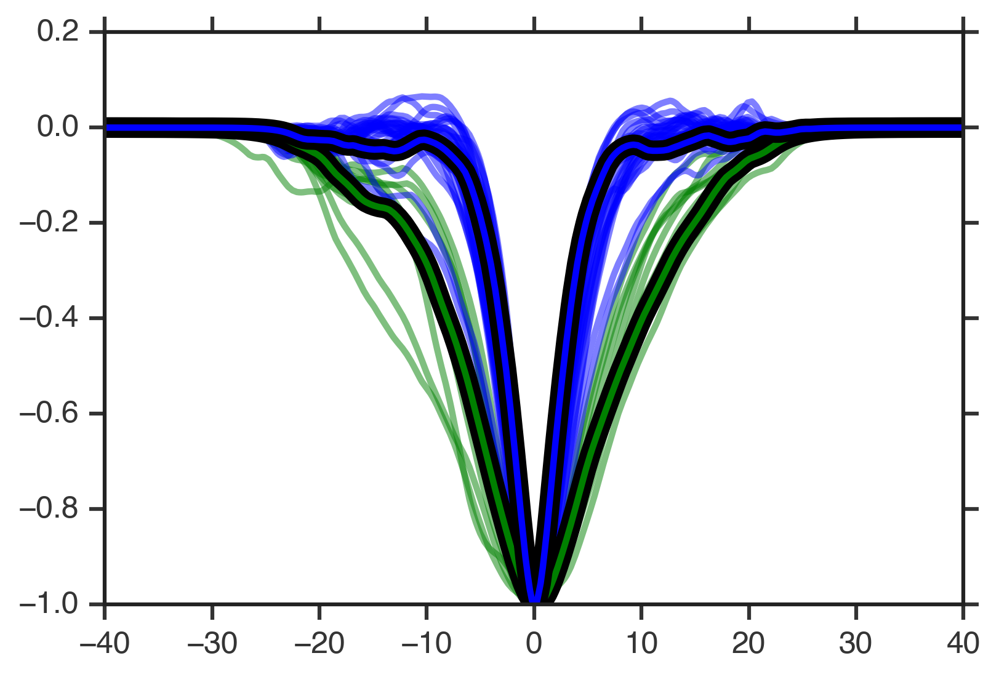

In [204]:
interneuron_fits = collections.defaultdict(list)
for interneuron_type in interneuron_rfs_1d.keys():
    for component in interneuron_rfs_1d[interneuron_type]:
        plt.plot(space, component/np.max(abs(component)), color=colorscheme[interneuron_type], alpha=0.5)

plt.plot(space, -horz_pf/np.max(abs(horz_pf)), 'k', linewidth=8)
plt.plot(space, -horz_pf/np.max(abs(horz_pf)), 'g')
plt.plot(space, -ama_pf/np.max(abs(ama_pf)), 'k', linewidth=8)
plt.plot(space, -ama_pf/np.max(abs(ama_pf)), 'b')

In [205]:
popt_horz

array([ 7.51067749,  0.71845123,  3.63992111])

In [206]:
interneuron_fits = collections.defaultdict(list)
for interneuron_type in interneuron_rfs_1d.keys():
    for component in interneuron_rfs_1d[interneuron_type]:
        popt, pcov = curve_fit(gaussian, space, -component, p0=[2.5, 0.0, 2.1])
        interneuron_fits[interneuron_type].append(abs(popt[0]))

(0.01, 17.0)

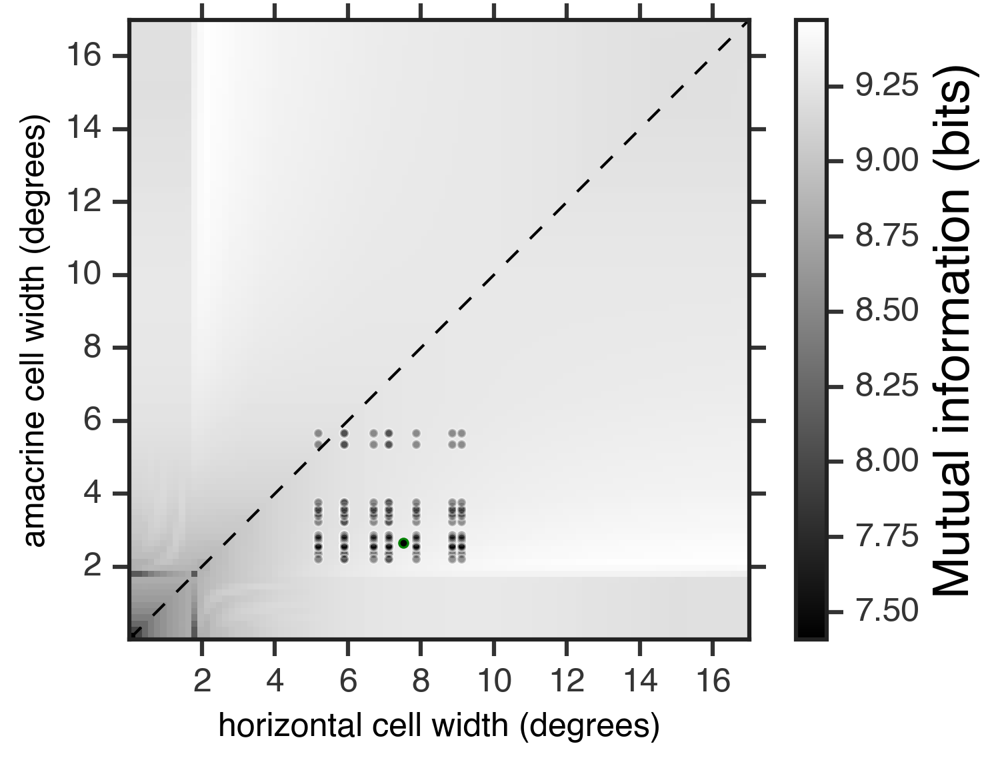

In [207]:
plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
# plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='g', linewidth=0.8)
# for interneuron_type in interneuron_fits.keys():
for horz_fit in interneuron_fits['horizontal']:
    for ama_fit in interneuron_fits['amacrine']:
        plt.scatter(horz_fit, ama_fit, c='k', edgecolor='w', linewidth=0.8, s=10, alpha=0.4)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

(0.01, 17.0)

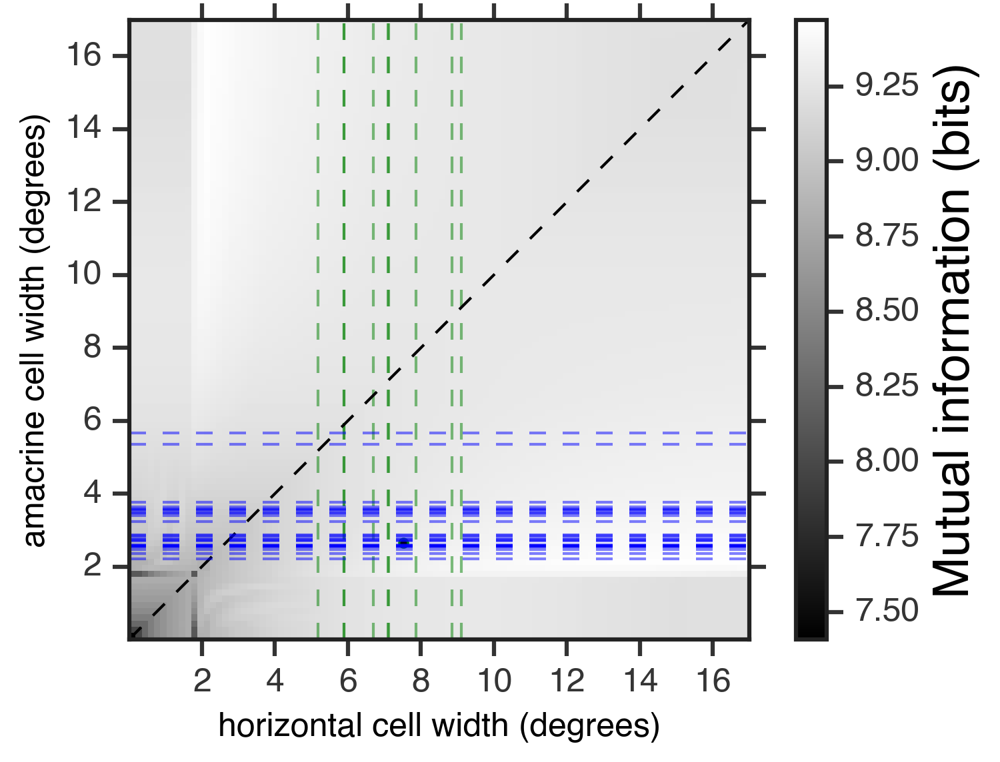

In [208]:
plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
# plt.scatter(popt_ama[0], popt_horz[0], c='k', edgecolor='g', linewidth=0.8)
# for interneuron_type in interneuron_fits.keys():
for horz_fit in interneuron_fits['horizontal']:
    plt.vlines(horz_fit, widths[0], widths[-1], color='g', linewidth=1, linestyle='--', alpha=0.5)
for ama_fit in interneuron_fits['amacrine']:
    plt.plot(widths, ama_fit * np.ones_like(widths), 'b--', linewidth=1, alpha=0.5)
plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

### Try contour plot

In [209]:
count_horz, horz_edges = np.histogram(interneuron_fits['horizontal'], bins=widths)
count_ama, ama_edges = np.histogram(interneuron_fits['amacrine'], bins=widths)

<Container object of 99 artists>

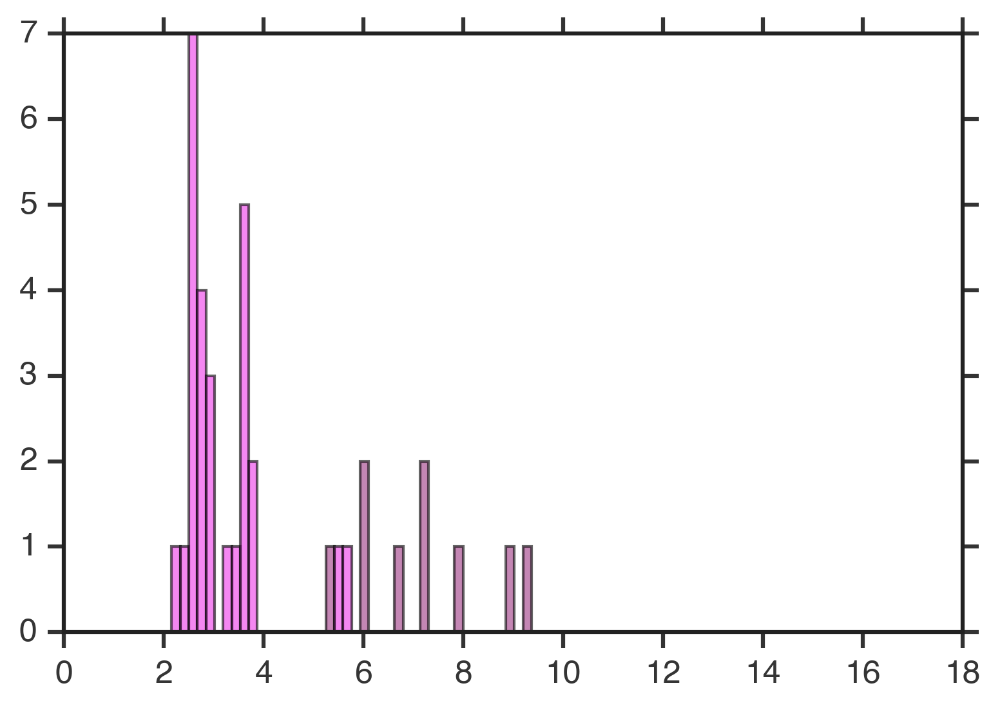

In [210]:
bar_width = np.mean(np.diff(horz_edges))
plt.bar(horz_edges[:-1] + bar_width/2, count_horz, width=bar_width, color=np.random.rand(3), alpha=0.6)
plt.bar(ama_edges[:-1] + bar_width/2, count_ama, width=bar_width, color=np.random.rand(3), alpha=0.6)

<Container object of 49 artists>

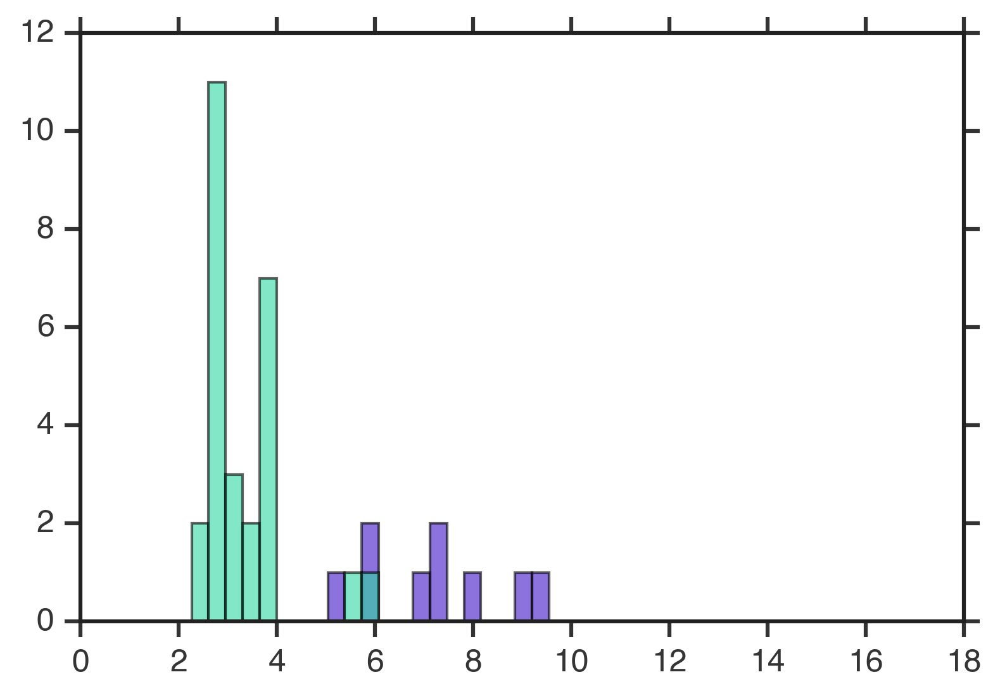

In [211]:
widths_high_res = np.linspace(widths[0], widths[-1], 50)
count_horz, horz_edges = np.histogram(interneuron_fits['horizontal'], bins=widths_high_res)
count_ama, ama_edges = np.histogram(interneuron_fits['amacrine'], bins=widths_high_res)

bar_width = np.mean(np.diff(horz_edges))
plt.bar(horz_edges[:-1] + bar_width/2, count_horz, width=bar_width, color=np.random.rand(3), alpha=0.6)
plt.bar(ama_edges[:-1] + bar_width/2, count_ama, width=bar_width, color=np.random.rand(3), alpha=0.6)

2d histogram

In [212]:
interneuron_pairs = np.outer(count_horz, count_ama)

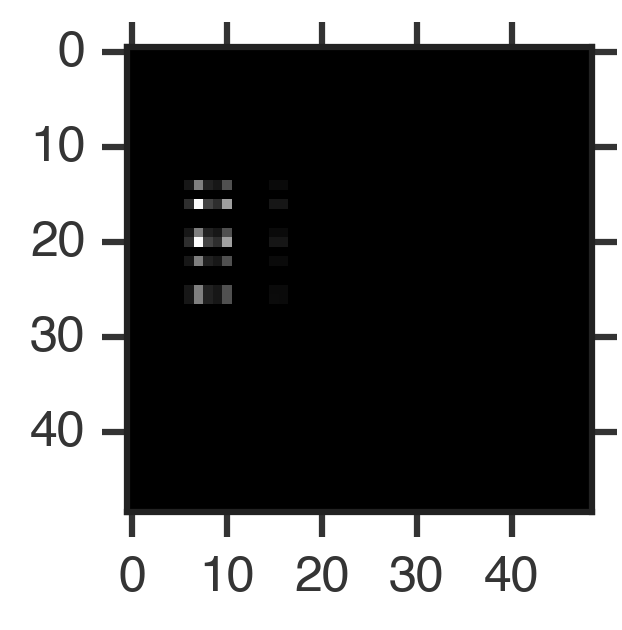

In [213]:
fig = plt.gcf()
fig.set_size_inches((2,2))
plt.imshow(interneuron_pairs)

(0.01, 17.0)

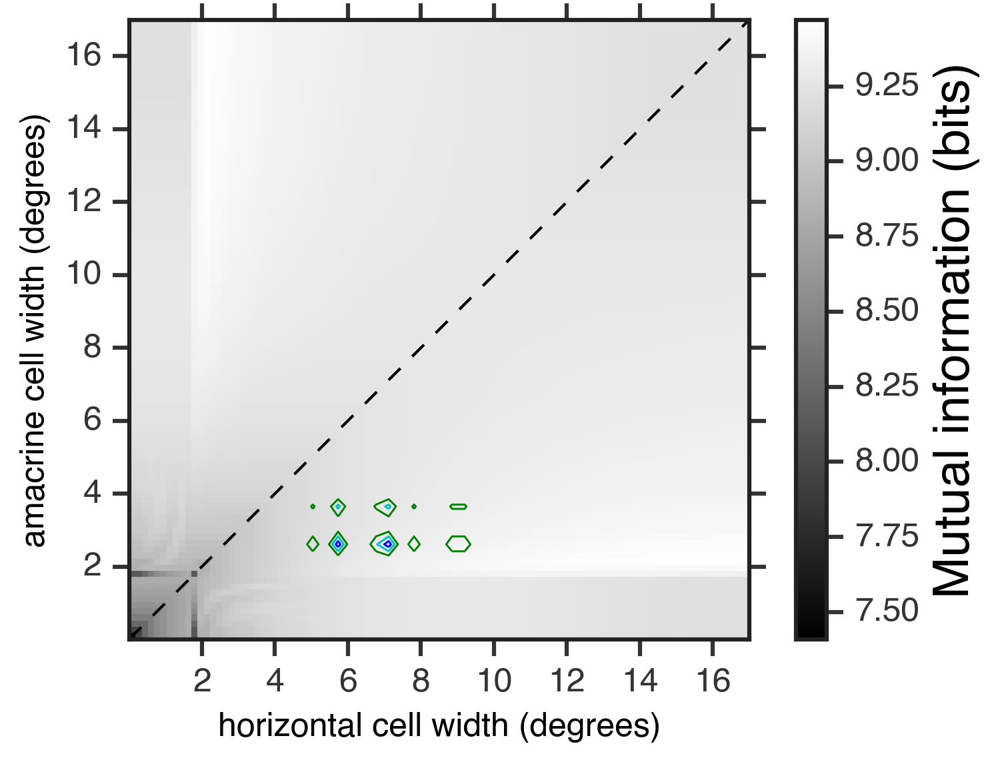

In [214]:
plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=['g', 'c', 'b'])
# plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

(0.01, 17.0)

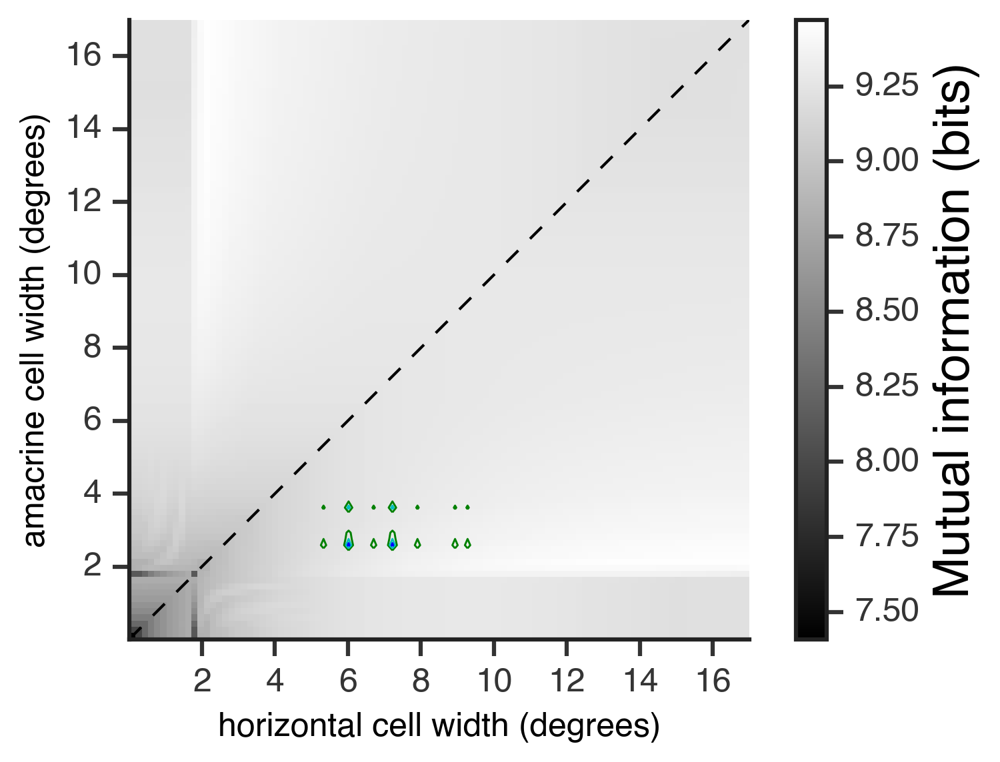

In [215]:
widths_high_res = widths #np.linspace(widths[0], widths[-1], 50)
count_horz, horz_edges = np.histogram(interneuron_fits['horizontal'], bins=widths_high_res)
count_ama, ama_edges = np.histogram(interneuron_fits['amacrine'], bins=widths_high_res)

interneuron_pairs = np.outer(count_horz, count_ama)

plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=['g', 'c', 'b'])
# plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])

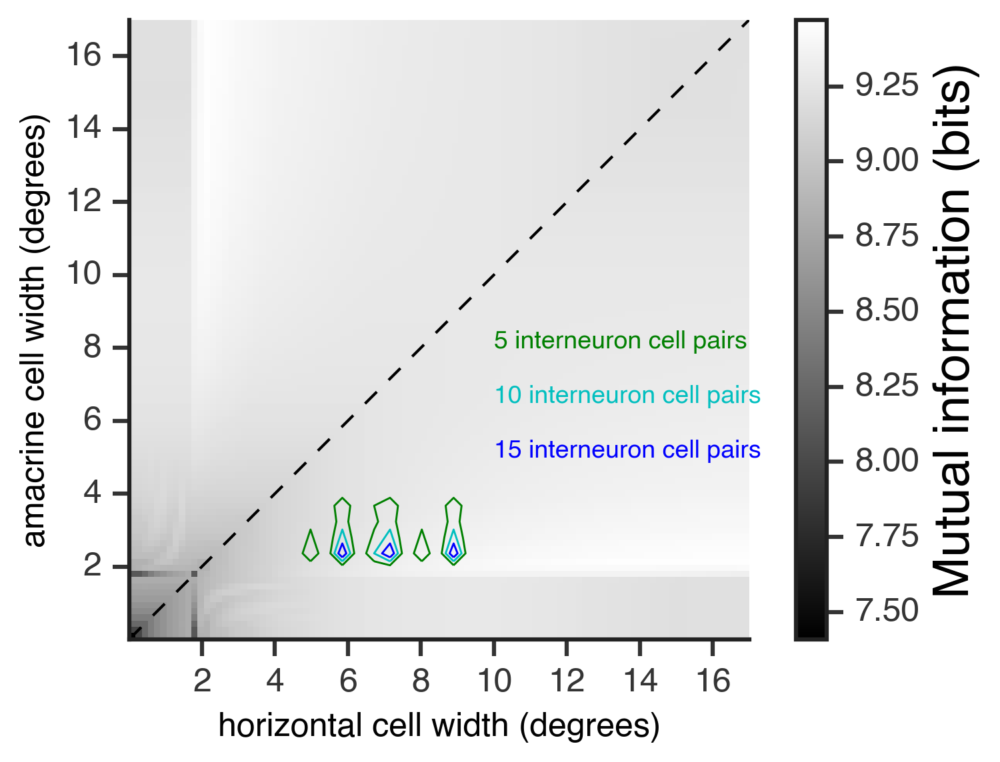

In [216]:
widths_high_res = np.linspace(widths[0], widths[-1], 40)
count_horz, horz_edges = np.histogram(interneuron_fits['horizontal'], bins=widths_high_res)
count_ama, ama_edges = np.histogram(interneuron_fits['amacrine'], bins=widths_high_res)

interneuron_pairs = np.outer(count_horz, count_ama)

plt.imshow(max_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)
# manual_locations= [(20,10), (20, 8), (10.1, 6)]
# plt.clabel(CS, inline=1, fontsize=8, manual=manual_locations)
contour_counts = CS.levels
for i,c in enumerate(contour_counts):
    plt.text(10, 8-1.5*i, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])
    

# plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])
plt.savefig('12-2 varying inhibitory spatial scale with data.pdf')

In [217]:
np.unique(interneuron_pairs)

array([ 0,  2,  4,  5,  6,  8, 10, 12, 20])

In [218]:
np.sum(interneuron_pairs)

243

In [219]:
len(interneuron_fits['horizontal'])

9

In [220]:
len(interneuron_fits['amacrine'])

27

In [516]:
microns_per_degree

50.0

In [511]:
np.min(interneuron_fits['amacrine'])

2.2192996983687578

In [512]:
np.max(interneuron_fits['amacrine'])

5.6701740410620065

In [513]:
np.min(interneuron_fits['horizontal'])

5.1812738014299189

In [514]:
np.max(interneuron_fits['horizontal'])

9.1126349080519002

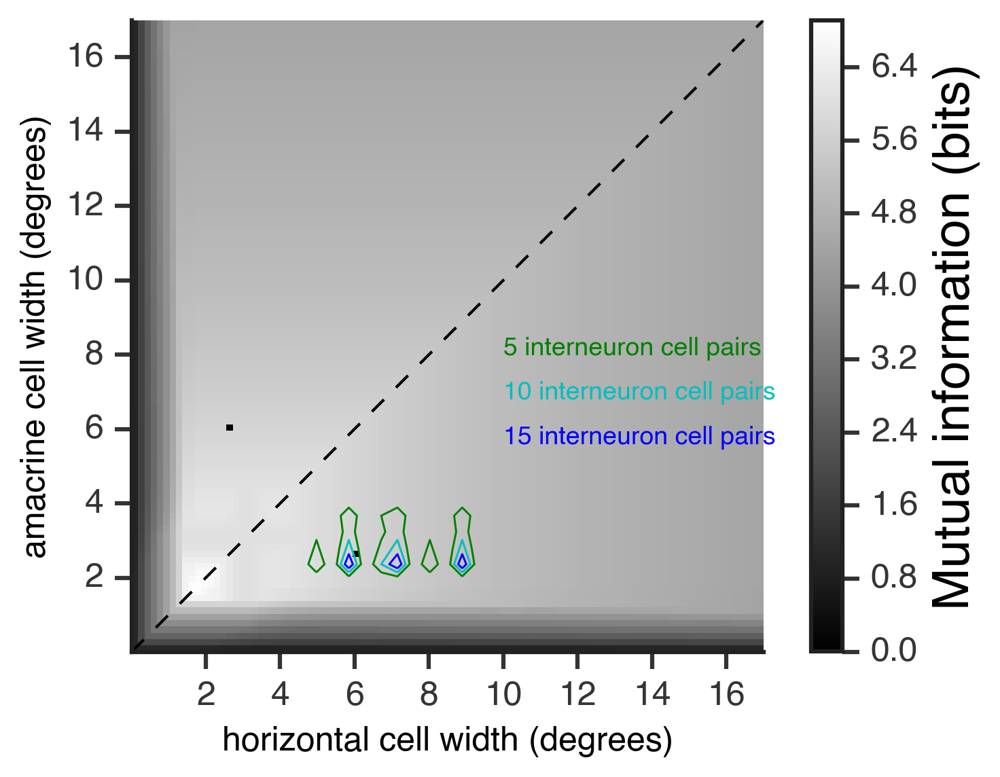

In [221]:
plt.imshow(min_info_vs_width, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)
# manual_locations= [(20,10), (20, 8), (10.1, 6)]
# plt.clabel(CS, inline=1, fontsize=8, manual=manual_locations)
contour_counts = CS.levels
for i,c in enumerate(contour_counts):
    plt.text(10, 8-1.2*i, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])
    

# plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[0], widths[-1])
plt.ylim(widths[0], widths[-1])
plt.savefig('12-2 varying inhibitory spatial scale with data.pdf')

### what do the shapes of ffts look like at each point in this space?

In [222]:
max_info_ffts = np.zeros((len(widths), len(widths), len(average_ganglion_fft)))
max_info_params = collections.defaultdict(list)

center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)

for idw1,w1 in enumerate(widths):
    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)
    for idw2,w2 in enumerate(widths[idw1:]):
        surround2 = gaussian(x=space, sigma=w2, mu=0.)
        surround2 /= np.sum(surround2)

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        this_map = infos_varying_width[celltype][(w1,w2)]
        which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
        hw = horz_weights[which_fft[0]]
        cw = center_weights[which_fft[1]]
        max_info_params['hw'].append(hw)
        max_info_params['cw'].append(cw)
        
        rf_filt = abs(np.fft.rfft(rf_model(hw, cw)))
        
        # constrain model
        def constrain_filt_power(filt_const):
            size = len(rf_filt)
            output_power = np.sum((signal*filt_const*rf_filt)**2 
                                  + (input_noise*filt_const*rf_filt)**2
                                  + output_noise**2)

            return (target_power - output_power)**2

        filt_const_opt = scipy.optimize.minimize(constrain_filt_power, init_filt_const)
        iterations = 0
        new_init_filt_const = init_filt_const
        while not filt_const_opt.success:
            iterations += 1
            new_init_filt_const *= 10
            filt_const_opt = scipy.optimize.minimize(constrain_filt_power, new_init_filt_const)
            if iterations > 10:
                print(filt_const_opt)
                break

        filt_const = abs(filt_const_opt['x'])
        
        
        max_info_ffts[idw1, idw2+idw1] = filt_const * rf_filt
        max_info_ffts[idw2+idw1, idw1] = max_info_ffts[idw1, idw2+idw1]

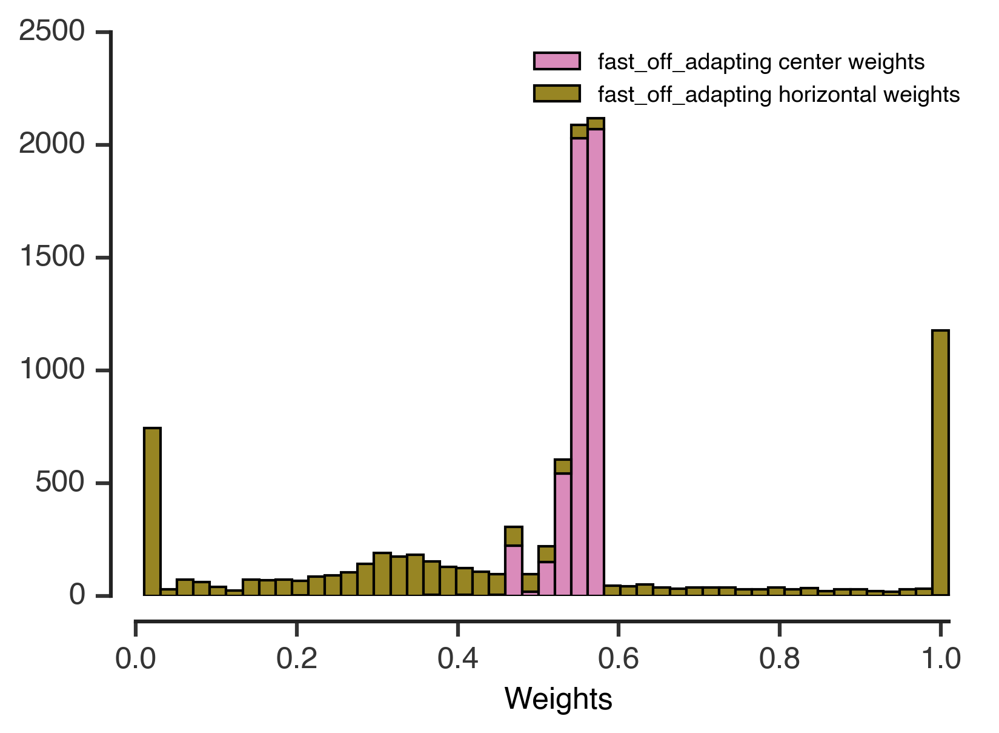

In [223]:
cws = np.array(max_info_params['cw'])
hws = np.array(max_info_params['hw'])
bins = np.linspace(-0.0, 1.0, 50)
# bins = np.linspace(0,30,50)
counts, bins = np.histogram(cws, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s center weights' %celltype)

counts_surr, bins_surr = np.histogram(hws, bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts_surr, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s horizontal weights' %celltype, bottom=counts)

plt.xlim(0,1.05)
plt.xlabel('Weights')
adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

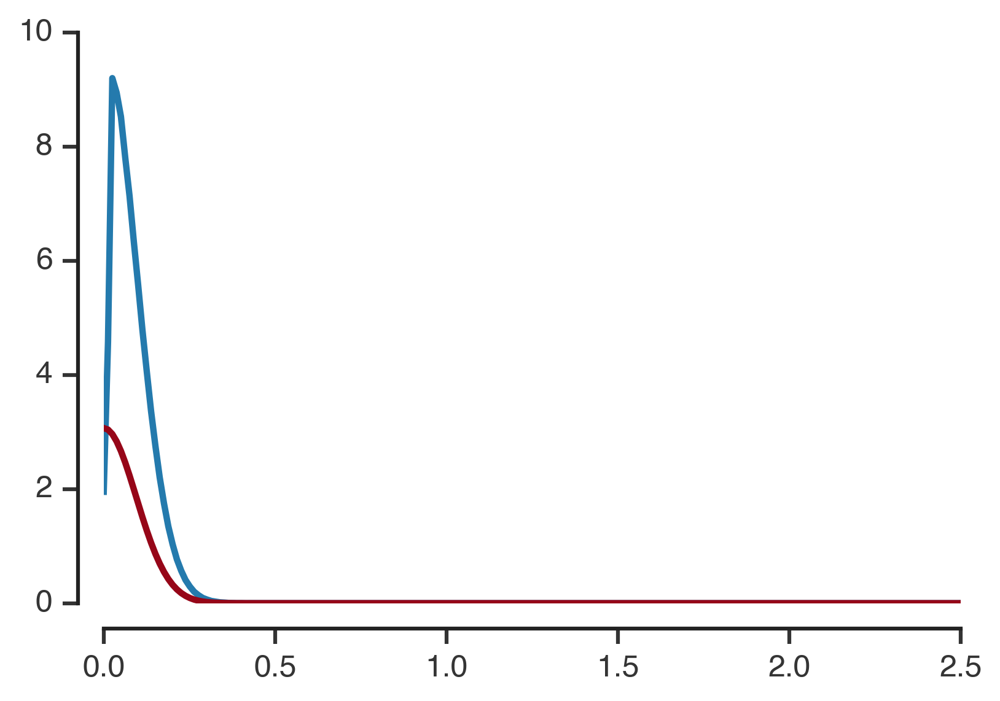

In [224]:
plt.plot(freqs, max_info_ffts[-1, -1])
plt.plot(freqs, max_info_ffts[0, 0])
adjust_spines(plt.gca())

In [225]:
np.sum((signal*max_info_ffts[0, 0])**2 + (input_noise*max_info_ffts[0, 0])**2 + output_noise**2)

54.131411123972484

In [226]:
np.sum((signal*max_info_ffts[-1, -1])**2 + (input_noise*max_info_ffts[-1, -1])**2 + output_noise**2)

54.131410961898588

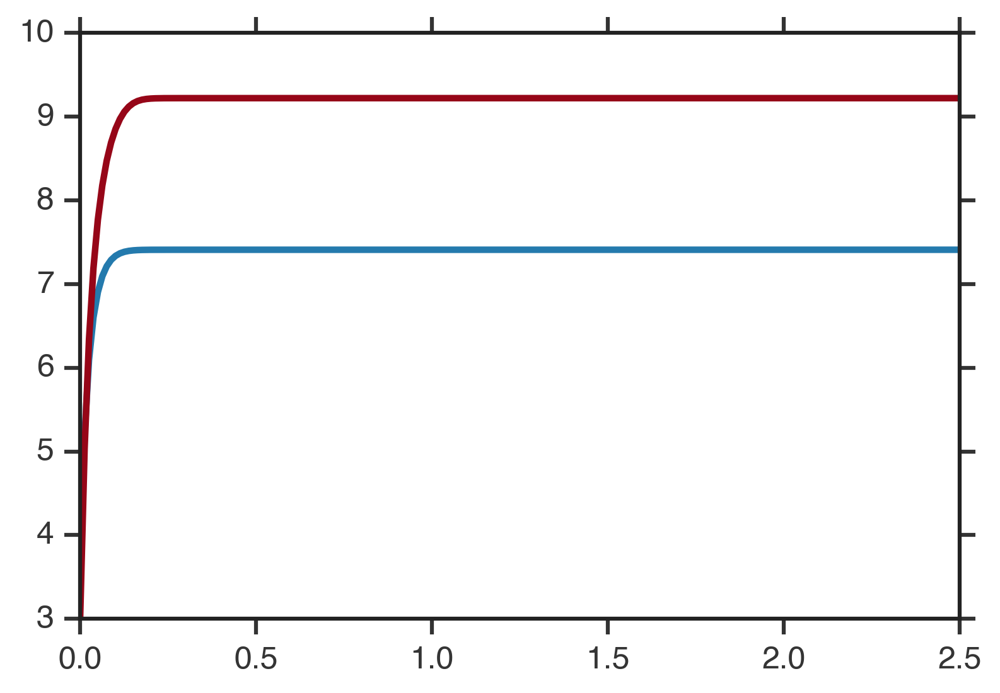

In [227]:
is1 = 0
is2 = 0
signal_power = (max_info_ffts[is1, is2] * signal)**2
noise_power = (max_info_ffts[is1, is2] * input_noise)**2 + output_noise**2
this_info = 0.5*np.log2(1 + signal_power/noise_power)
plt.plot(freqs, np.cumsum(this_info))

is1 = -1
is2 = -1
signal_power = (max_info_ffts[is1, is2] * signal)**2
noise_power = (max_info_ffts[is1, is2] * input_noise)**2 + output_noise**2
this_info = 0.5*np.log2(1 + signal_power/noise_power)
plt.plot(freqs, np.cumsum(this_info))

In [228]:
np.min(max_info_vs_width)

7.4100112393745237

# Get angle between RFs

In [229]:
def angle(rf1, rf2):
    a = np.arccos(np.inner(rf1, rf2)/(np.sqrt(np.sum(rf1**2)) * np.sqrt(np.sum(rf2**2))))
    return np.min([a, abs(a - 2*np.pi)])

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


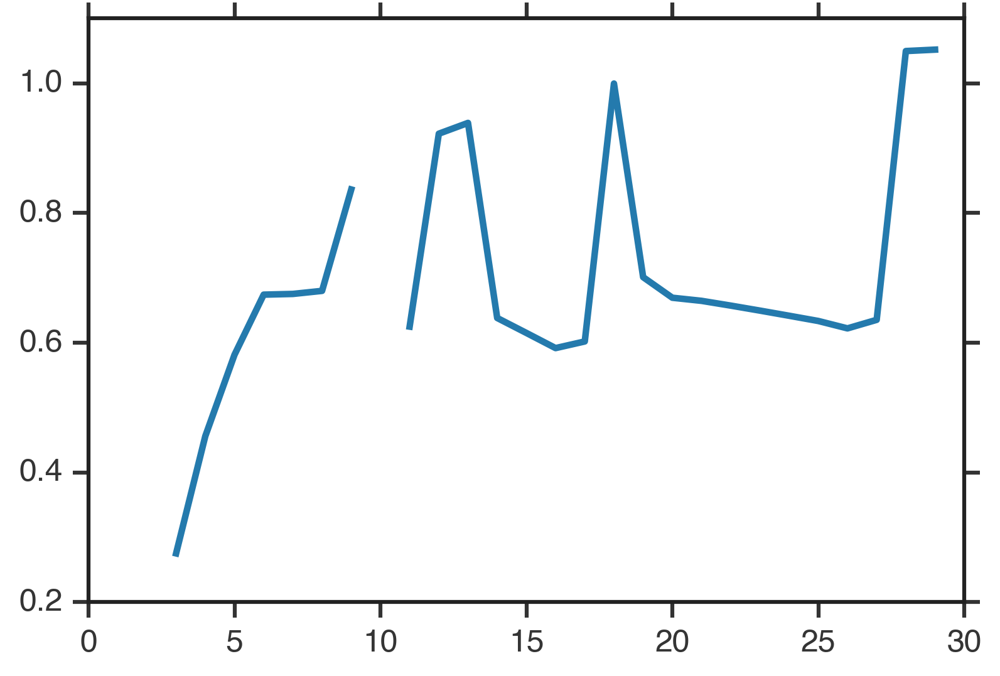

In [230]:
plt.plot([angle(max_info_ffts[2, 0], max_info_ffts[2, i]) for i in range(30)])

## Get angle difference in RFs as you traverse in vertical direction at peak information  
By vertical direction I mean horizontal (1 - amacrine) difference.  
Note that we can ignore the power constraint, since normalizing by a constant doesn't change the angle.

In [231]:
max_angles_fft = np.zeros((len(widths), len(widths)))
max_angles_rf = np.zeros((len(widths), len(widths)))
info_difference = np.zeros((len(widths), len(widths)))

center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)

for idw1,w1 in enumerate(widths):
    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)
    for idw2,w2 in enumerate(widths[idw1:]):
        surround2 = gaussian(x=space, sigma=w2, mu=0.)
        surround2 /= np.sum(surround2)

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        this_map = infos_varying_width[celltype][(w1,w2)]
        which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
        hw = horz_weights[which_fft[0]]
        cw = center_weights[which_fft[1]]
        
        rf = rf_model(hw, cw)
        rf_filt = abs(np.fft.rfft(rf))
        this_info = infos_varying_width[celltype][(w1,w2)][which_fft[0], which_fft[1]]
        max_angle_fft = 0
        max_angle_rf = 0
        for idh,hw in enumerate(horz_weights):
            new_rf = rf_model(hw, cw)
            new_filt = abs(np.fft.rfft(new_rf))
            new_rf_angle = angle(rf, new_rf)
            new_fft_angle = angle(rf_filt, new_filt)
            
            if new_rf_angle > max_angle_rf:
                max_angle_rf = new_rf_angle
            if new_fft_angle > max_angle_fft:
                max_angle_fft = new_fft_angle
                new_info = infos_varying_width[celltype][(w1,w2)][idh, which_fft[1]]
                associated_info_diff = new_info/this_info
                
        max_angles_rf[idw1, idw2+idw1] = max_angle_rf
        max_angles_rf[idw2+idw1, idw1] = max_angle_rf
        max_angles_fft[idw1, idw2+idw1] = max_angle_fft
        max_angles_fft[idw2+idw1, idw1] = max_angle_fft
        info_difference[idw1, idw2+idw1] = associated_info_diff
        info_difference[idw2+idw1, idw1] = associated_info_diff

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


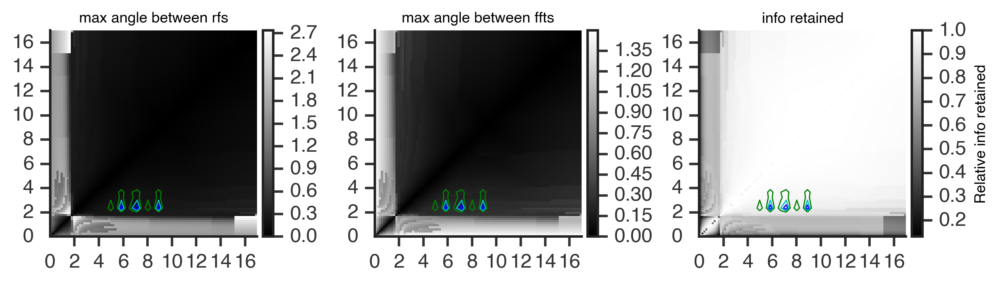

In [232]:
fig = plt.gcf()
fig.set_size_inches((10,2.25))

ax = plt.subplot(131)
im = plt.imshow(max_angles_rf, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.title('max angle between rfs', fontsize=9)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax1)


ax = plt.subplot(132)
im = plt.imshow(max_angles_fft, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.title('max angle between ffts', fontsize=9)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax2)

ax = plt.subplot(133)
im = plt.imshow(info_difference, origin='bottom left', extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.title('info retained', fontsize=9)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax3 = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax3)
cbar.ax.set_ylabel('Relative info retained', fontsize=9)

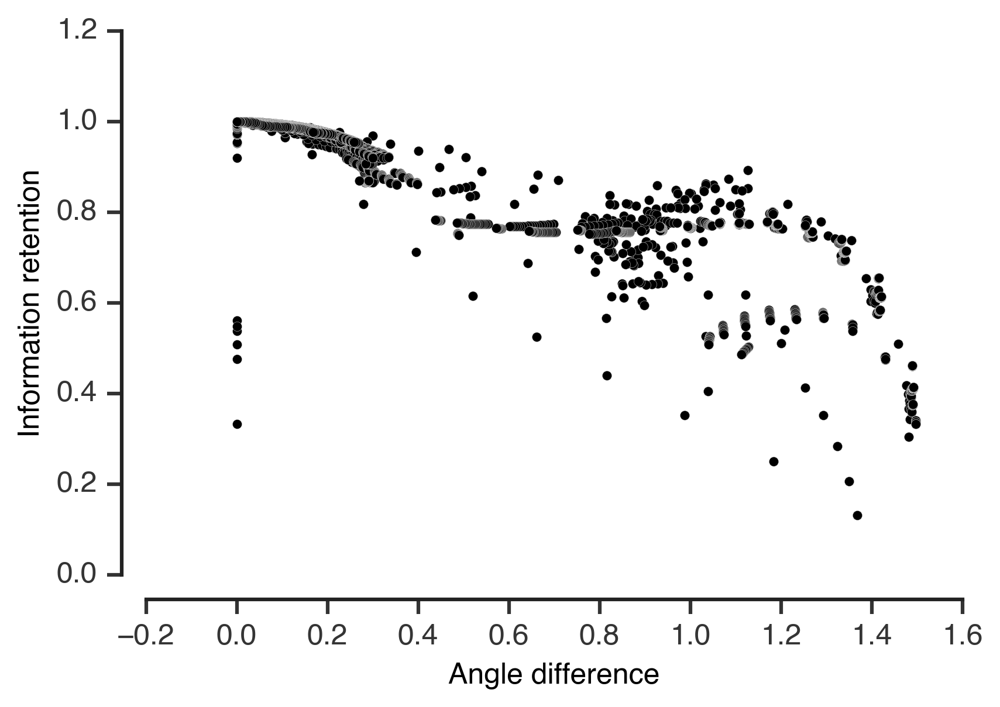

In [233]:
plt.scatter(max_angles_fft.ravel(), info_difference.ravel(), color='k', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information retention')
adjust_spines(plt.gca())

In [234]:
angles = max_angles_fft.ravel()
infos = info_difference.ravel()
max_info = 0
for i,a in enumerate(angles):
    if a > 0.5:
        if infos[i] > max_info:
            max_info = infos[i]
            best_index = np.unravel_index(i, info_difference.shape)

In [235]:
max_angles_fft[best_index]

0.50564653312000207

In [236]:
info_difference[best_index]

0.92122850174002557

In [237]:
widths[1]

0.18161616161616162

In [238]:
widths[8]

1.3829292929292929

In [239]:
angles = max_angles_fft.ravel()
infos = info_difference.ravel()
max_info = 0
for i,a in enumerate(angles):
    if a > 0.1:
        if infos[i] > max_info:
            max_info = infos[i]
            best_index = np.unravel_index(i, info_difference.shape)

In [240]:
max_angles_fft[best_index]

0.10029034261264337

In [241]:
info_difference[best_index]

0.9939255604842322

In [242]:
widths[best_index[0]]

5.3301010101010098

In [243]:
widths[best_index[1]]

7.2178787878787878

In [244]:
best_indices = []
thresholds = np.linspace(0.01, 0.5, 20)
for thresh in thresholds:
    angles = max_angles_fft.ravel()
    infos = info_difference.ravel()
    max_info = 0
    for i,a in enumerate(angles):
        if a > thresh:
            if infos[i] > max_info:
                max_info = infos[i]
                best_index = np.unravel_index(i, info_difference.shape)
    best_indices.append(best_index)

In [245]:
np.stack(best_indices).shape

(20, 2)

In [246]:
best_indices

[(53, 57),
 (41, 46),
 (37, 46),
 (32, 41),
 (29, 40),
 (26, 38),
 (24, 40),
 (21, 35),
 (3, 4),
 (2, 3),
 (2, 3),
 (2, 3),
 (4, 6),
 (1, 2),
 (1, 2),
 (1, 2),
 (1, 2),
 (1, 2),
 (2, 4),
 (2, 4)]

In [247]:
w1s = [widths[i] for i in np.stack(best_indices)[:, 0]]
w2s = [widths[i] for i in np.stack(best_indices)[:, 1]]
for w1s, w2s in zip(w1s, w2s):
    print('%0.2f, %0.2f' %(w1s, w2s))

9.11, 9.79
7.05, 7.90
6.36, 7.90
5.50, 7.05
4.99, 6.87
4.47, 6.53
4.13, 6.87
3.61, 6.02
0.52, 0.70
0.35, 0.52
0.35, 0.52
0.35, 0.52
0.70, 1.04
0.18, 0.35
0.18, 0.35
0.18, 0.35
0.18, 0.35
0.18, 0.35
0.35, 0.70
0.35, 0.70


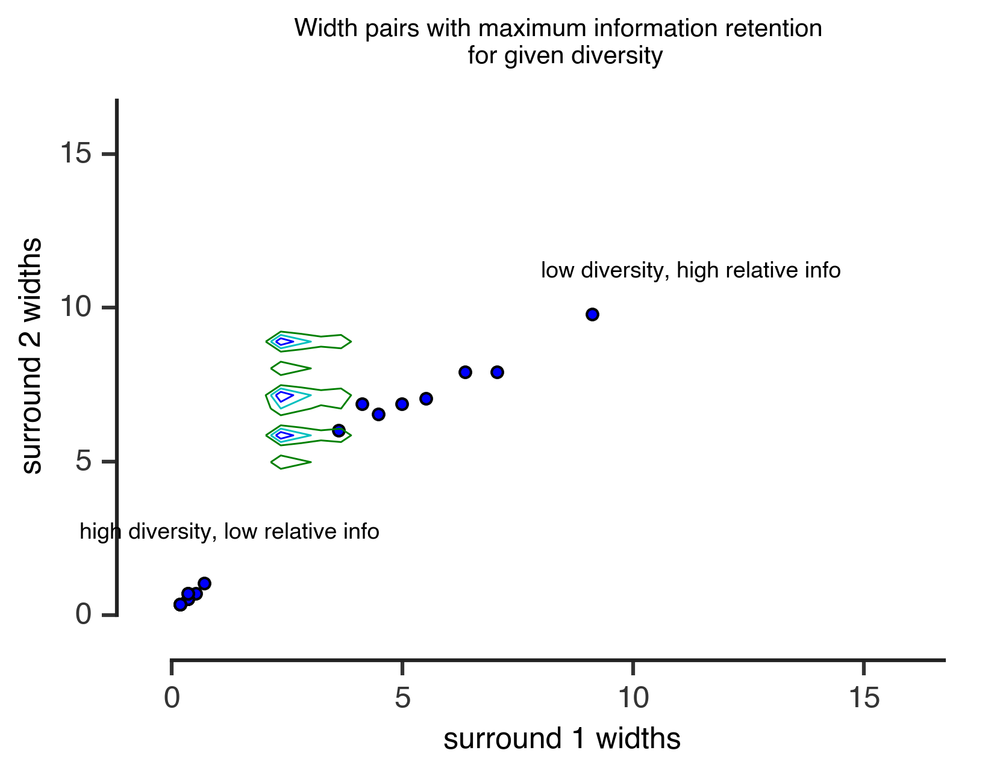

In [248]:
plt.scatter([widths[i] for i in np.stack(best_indices)[:, 0]], 
            [widths[i] for i in np.stack(best_indices)[:, 1]])
plt.text(-2, 2.5, 'high diversity, low relative info', fontsize=9, color='k')
plt.text(8, 11, 'low diversity, high relative info', fontsize=9, color='k')

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(Y, X, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)
# manual_locations= [(20,10), (20, 8), (10.1, 6)]
# plt.clabel(CS, inline=1, fontsize=8, manual=manual_locations)
contour_counts = CS.levels
    
plt.xlabel('surround 1 widths')
plt.ylabel('surround 2 widths')
plt.title('Width pairs with maximum information retention \n for given diversity', fontsize=10)
adjust_spines(plt.gca())

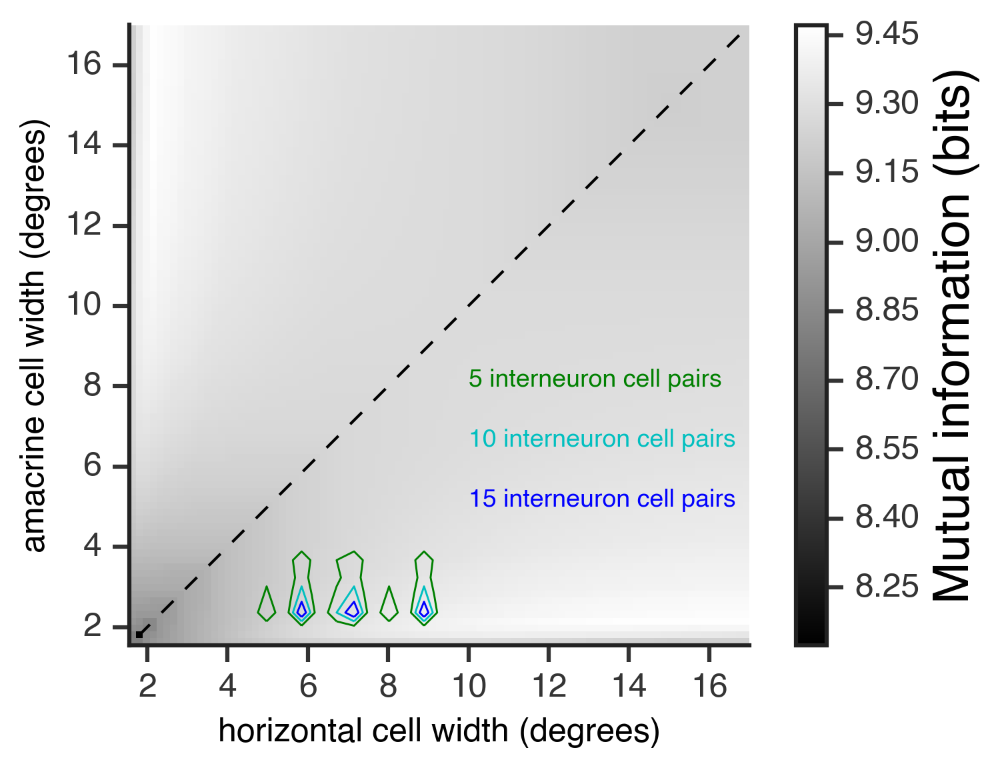

In [249]:
starting_width_idx = 9
widths_high_res = np.linspace(widths[0], widths[-1], 40)
count_horz, horz_edges = np.histogram(interneuron_fits['horizontal'], bins=widths_high_res)
count_ama, ama_edges = np.histogram(interneuron_fits['amacrine'], bins=widths_high_res)

interneuron_pairs = np.outer(count_horz, count_ama)

plt.imshow(max_info_vs_width[starting_width_idx:, starting_width_idx:], origin='bottom left', 
           extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
cbar = plt.colorbar()
cbar.ax.set_ylabel('Mutual information (bits)', fontsize=18)
plt.plot(widths, widths, 'k--', linewidth=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)
# manual_locations= [(20,10), (20, 8), (10.1, 6)]
# plt.clabel(CS, inline=1, fontsize=8, manual=manual_locations)
contour_counts = CS.levels
for i,c in enumerate(contour_counts):
    plt.text(10, 8-1.5*i, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])
    

# plt.scatter(popt_horz[0], popt_ama[0], c='k', edgecolor='g', linewidth=0.8, s=10)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xlabel('horizontal cell width (degrees)')
plt.ylabel('amacrine cell width (degrees)')
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.savefig('12-2 varying inhibitory spatial scale with data.pdf')

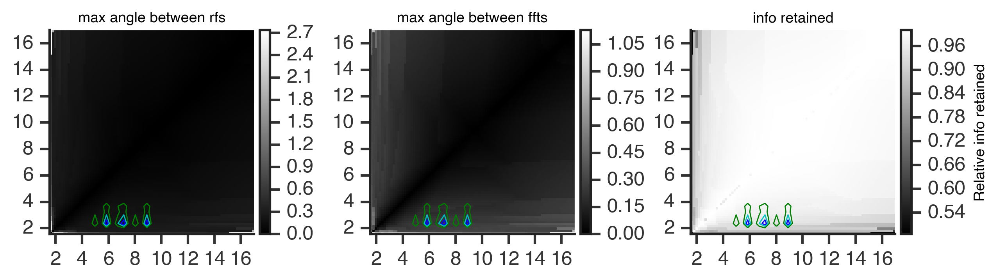

In [250]:
starting_width_idx = 9
fig = plt.gcf()
fig.set_size_inches((10,2.25))

ax = plt.subplot(131)
im = plt.imshow(max_angles_rf[starting_width_idx:, starting_width_idx:], origin='bottom left',
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('max angle between rfs', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax1)


ax = plt.subplot(132)
im = plt.imshow(max_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('max angle between ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax2)

ax = plt.subplot(133)
im = plt.imshow(info_difference[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('info retained', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax3 = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax3)
cbar.ax.set_ylabel('Relative info retained', fontsize=9)

In [251]:
with h5py.File('infos_varying_width.h5', 'w') as f:
    for key in infos_varying_width['fast_off_adapting'].keys():
        f.create_dataset('%s' %str(key), data=infos_varying_width['fast_off_adapting'][key])

### To do:  
change diversity angle to be abs angle (mod pi)  

change info retention to absolute metric - like mean(info along vertical line)/max(info across all possible widths)  

plot interneuron pairs on the scatter plot of information vs diversity

#### Absolute angle should be something like this:

In [252]:
np.min([3.5, abs(3.5 - 2*np.pi)])

2.7831853071795862

#### Plot interneuron pairs on scatter plot of info vs diversity

In [253]:
differences = [h - widths for h in interneuron_fits['horizontal']]
[np.min(abs(d)) for d in differences]

[0.050120953206876706,
 0.084646987127262818,
 0.0024245753442944107,
 0.0069783423953353463,
 0.076809169981268965,
 0.040448631633677401,
 0.045343607363480309,
 0.022788952945070662,
 0.042549637037730292]

In [254]:
differences = [h - widths for h in interneuron_fits['amacrine']]
[np.min(abs(d)) for d in differences]

[0.0058898039994663698,
 0.019322313257402524,
 0.037750148683111995,
 0.024643228950024909,
 0.02762137052581215,
 0.018491795728041716,
 0.058557258712264471,
 0.052073398617626498,
 0.01223130050547061,
 0.038872441943998304,
 0.021710402641343052,
 0.042139122735322054,
 0.063591956959814677,
 0.020517299857578664,
 0.0076572206029625889,
 0.076614484301233521,
 0.037203534470407806,
 0.010249612905846472,
 0.036443498873897973,
 0.038704083886362373,
 0.042822339826352529,
 0.041868914713480532,
 0.025106006050091167,
 0.020221072870473478,
 0.081979206169262575,
 0.046827967341487309,
 0.003159292271326386]

In [255]:
max_angles_fft_data = []
max_angles_rf_data = []
info_difference_data = []

for h_width in interneuron_fits['horizontal']:
    surround2 = gaussian(x=space, sigma=h_width, mu=0.)
    surround2 /= np.sum(surround2)
    
    # choose the closest width in our lookup table
    w2_idx = np.argmin(np.abs(h_width - widths))
    w2 = widths[w2_idx]
    
    for a_width in interneuron_fits['amacrine']:
        surround1 = gaussian(x=space, sigma=a_width, mu=0.)
        surround1 /= np.sum(surround1)
        
        # choose the closest width in our lookup table
        w1_idx = np.argmin(np.abs(a_width - widths))
        w1 = widths[w1_idx]

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        if w1 > w2:
            print('Triggered! %f, %f' %(h_width, a_width))
            tmp = w1
            w1 = w2
            w2 = tmp
            
            def rf_model(horz_weight, center_weight):
                return center_weight*center + (1-center_weight)*(horz_weight*surround1 + (1-horz_weight)*surround2)
            
        this_map = infos_varying_width[celltype][(w1,w2)]
        which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
        hw = horz_weights[which_fft[0]]
        cw = center_weights[which_fft[1]]
        
        rf = rf_model(hw, cw)
        rf_filt = abs(np.fft.rfft(rf))
        this_info = infos_varying_width[celltype][(w1,w2)][which_fft[0], which_fft[1]]
        max_angle_fft = 0
        max_angle_rf = 0
        for idh,hw in enumerate(horz_weights):
            new_rf = rf_model(hw, cw)
            new_filt = abs(np.fft.rfft(new_rf))
            new_rf_angle = angle(rf, new_rf)
            new_fft_angle = angle(rf_filt, new_filt)
            
            if new_rf_angle > max_angle_rf:
                max_angle_rf = new_rf_angle
            if new_fft_angle > max_angle_fft:
                max_angle_fft = new_fft_angle
                new_info = infos_varying_width[celltype][(w1,w2)][idh, which_fft[1]]
                associated_info_diff = new_info/this_info
                
        max_angles_rf_data.append(max_angle_rf)
        max_angles_fft_data.append(max_angle_fft)
        info_difference_data.append(associated_info_diff)

Triggered! 5.181274, 5.350322
Triggered! 5.181274, 5.670174


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


In [256]:
real_angles_fft = [np.min([a, abs(a - 2*np.pi)]) for a in max_angles_fft.ravel()]

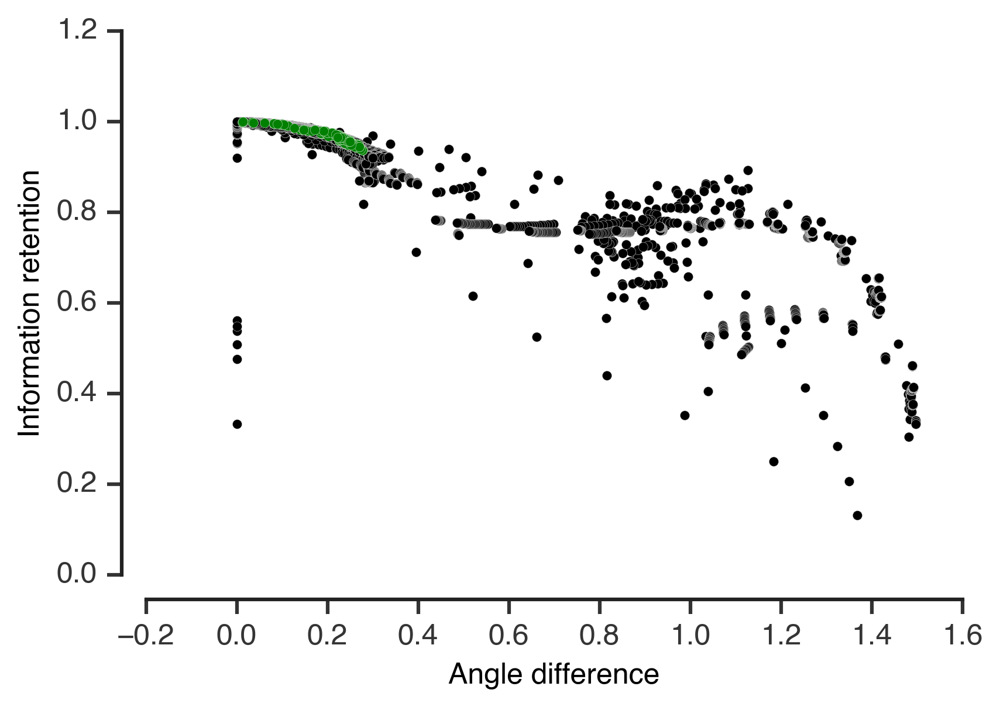

In [257]:
plt.scatter(real_angles_fft, info_difference.ravel(), color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(max_angles_fft_data, info_difference_data, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information retention')
adjust_spines(plt.gca())

### Note this is still the old information retention measure, we need to move to an absolute number

Get maximum information across all possible surround widths and horz, center weights

In [258]:
max_info = 0
for key in infos_varying_width[celltype].keys():
    this_map = infos_varying_width[celltype][key]
    if isinstance(this_map, np.ndarray):
        if max_info < np.max(this_map):
            max_width_pair = key
            max_info = np.max(this_map)

In [259]:
max_info

9.4720612730635256

In [260]:
angles_fft = np.zeros((len(widths), len(widths)))
angles_rf = np.zeros((len(widths), len(widths)))
info_difference = np.zeros((len(widths), len(widths)))

center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)

for idw1,w1 in enumerate(widths):
    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)
    for idw2,w2 in enumerate(widths[idw1:]):
        surround2 = gaussian(x=space, sigma=w2, mu=0.)
        surround2 /= np.sum(surround2)

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        this_map = infos_varying_width[celltype][(w1,w2)]
        which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
        hw = horz_weights[which_fft[0]]
        cw = center_weights[which_fft[1]]
        
        mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

        all_h_rf = rf_model(horz_weights[-1], cw)
        all_a_rf = rf_model(horz_weights[0], cw)
        
        all_h_fft = abs(np.fft.rfft(all_h_rf))
        all_a_fft = abs(np.fft.rfft(all_a_rf))
        
        angle_rf = angle(all_h_rf, all_a_rf)
        if np.isnan(angle_rf):
            angle_rf = 0
            
        angle_fft = angle(all_h_fft, all_a_fft)
        if np.isnan(angle_fft):
            angle_fft = 0
                
        angles_rf[idw1, idw2+idw1] = angle_rf
        angles_rf[idw2+idw1, idw1] = angle_rf
        angles_fft[idw1, idw2+idw1] = angle_fft
        angles_fft[idw2+idw1, idw1] = angle_fft
        info_difference[idw1, idw2+idw1] = mean_info/max_info
        info_difference[idw2+idw1, idw1] = mean_info/max_info

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


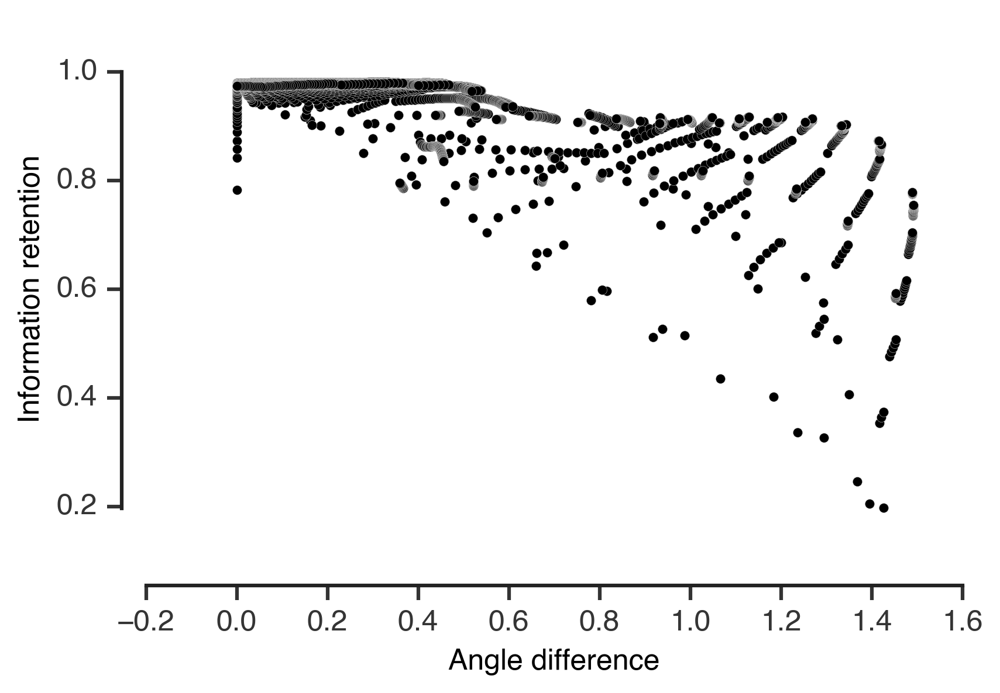

In [261]:
plt.scatter(angles_fft, info_difference.ravel(), color='k', edgecolor='w', linewidth=0.1, s=15)
# plt.scatter(max_angles_fft_data, info_difference_data, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information retention')
adjust_spines(plt.gca())

Same procedure but for our data

In [262]:
angles_fft_data = []
angles_rf_data = []
info_difference_data = []

for h_width in interneuron_fits['horizontal']:
    surround2 = gaussian(x=space, sigma=h_width, mu=0.)
    surround2 /= np.sum(surround2)
    
    # choose the closest width in our lookup table
    w2_idx = np.argmin(np.abs(h_width - widths))
    w2 = widths[w2_idx]
    
#     surround2 = gaussian(x=space, sigma=w2, mu=0.)
#     surround2 /= np.sum(surround2)
    
    for a_width in interneuron_fits['amacrine']:
        surround1 = gaussian(x=space, sigma=a_width, mu=0.)
        surround1 /= np.sum(surround1)
        
        # choose the closest width in our lookup table
        w1_idx = np.argmin(np.abs(a_width - widths))
        w1 = widths[w1_idx]
        
#         surround1 = gaussian(x=space, sigma=w1, mu=0.)
#         surround1 /= np.sum(surround1)

        def rf_model(horz_weight, center_weight):
            return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

        if w1 > w2:
            print('Triggered! %f, %f' %(h_width, a_width))
            tmp = w1
            w1 = w2
            w2 = tmp
            
            def rf_model(horz_weight, center_weight):
                return center_weight*center + (1-center_weight)*(horz_weight*surround1 + (1-horz_weight)*surround2)
            
        this_map = infos_varying_width[celltype][(w1,w2)]
        which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
        hw = horz_weights[which_fft[0]]
        cw = center_weights[which_fft[1]]
        
        mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

        all_h_rf = rf_model(horz_weights[-1], cw)
        all_a_rf = rf_model(horz_weights[0], cw)
        
        all_h_fft = abs(np.fft.rfft(all_h_rf))
        all_a_fft = abs(np.fft.rfft(all_a_rf))
                
        angles_rf_data.append(angle(all_h_rf, all_a_rf))
        angles_fft_data.append(angle(all_h_fft, all_a_fft))
        info_difference_data.append(mean_info/max_info)

Triggered! 5.181274, 5.350322
Triggered! 5.181274, 5.670174


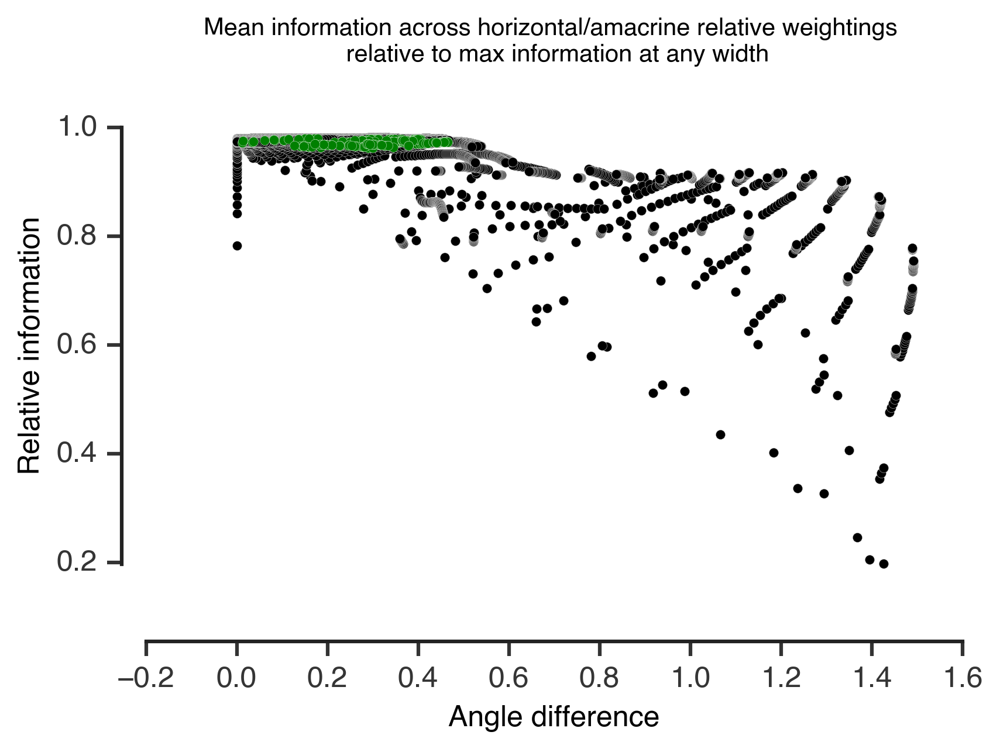

In [263]:
plt.scatter(angles_fft, info_difference.ravel(), color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(angles_fft_data, info_difference_data, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Relative information')
plt.title('Mean information across horizontal/amacrine relative weightings \n relative to max information at any width',
         fontsize=10)
adjust_spines(plt.gca())

(0.9, 1)

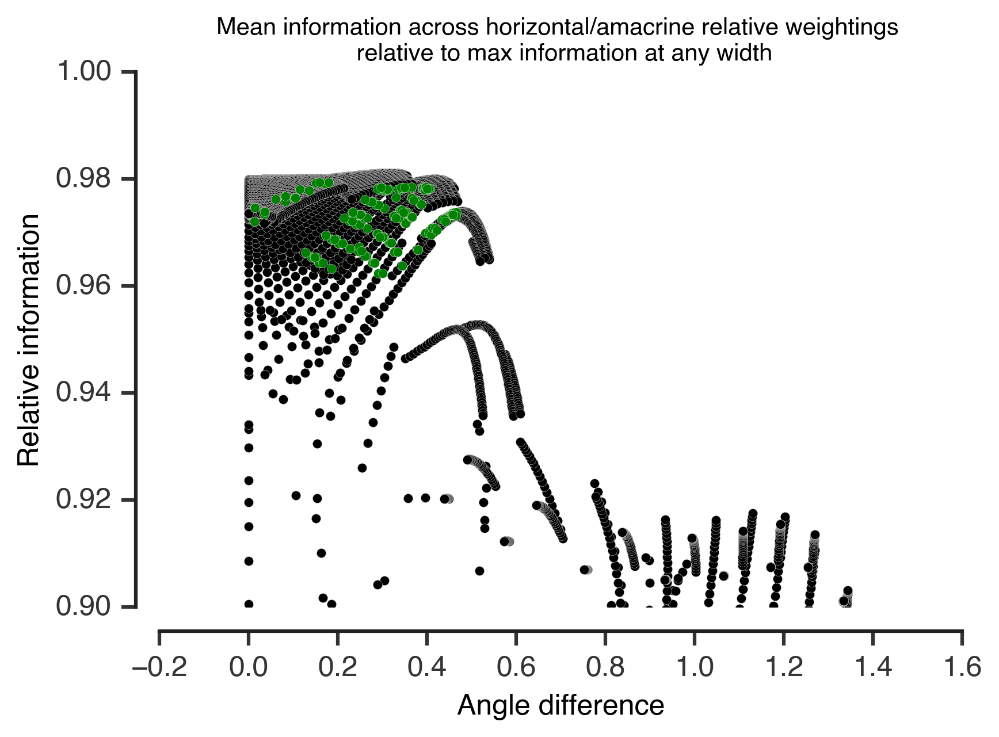

In [264]:
plt.scatter(angles_fft, info_difference.ravel(), color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(angles_fft_data, info_difference_data, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Relative information')
plt.title('Mean information across horizontal/amacrine relative weightings \n relative to max information at any width',
         fontsize=10)
adjust_spines(plt.gca())
plt.ylim(0.9,1)

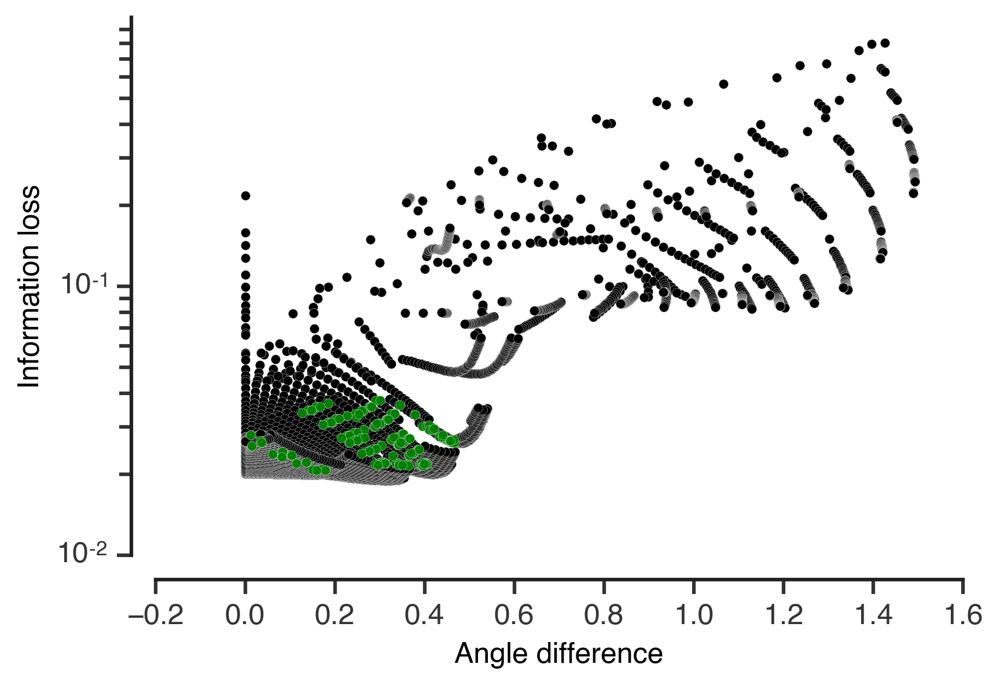

In [265]:
eps = 10e-16
plt.scatter(angles_fft, 1 - info_difference.ravel() + eps, color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(angles_fft_data, 1 - np.array(info_difference_data) + eps, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information loss')
adjust_spines(plt.gca())
plt.yscale('log')
# ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
# plt.tick_params(axis='y', which='minor')
# ax.yaxis.set_minor_formatter(FormatStrFormatter("%.2f"))

In [266]:
from matplotlib.ticker import FormatStrFormatter

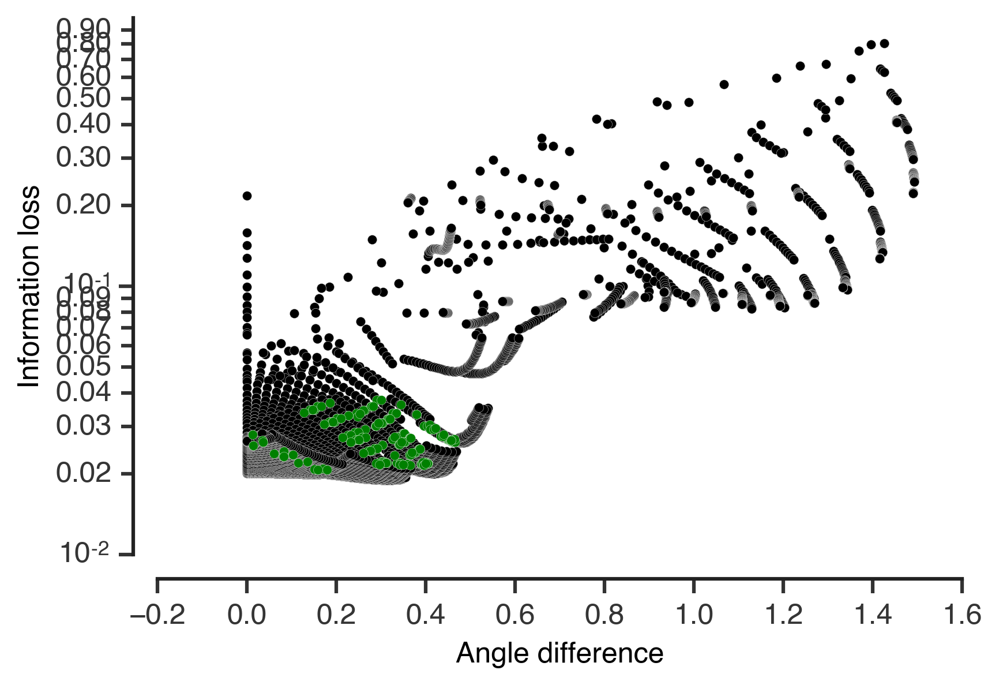

In [267]:
eps = 10e-16
plt.scatter(angles_fft, 1 - info_difference.ravel() + eps, color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(angles_fft_data, 1 - np.array(info_difference_data) + eps, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information loss')
adjust_spines(plt.gca())
plt.yscale('log')
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.2f"))

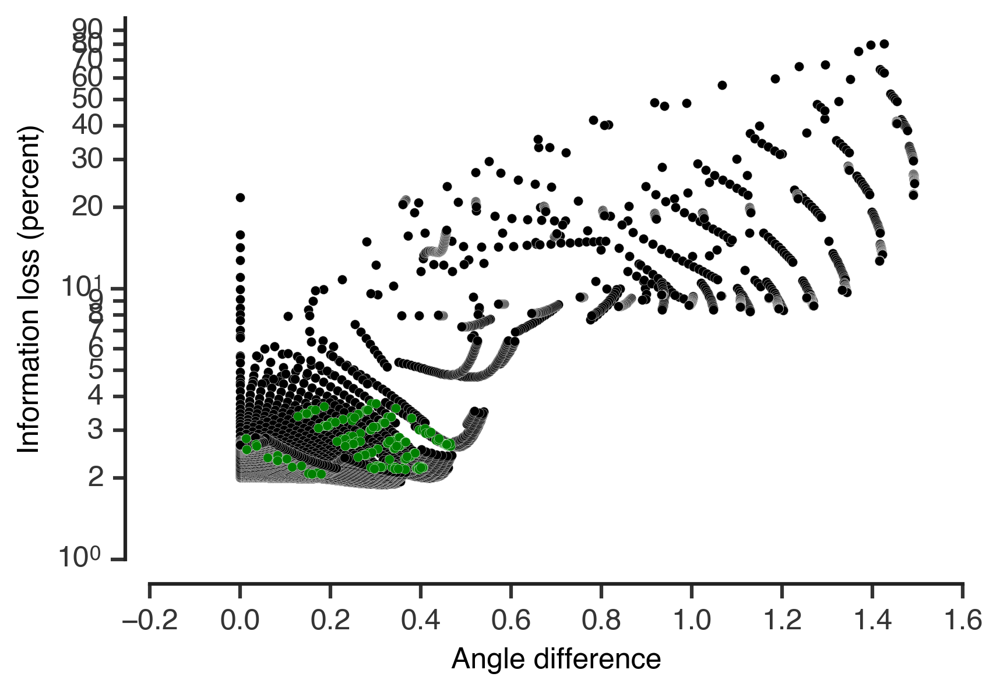

In [268]:
eps = 10e-10
plt.scatter(angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)
plt.scatter(angles_fft_data, 100*(1 - np.array(info_difference_data)) + eps, color='g', edgecolor='w', linewidth=0.1, s=15)
plt.xlabel('Angle difference')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))

Angle plots with new angle and information measure:

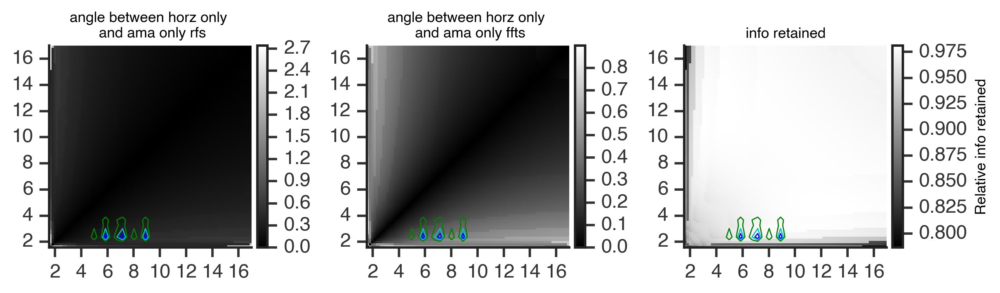

In [269]:
starting_width_idx = 9
fig = plt.gcf()
fig.set_size_inches((10,2.25))

ax = plt.subplot(131)
im = plt.imshow(angles_rf[starting_width_idx:, starting_width_idx:], origin='bottom left',
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('angle between horz only \n and ama only rfs', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax1)


ax = plt.subplot(132)
im = plt.imshow(angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax2)

ax = plt.subplot(133)
im = plt.imshow(info_difference[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('info retained', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax3 = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax3)
cbar.ax.set_ylabel('Relative info retained', fontsize=9)

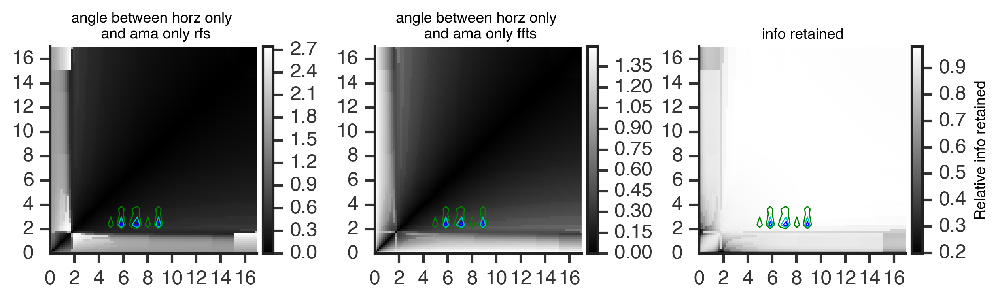

In [270]:
starting_width_idx = 0
fig = plt.gcf()
fig.set_size_inches((10,2.25))

ax = plt.subplot(131)
im = plt.imshow(angles_rf[starting_width_idx:, starting_width_idx:], origin='bottom left',
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('angle between horz only \n and ama only rfs', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax1)


ax = plt.subplot(132)
im = plt.imshow(angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])


# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax2)

ax = plt.subplot(133)
im = plt.imshow(info_difference[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
plt.title('info retained', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
divider = make_axes_locatable(ax)
cax3 = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax3)
cbar.ax.set_ylabel('Relative info retained', fontsize=9)

Map angles_fft to white above the diagonal

In [271]:
half_angles_fft = np.copy(angles_fft)
for i in range(angles_fft.shape[0]):
    for j in range(i+1, angles_fft.shape[1]):
        half_angles_fft[i,j] = 1

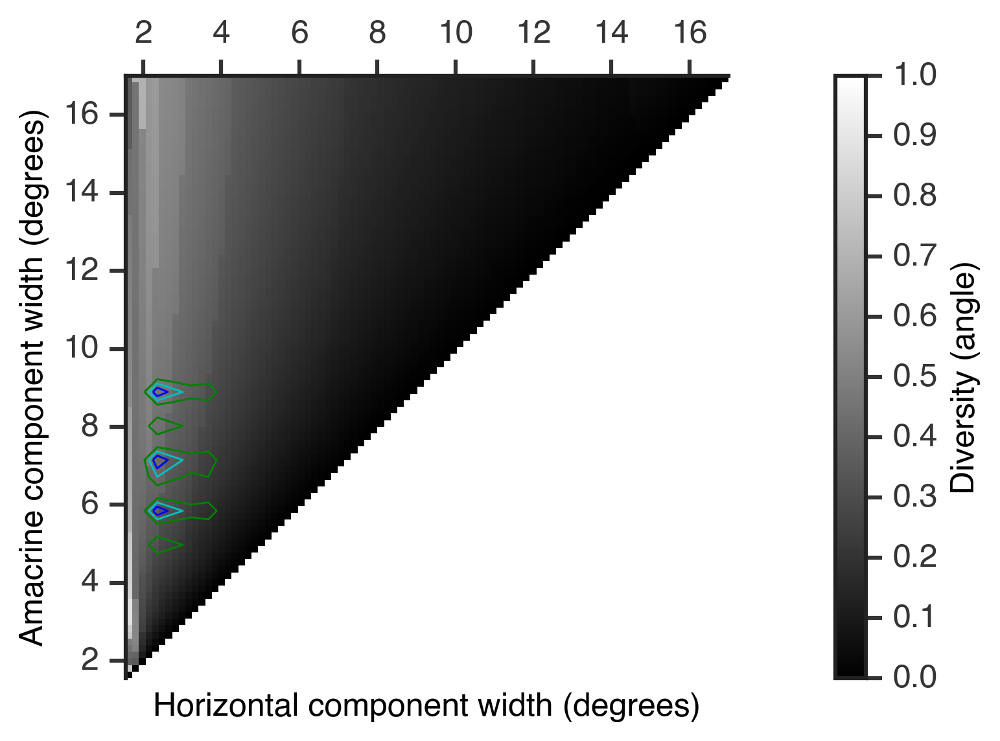

In [272]:
starting_width_idx = 9
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(Y, X, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('top')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (angle)', fontsize=12)

plt.savefig('12-2 upper triangle of diversity.pdf')

In [273]:
half_angles_fft = np.copy(angles_fft)
for i in range(angles_fft.shape[0]):
    for j in range(i+1, angles_fft.shape[1]):
        half_angles_fft[j,i] = 1

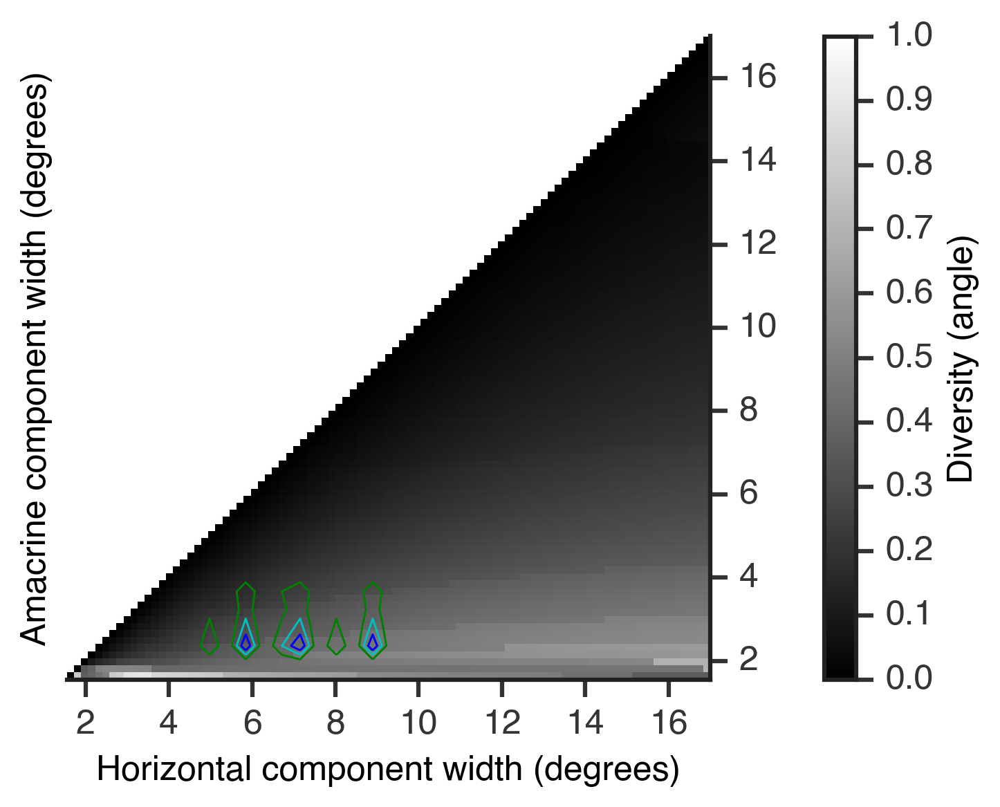

In [274]:
starting_width_idx = 9
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=0.7, alpha=1, colors=contour_colors)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (angle)', fontsize=12)

plt.savefig('12-2 lower triangle of diversity.pdf')

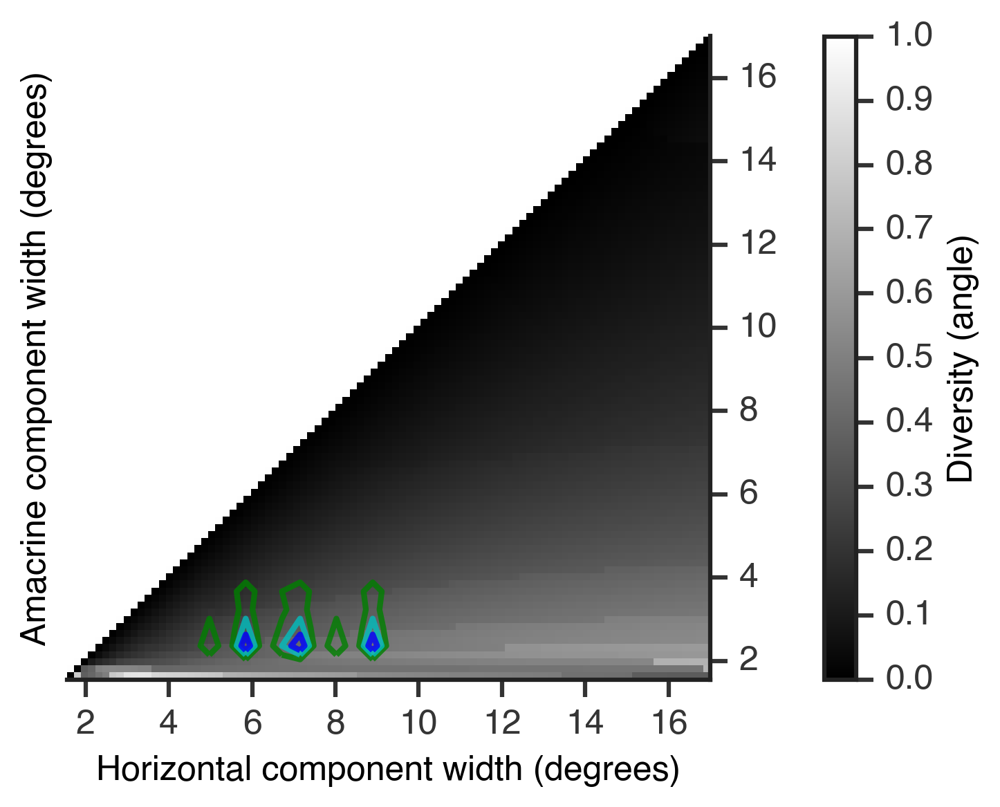

In [275]:
starting_width_idx = 9
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (angle)', fontsize=12)

# plt.savefig('12-2 lower triangle of diversity thicker contours with coarse-grained widths.pdf')
# plt.savefig('12-2 lower triangle of diversity thicker contours with coarse-grained widths.png')
plt.savefig('12-2 lower triangle of diversity thicker contours.pdf')
plt.savefig('12-2 lower triangle of diversity thicker contours.png')

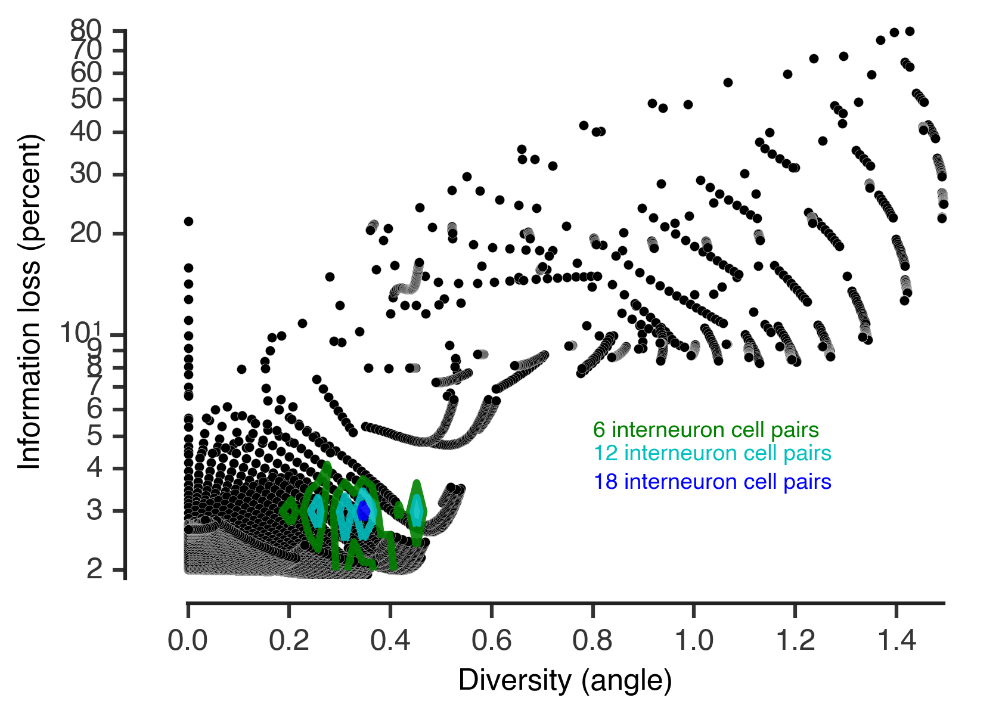

In [276]:
eps = 10e-10
plt.scatter(angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = np.linspace(0, 1.4, 80)
info_bins = np.linspace(1.5, 80, 80)
count_2d, angles_edges, info_edges = np.histogram2d(angles_fft_data,
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])

contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
contour_counts = CS.levels
for i,c in enumerate(contour_counts):
    plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('12-2 information loss vs diversity with data contour.pdf')

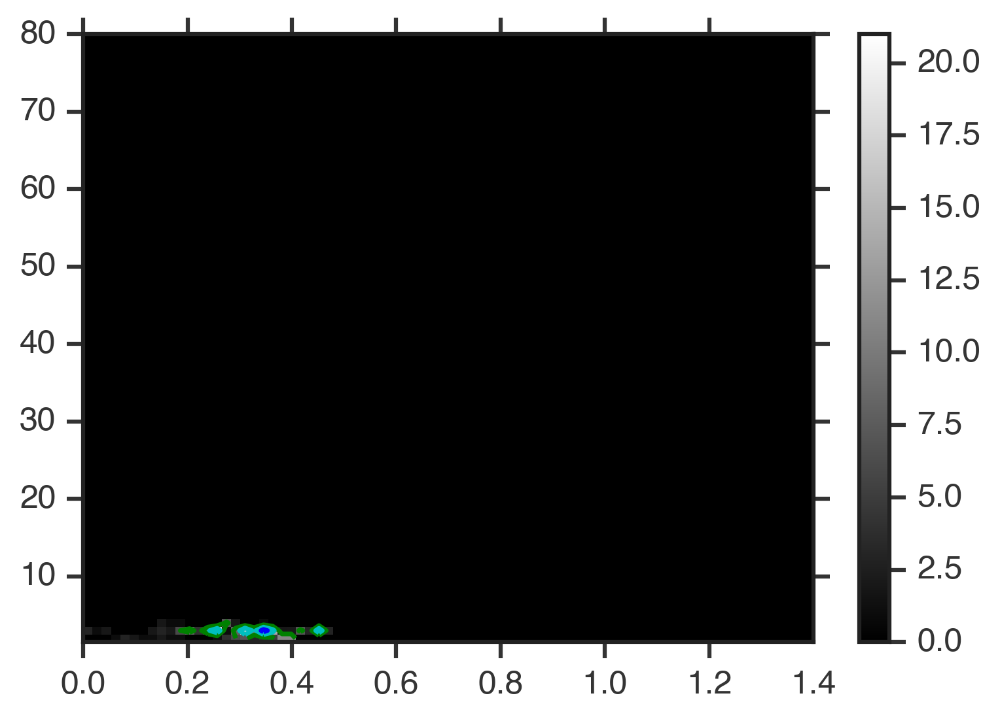

In [277]:
plt.imshow(count_2d.T, origin='bottom left', extent=[angles_edges[0], angles_edges[-1],
                                                   info_edges[0], info_edges[-1]], aspect='auto')
plt.colorbar()
# plt.scatter(angles_fft_data, 100*(1 - np.array(info_difference_data)) + eps, color='g', edgecolor='w', linewidth=0.1, 
#             s=15, alpha=0.1)
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, count_2d.T, 3, linewidths=1.7, alpha=1, colors=contour_colors)

### Get examples of diversity

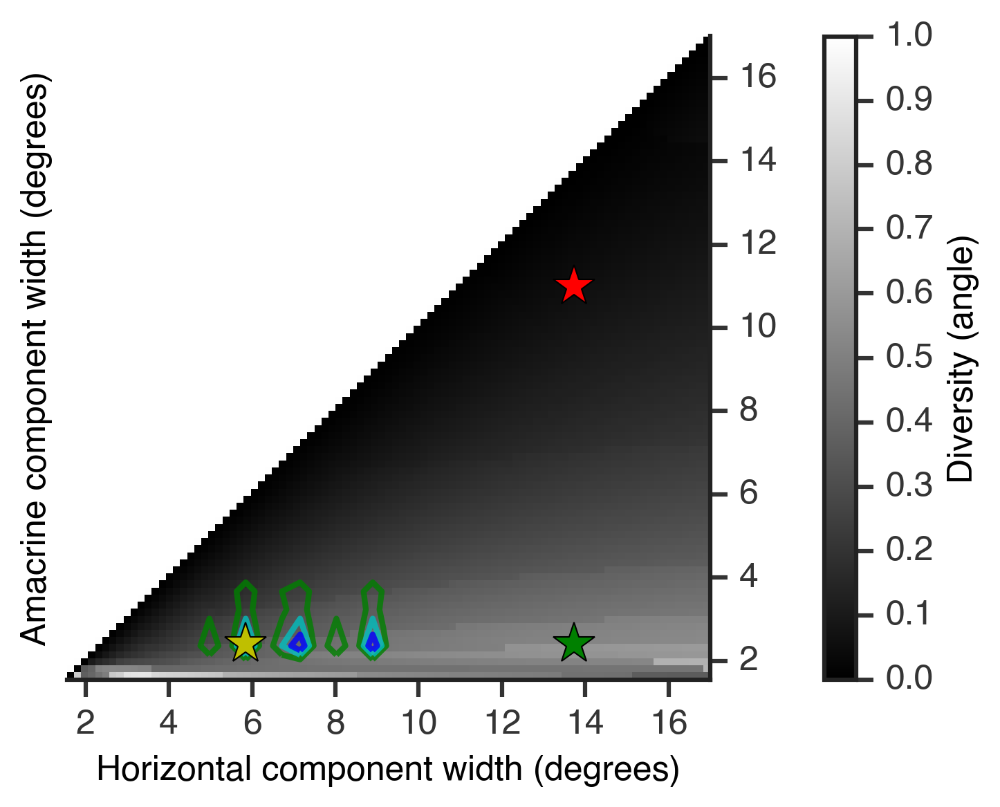

In [278]:
example_indices = [[34, 14], 
                   [80, 14], 
                   [80, 64]]

starting_width_idx = 9
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

colors = ['y', 'g', 'r']
for exi,ex in enumerate(example_indices):
    plt.plot(widths[ex[0]], widths[ex[1]], colors[exi], marker='*', alpha=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (angle)', fontsize=12)

In [290]:
np.max(np.tril(half_angles_fft[starting_width_idx:, starting_width_idx:], k=-1))

1.0

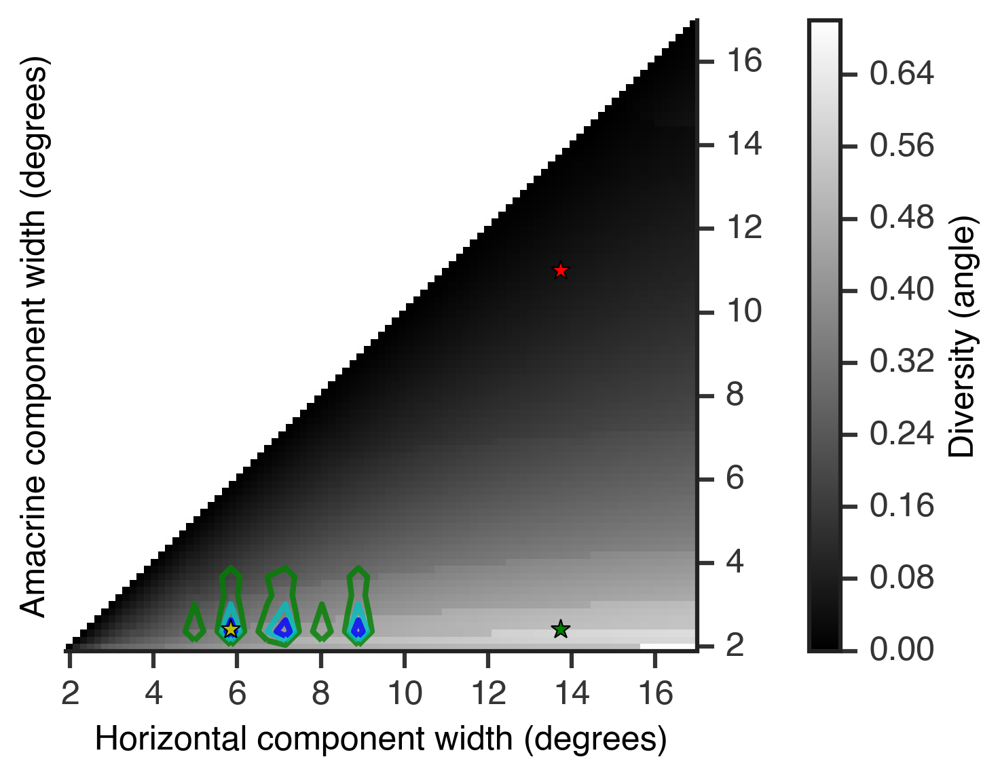

In [295]:
example_indices = [[34, 14], 
                   [80, 14], 
                   [80, 64]]

starting_width_idx = 11
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]],
               clim=[0, np.max(np.tril(half_angles_fft[starting_width_idx:, starting_width_idx:].T, k=-1))])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

colors = ['y', 'g', 'r']
for exi,ex in enumerate(example_indices):
    plt.plot(widths[ex[0]], widths[ex[1]], colors[exi], marker='*', markersize=7, alpha=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (angle)', fontsize=12)
plt.savefig('12-2 lower triangle of diversity thicker contours with examples.pdf')
plt.savefig('12-2 lower triangle of diversity thicker contours with examples.png', transparent=True)

In [299]:
from scipy.signal import convolve2d

In [388]:
samples = np.random.multivariate_normal([0,0], np.eye(2), (1000000))
gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-7,7,20), normed=True) 
smoothed_interneuron_pairs = convolve2d(interneuron_pairs, gauss_2d**2, mode='same')

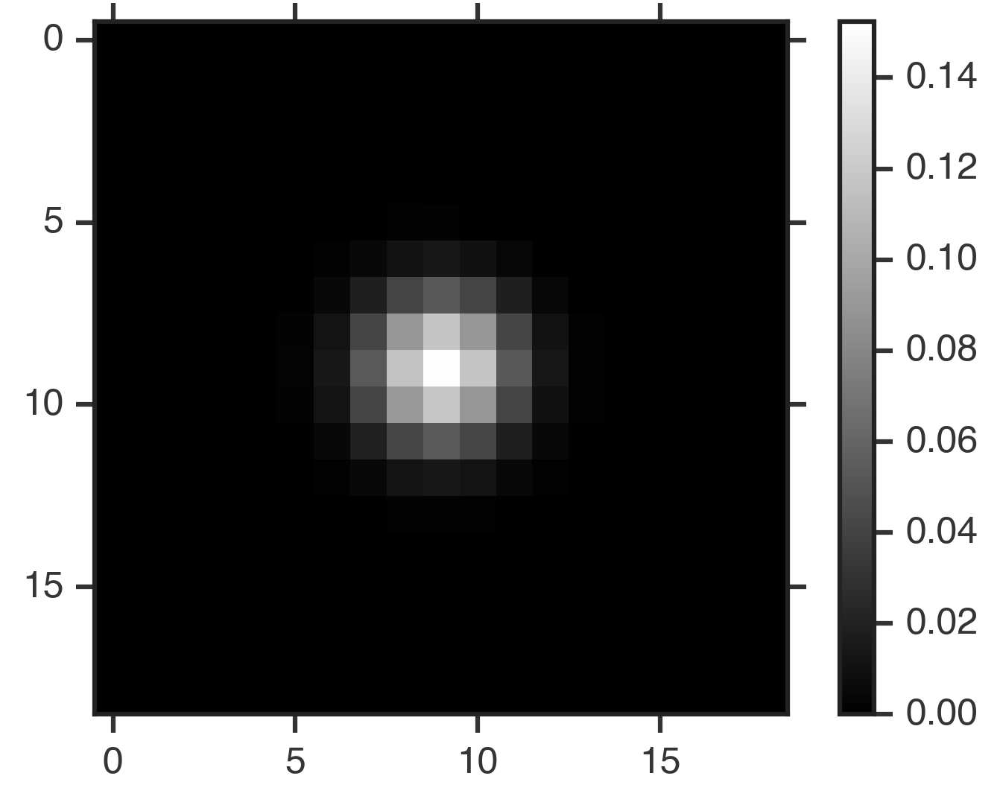

In [389]:
plt.imshow(gauss_2d)
plt.colorbar()

(1.726161616161616, 17.0)

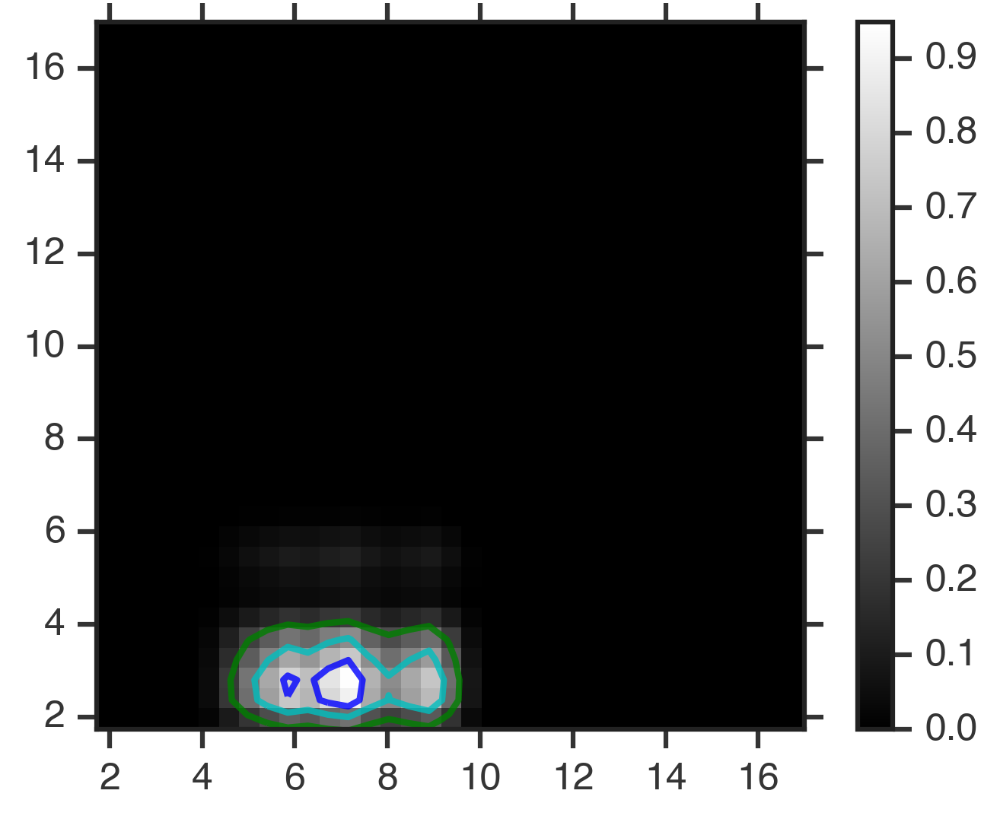

In [397]:
plt.imshow(smoothed_interneuron_pairs.T, origin='bottom left', 
                extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.colorbar()
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])

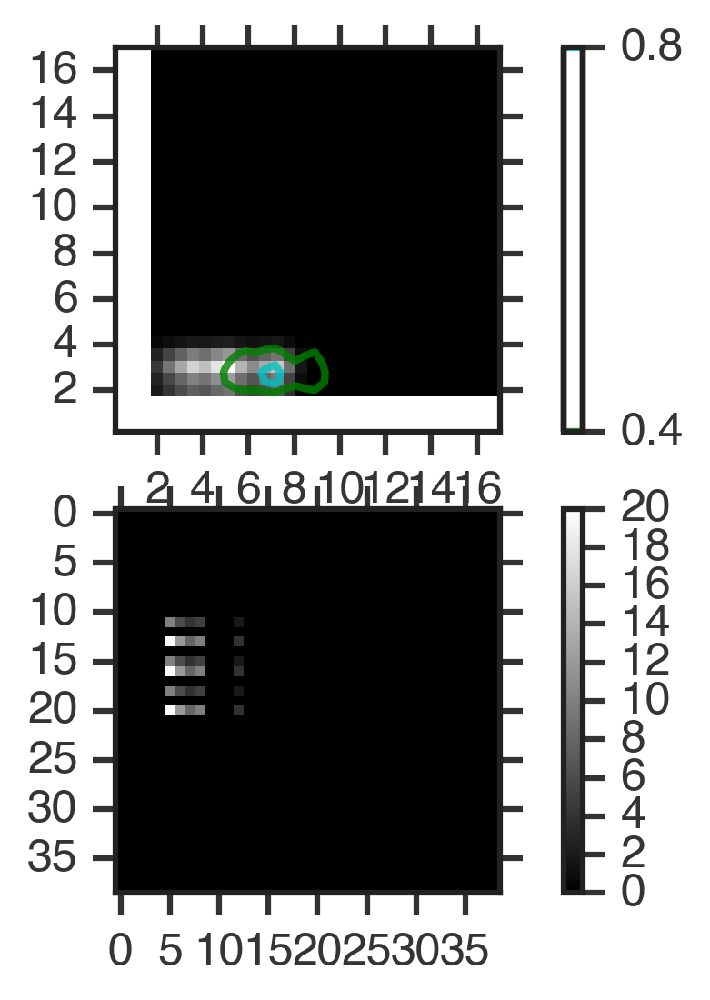

In [390]:
plt.subplot(211)
plt.imshow(smoothed_interneuron_pairs.T[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]])
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 2, linewidths=2, alpha=0.8, colors=contour_colors)
plt.colorbar()
plt.subplot(212)
plt.imshow(interneuron_pairs)
plt.colorbar()

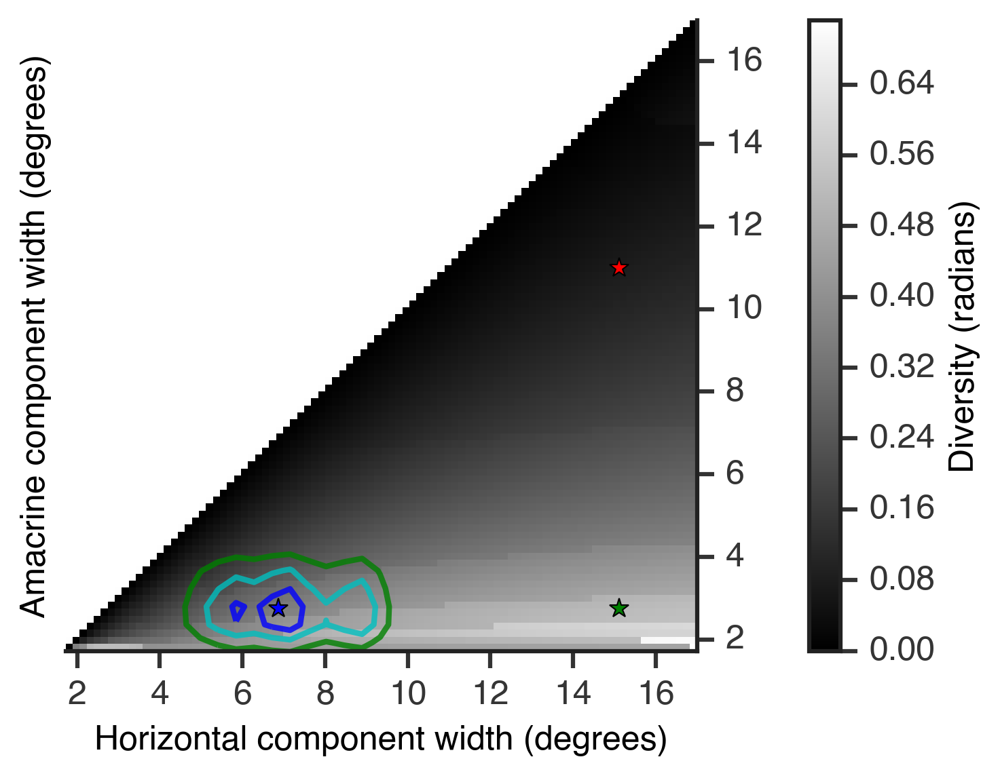

In [492]:
example_indices = [[40, 16], 
                   [88, 16], 
                   [88, 64]]

starting_width_idx = 10
ax = plt.gca()
im = plt.imshow(half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]],
               clim=[0, np.max(np.tril(half_angles_fft[starting_width_idx:, starting_width_idx:].T, k=-1))])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

colors = ['b', 'g', 'r']
for exi,ex in enumerate(example_indices):
    plt.plot(widths[ex[0]], widths[ex[1]], colors[exi], marker='*', markersize=7, alpha=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (radians)', fontsize=12)
plt.savefig('12-2 lower triangle of diversity smoothed contours with examples.pdf')
plt.savefig('12-2 lower triangle of diversity smoothed contours with examples.png', transparent=True)

In [561]:
radians_to_deg = 360/(2*np.pi)

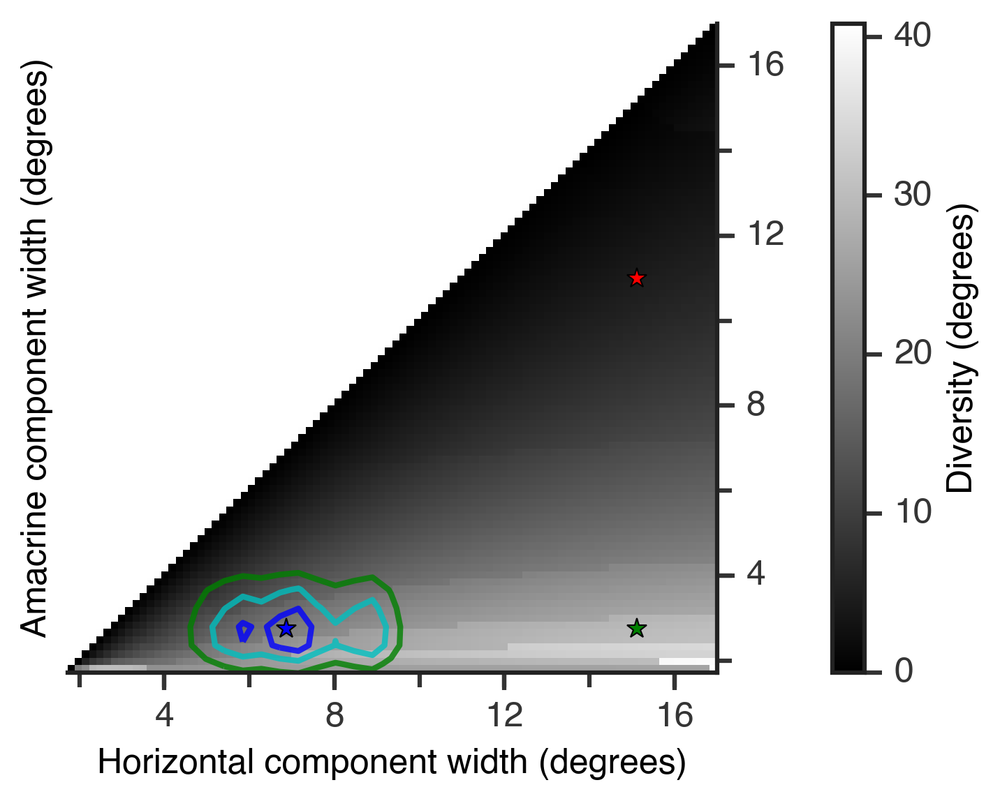

In [635]:
example_indices = [[40, 16], 
                   [88, 16], 
                   [88, 64]]

starting_width_idx = 10
ax = plt.gca()
im = plt.imshow(radians_to_deg*half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]],
               clim=[0, np.max(np.tril(radians_to_deg*half_angles_fft[starting_width_idx:, starting_width_idx:].T, k=-1))])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

colors = ['b', 'g', 'r']
for exi,ex in enumerate(example_indices):
    plt.plot(widths[ex[0]], widths[ex[1]], colors[exi], marker='*', markersize=7, alpha=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)


majorLocator = MultipleLocator(4)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(2)

ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (degrees)', fontsize=12)
cbar.set_ticks([0, 10, 20, 30, 40])

plt.savefig('lower triangle of diversity smoothed contours with examples degrees 1-23.png', transparent=True)

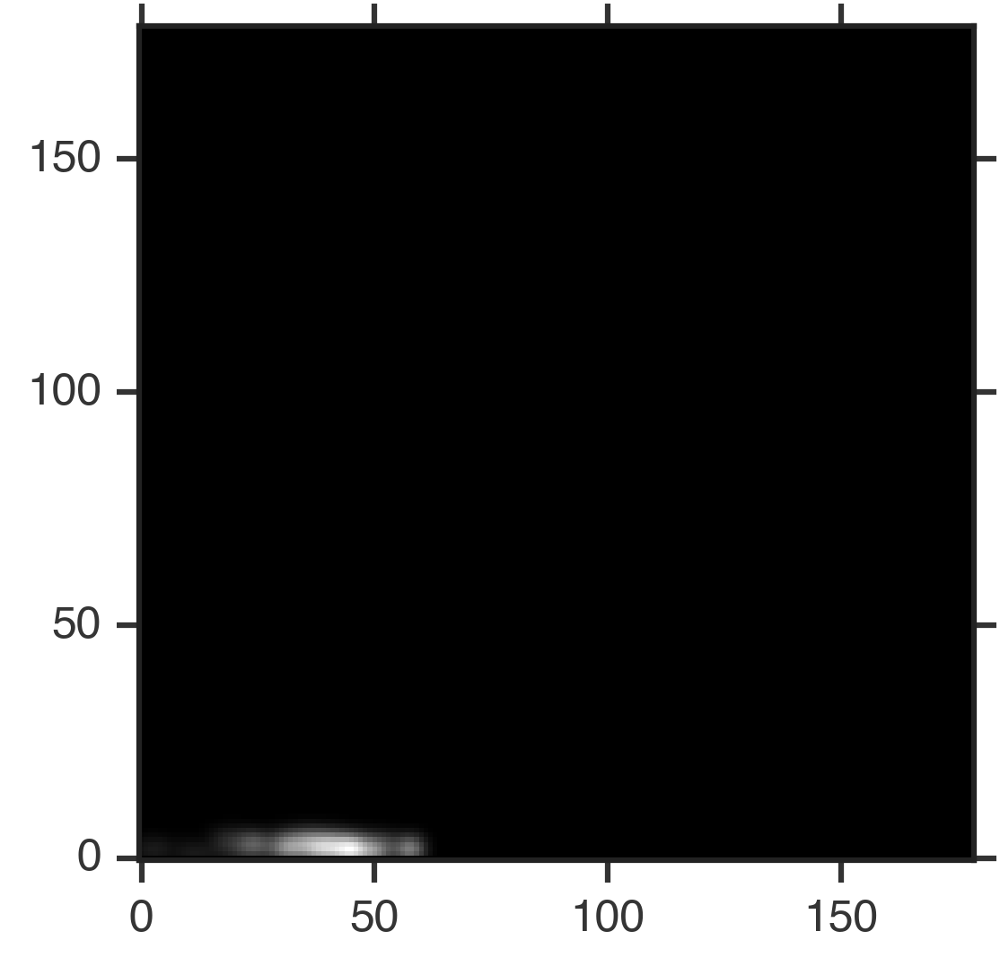

In [494]:
plt.imshow(smoothed_count_2d.T, origin='bottom left')

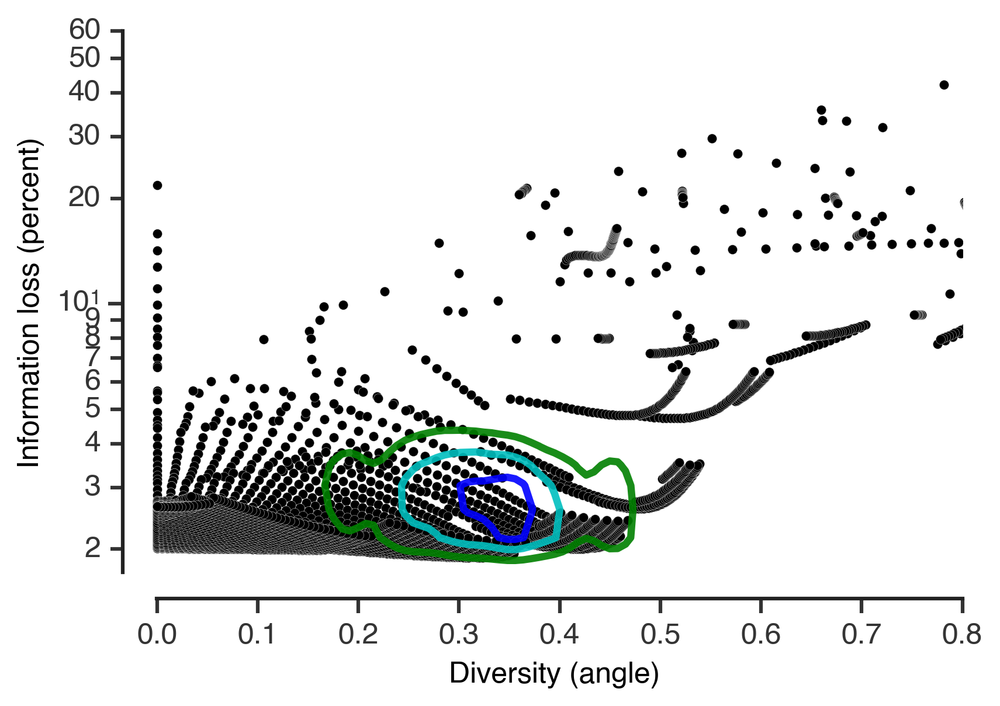

In [495]:
eps = 10e-10
plt.scatter(angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(angles_fft_data,
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])
gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
smoothed_count_2d[:,0] = 0

contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))


plt.xlim(-.01, 0.8)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('12-2 information loss vs diversity with smooth contour.pdf')

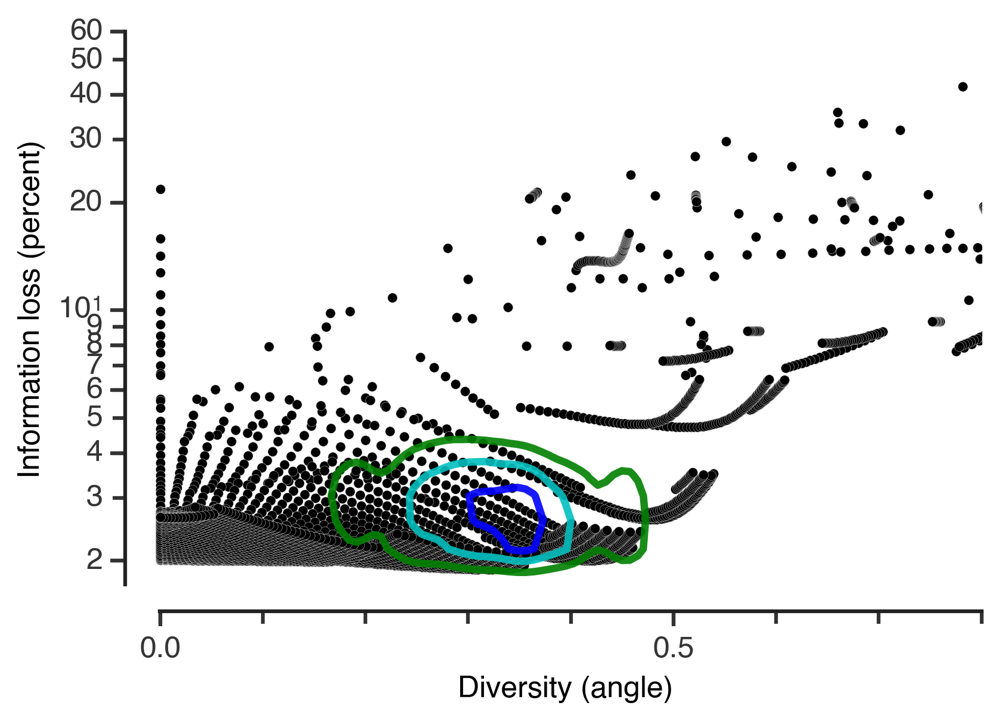

In [620]:
eps = 10e-10
plt.scatter(angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(angles_fft_data,
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])
gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
smoothed_count_2d[:,0] = 0

contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
plt.yticks([2, 4, 6, 8, 10, 20, 40, 60])

majorLocator = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator = MultipleLocator(0.1)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)




plt.xlim(-.01, 0.8)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('information loss vs diversity with smooth contour 1-23.pdf')

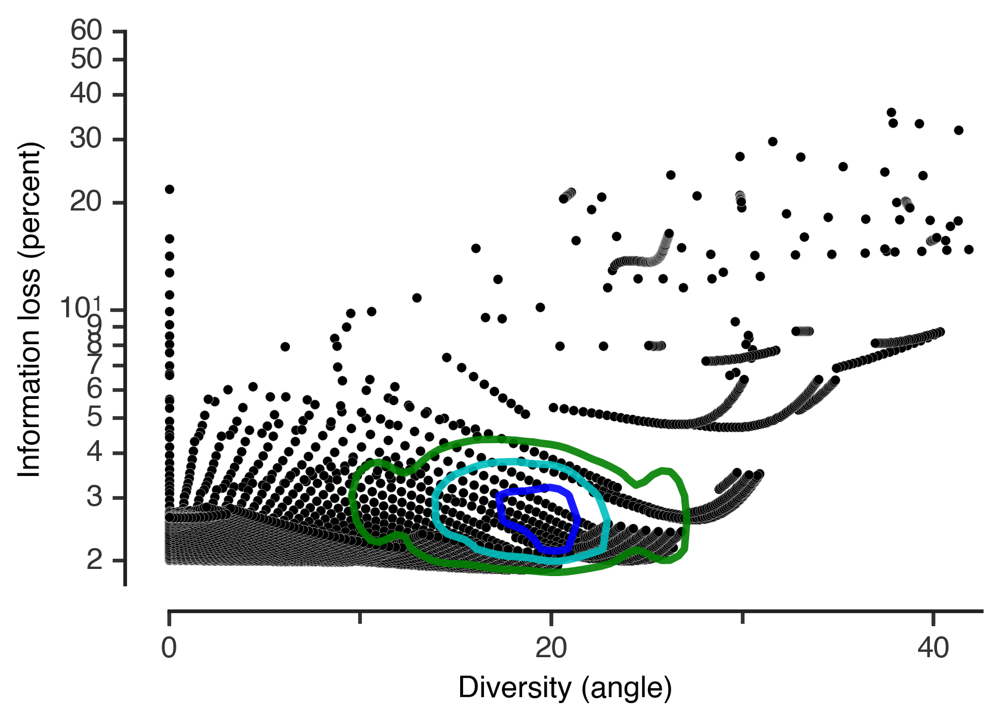

In [636]:
eps = 10e-10
plt.scatter(radians_to_deg*angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = radians_to_deg * np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(radians_to_deg * np.array(angles_fft_data),
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])
gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
smoothed_count_2d[:,0] = 0

contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])

majorLocator = MultipleLocator(20)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(10)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
plt.xlim(-1, 42.5)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('information loss vs diversity with smooth contour degrees 1-23.pdf')

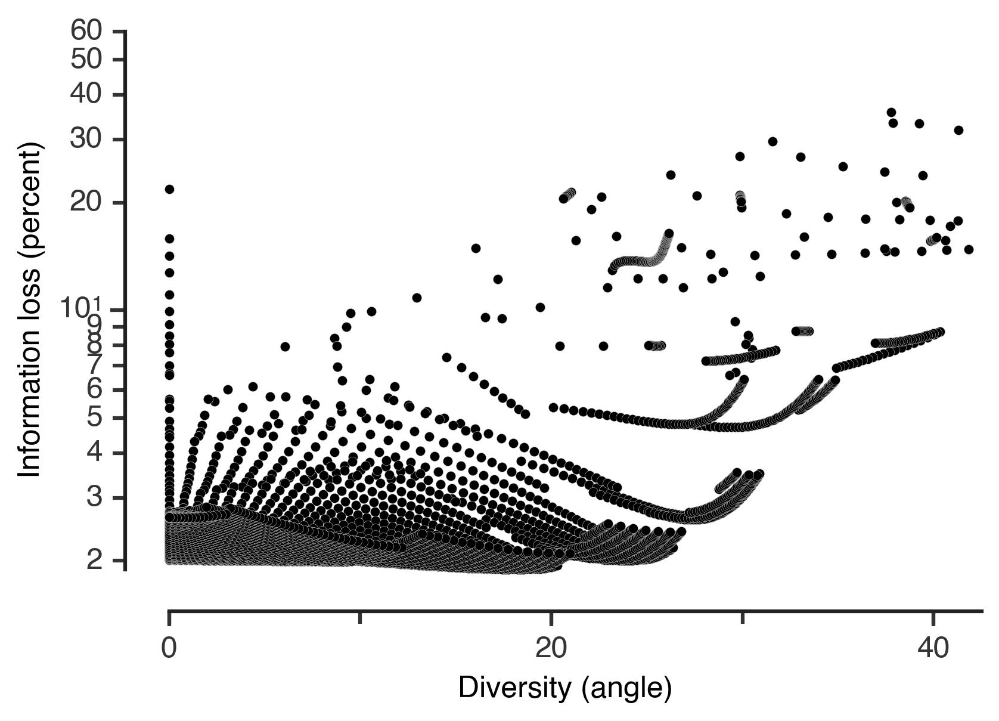

In [686]:
eps = 10e-10
plt.scatter(radians_to_deg*angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = radians_to_deg * np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(radians_to_deg * np.array(angles_fft_data),
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])
# gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
# smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
# smoothed_count_2d[:,0] = 0

# contour_colors = ['g', 'c', 'b']
# X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
#                    info_edges[:-1] + np.mean(np.diff(info_edges))/2)
# CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
# contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])

majorLocator = MultipleLocator(20)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(10)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
plt.xlim(-1, 42.5)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('2-21 information loss vs diversity without contours.pdf')

In [691]:
np.min(info_difference)

0.19772866316374696

In [687]:
angles_fft.shape

(100, 100)

In [737]:
example_ids = []
example_angles = []
example_info_loss = []
flag = [0,0,0]
for i,(angle,info) in enumerate(zip(angles_fft.ravel(), info_difference.ravel())):
    angle_deg = radians_to_deg * angle
    info_loss = 100*(1. - info)
    if (angle_deg > 10) and (angle_deg < 20) and (info_loss > 12.) and (info_loss < 50.) and (flag[0] == 0):
        print((angle_deg, info_loss))
        example_ids.append(np.unravel_index(i, angles_fft.shape))
        example_angles.append(angle_deg)
        example_info_loss.append(info_loss)
        flag[0] = 1
        
    if (angle_deg > 40) and (angle_deg < 44) and (info_loss > 30.) and (flag[1] == 0):
        print((angle_deg, info_loss))
        example_ids.append(np.unravel_index(i, angles_fft.shape))
        example_angles.append(angle_deg)
        example_info_loss.append(info_loss)
        flag[1] = 1
        
    if (angle_deg > 26) and (angle_deg < 30) and (info_loss < 2.6) and (flag[2] == 0):
        print((angle_deg, info_loss))
        example_ids.append(np.unravel_index(i, angles_fft.shape))
        example_angles.append(angle_deg)
        example_info_loss.append(info_loss)
        flag[2] = 1

(17.180155030131072, 12.240050283229731)
(41.296894354326056, 31.843836499724819)
(26.031856042738713, 2.1201074476321913)


In [738]:
example_ids

[(2, 3), (5, 13), (17, 80)]

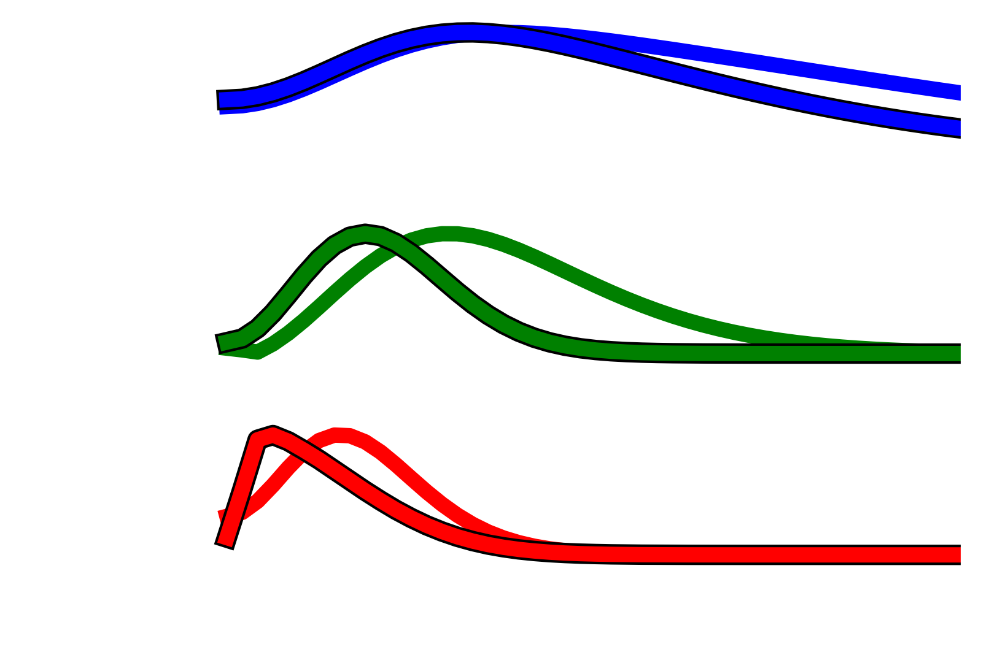

In [739]:
extreme_rfs = collections.defaultdict(list)
center = gaussian(x=space, sigma=median_center_widths[celltype], mu=0.)
center /= -np.sum(center)

for exi, (idw1, idw2) in enumerate(example_ids):
    w1 = widths[idw1]
    w2 = widths[idw2]
    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    # Plot the two RFs
    plt.subplot('31%d' %(exi+1))
    plt.plot(freqs, all_a_fft/np.max(abs(all_a_fft)), color=colors[exi], linewidth=6)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color='k', linewidth=8)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color=colors[exi], linewidth=6)
    plt.axis('off')
    plt.ylim(-.3, 1.1)
    plt.xlim(-.1, .6)
#     plt.title('Diversity %0.2f$^\circ$ -  Information loss %0.1f%%' %(this_angle_fft, 100*(1 - this_info)), 
#               fontsize=18)
#     adjust_spines(plt.gca())
plt.savefig('2-21 extreme RFs.png', transparent=True)

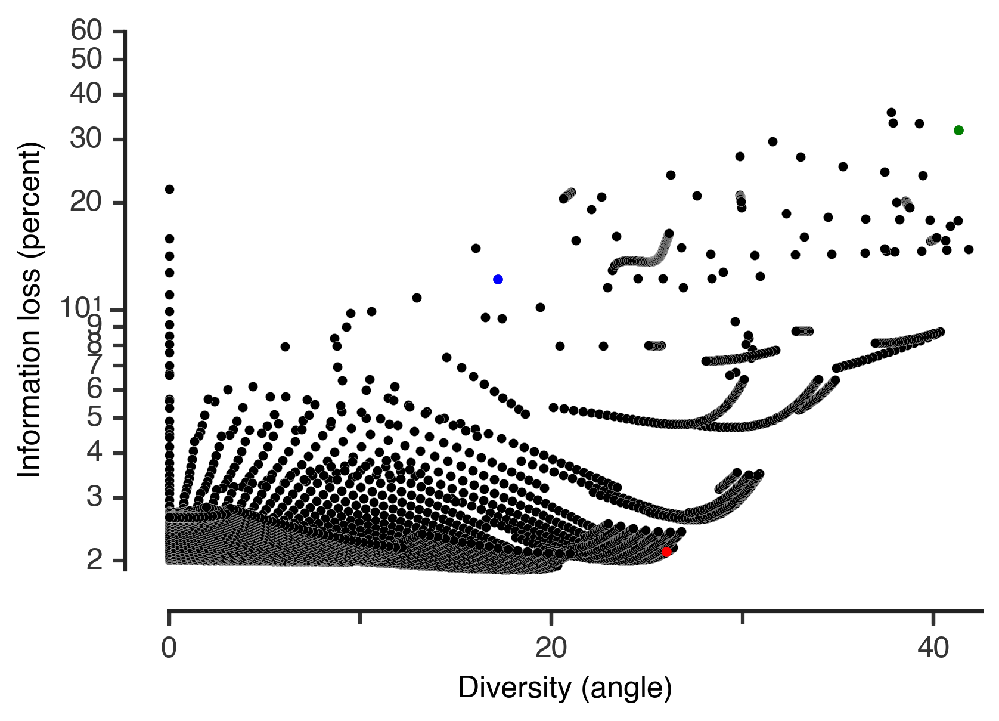

In [740]:
eps = 10e-10
plt.scatter(radians_to_deg*angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = radians_to_deg * np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(radians_to_deg * np.array(angles_fft_data),
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])

for exi, (idw1, idw2) in enumerate(example_ids):
    plt.scatter(example_angles[exi], example_info_loss[exi], color=colors[exi], linewidth=0.1, s=15)
# gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
# smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
# smoothed_count_2d[:,0] = 0

# contour_colors = ['g', 'c', 'b']
# X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
#                    info_edges[:-1] + np.mean(np.diff(info_edges))/2)
# CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
# contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])

majorLocator = MultipleLocator(20)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(10)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
plt.xlim(-1, 42.5)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('2-21 information loss vs diversity without contours with extreme rfs.pdf')

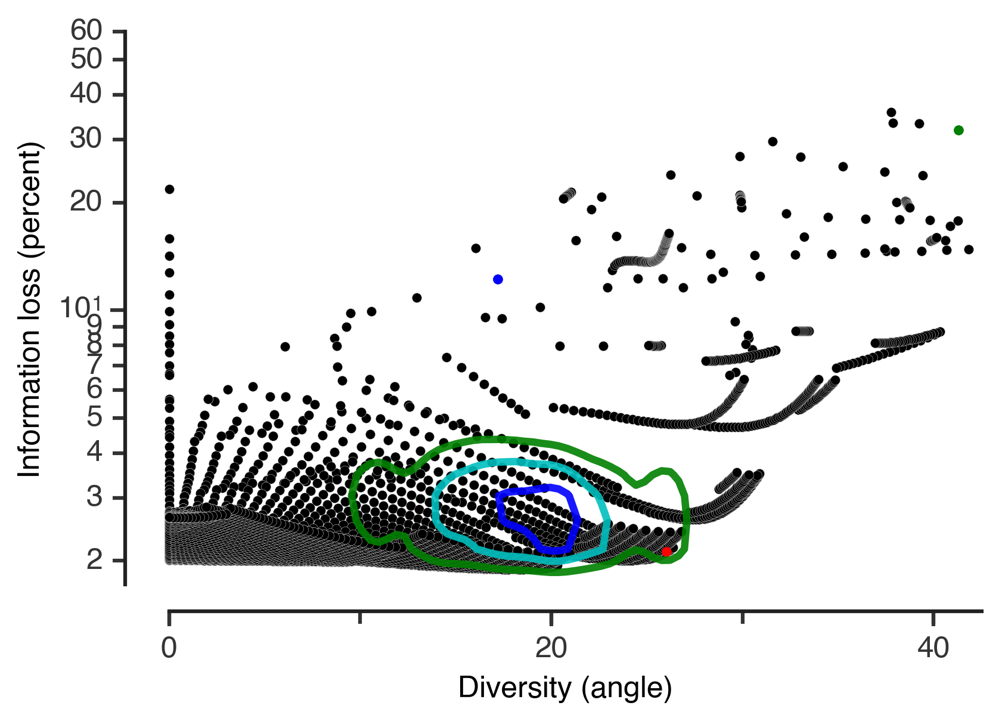

In [741]:
eps = 10e-10
plt.scatter(radians_to_deg*angles_fft, 100*(1 - info_difference.ravel()) + eps, color='k', edgecolor='w', linewidth=0.1, s=15)

# contour
angle_bins = radians_to_deg * np.linspace(0, 1.4, 180)
info_bins = np.linspace(1.5, 80, 180)
count_2d, angles_edges, info_edges = np.histogram2d(radians_to_deg * np.array(angles_fft_data),
                                                   100*(1 - np.array(info_difference_data)),
                                                   bins=[angle_bins, info_bins])

for exi, (idw1, idw2) in enumerate(example_ids):
    plt.scatter(example_angles[exi], example_info_loss[exi], color=colors[exi], linewidth=0.1, s=15)
# gauss_2d, bins_x, bins_y = np.histogram2d(samples[:,0], samples[:,1], np.linspace(-5,5,30), normed=True)
# smoothed_count_2d = convolve2d(count_2d, gauss_2d**2, mode='same')
# smoothed_count_2d[:,0] = 0

contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(angles_edges[:-1] + np.mean(np.diff(angles_edges))/2, 
                   info_edges[:-1] + np.mean(np.diff(info_edges))/2)
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
# contour_counts = CS.levels
# for i,c in enumerate(contour_counts):
#     plt.text(0.8, 5-1.5*i/2, '%d interneuron cell pairs' %c, fontsize=9, color=contour_colors[i])

majorLocator = MultipleLocator(20)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(10)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)


plt.xlabel('Diversity (angle)')
plt.ylabel('Information loss (percent)')
adjust_spines(plt.gca())
plt.yscale('log')
# plt.ylim(10e-3,80)
ax = plt.gca()
# ax.get_yaxis().get_major_formatter().labelOnlyBase = False
plt.tick_params(axis='y', which='minor')
ax.yaxis.set_minor_formatter(FormatStrFormatter("%.f"))
plt.xlim(-1, 42.5)
plt.ylim(1.7, 60)
# plt.savefig('12-2 information loss vs diversity with data contour with coarse-grained widths.pdf')
plt.savefig('2-21 information loss vs diversity with contours with extreme rfs.pdf')

(0, 10)

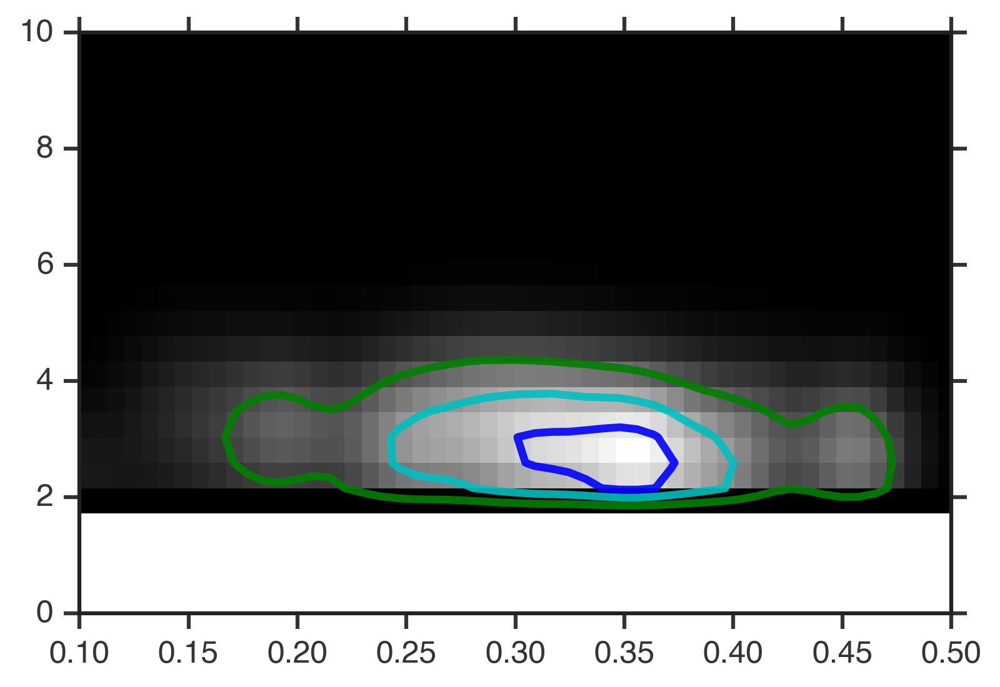

In [496]:
smoothed_count_2d[:,0] = 0
plt.imshow(smoothed_count_2d.T, extent=[X[0][0], X[0][-1], Y[0][0], Y[-1][0]], aspect='auto', origin='bottom left')
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
plt.xlim(0.1, 0.5)
plt.ylim(0,10)

(0, 10)

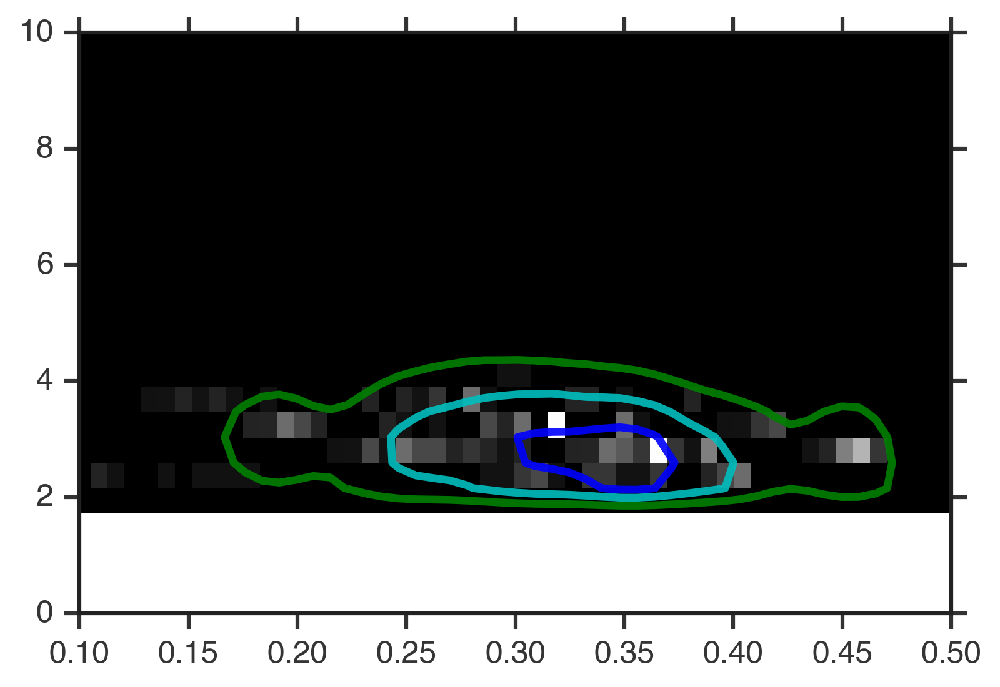

In [497]:
plt.imshow(count_2d.T, extent=[X[0][0], X[0][-1], Y[0][0], Y[-1][0]], aspect='auto', origin='bottom left')
CS = plt.contour(X, Y, smoothed_count_2d.T, 3, linewidths=3, alpha=0.9, colors=contour_colors)
plt.xlim(0.1, 0.5)
plt.ylim(0,10)

In [521]:
contour = CS.collections[0]
vs = contour.get_paths()[0].vertices

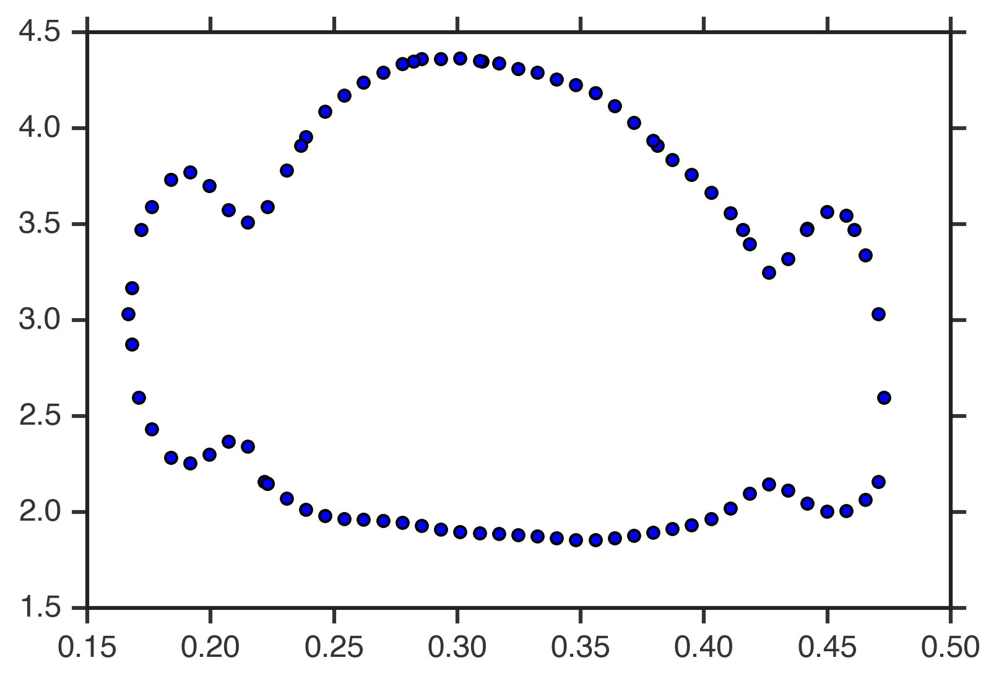

In [524]:
plt.scatter([x[0] for x in vs], [x[1] for x in vs])

# Compute contour areas

#### For figure 4F

In [548]:
contour_areas = []
for level in range(len(CS.levels)):
    contour = CS.collections[level]
    vs = contour.get_paths()[0].vertices

    contour_path = matplotlib.path.Path(vs)
    contour_area = 0
    
    for i in range(count_2d.shape[0]):
        for j in range(count_2d.shape[1]):
            if contour_path.contains_point((X[i,j], Y[i,j])):
                contour_area += count_2d[j,i]
    contour_areas.append(contour_area)

In [549]:
contour_areas

[217.0, 144.0, 70.0]

#### For lower triangle plot

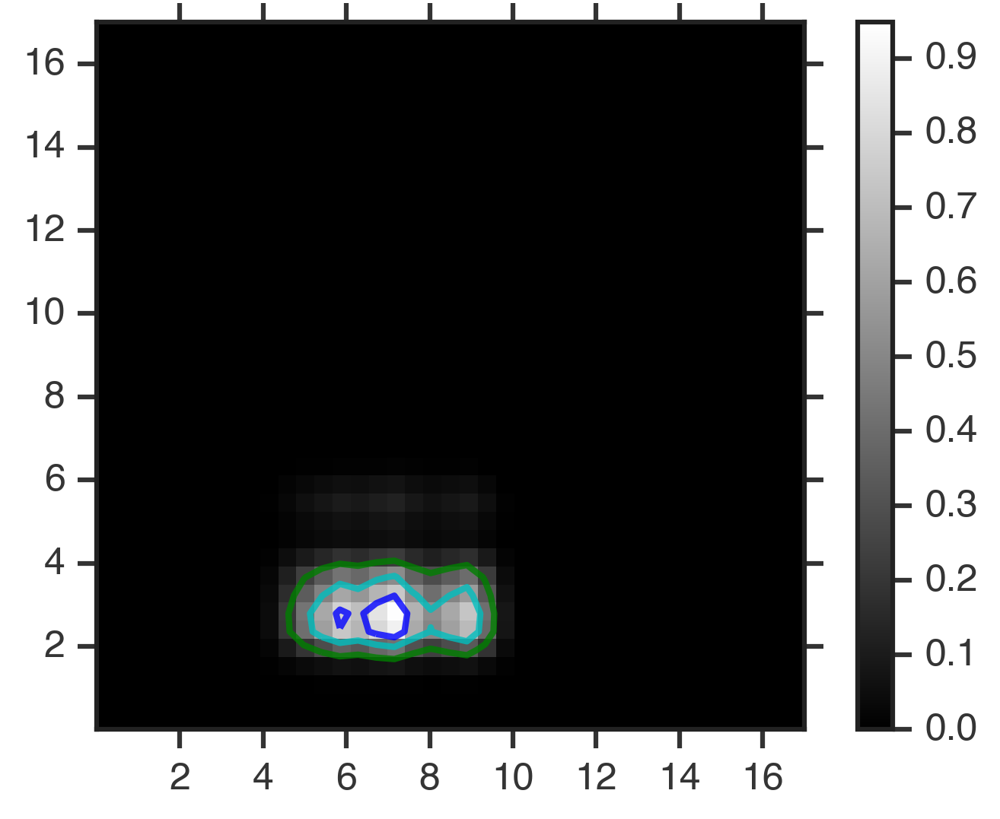

In [558]:
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
plt.imshow(smoothed_interneuron_pairs.T, origin='bottom left', 
                extent=[widths[0], widths[-1], widths[0], widths[-1]])
plt.colorbar()
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)
# plt.xlim(widths[starting_width_idx], widths[-1])
# plt.ylim(widths[starting_width_idx], widths[-1])
# CS = plt.contour(X, Y, interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)

contour_areas = []
for level in range(len(CS.levels)):
    contour = CS.collections[level]
    vs = contour.get_paths()[0].vertices

    contour_path = matplotlib.path.Path(vs)
    contour_area = 0
    
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            if contour_path.contains_point((X[i,j], Y[i,j])):
                contour_area += interneuron_pairs[j,i]
    contour_areas.append(contour_area)

In [559]:
contour_areas

[220, 156, 48]

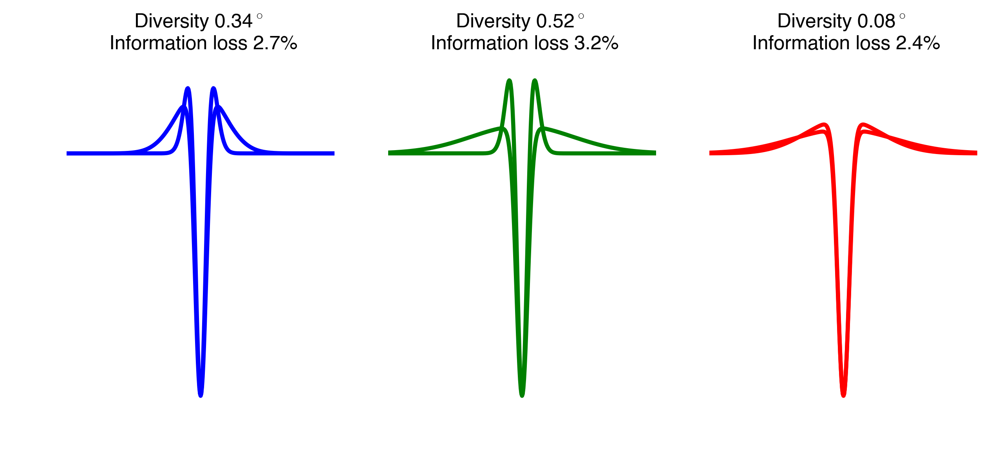

In [498]:
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi])
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi])
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
    

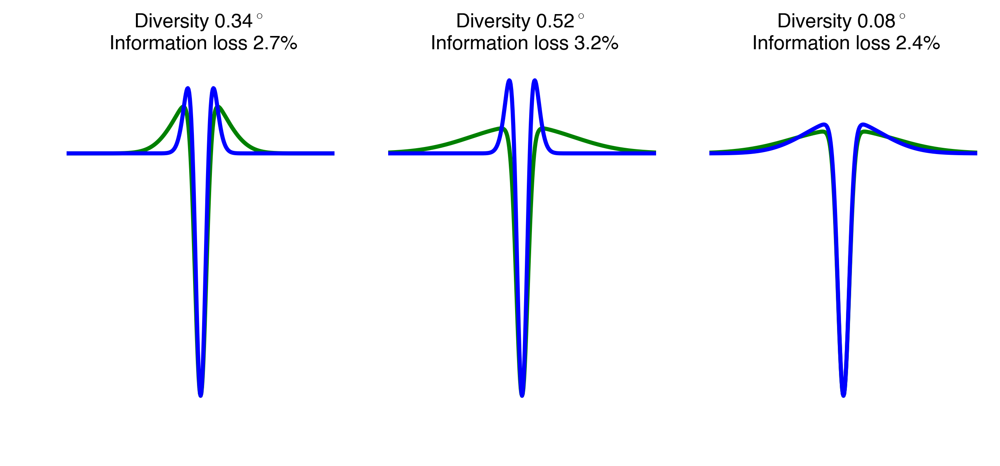

In [499]:
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='g')
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color='b')
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
    

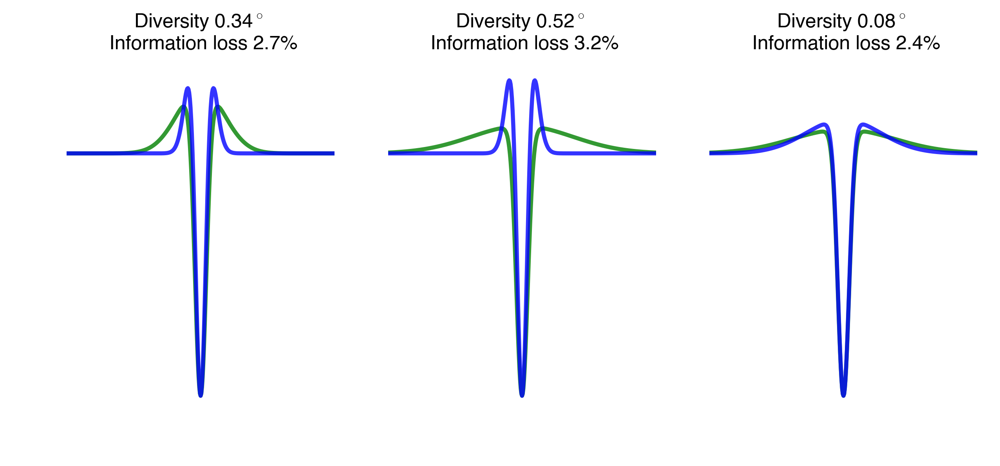

In [500]:
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='g', alpha=0.8)
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color='b', alpha=0.8)
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
    

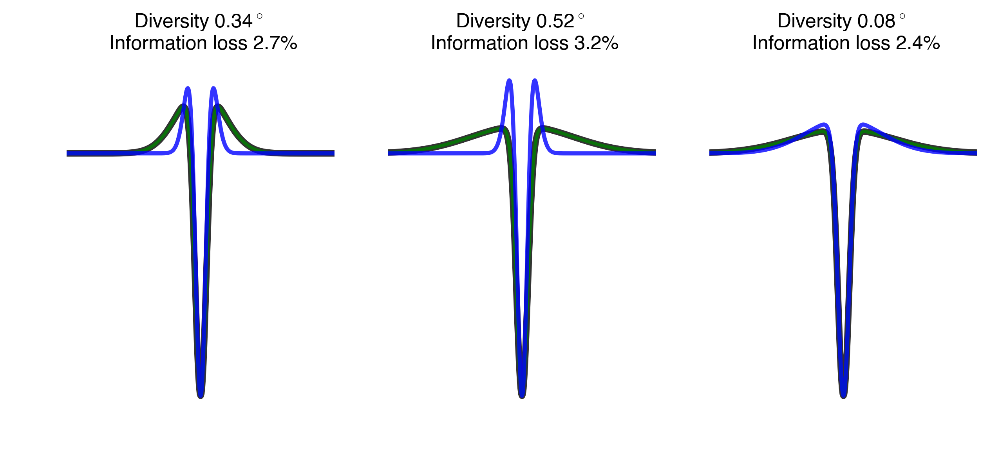

In [501]:
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='k', alpha=0.8, linewidth=4)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='g', alpha=0.8, linewidth=2)
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color='b', alpha=0.8)
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
    

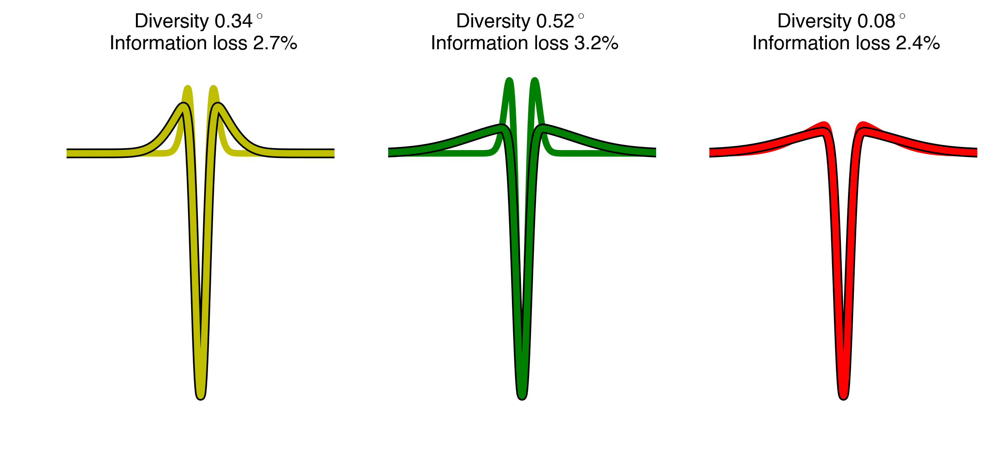

In [502]:
colors = ['y', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
#     plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi], linewidth=4)
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi], linewidth=4)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='k', linewidth=6)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi], linewidth=4)
#     plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi], linewidth=4, alpha=0.7)
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples yellow green red.pdf')
plt.savefig('12-2 examples yellow green red.png', transparent=True)

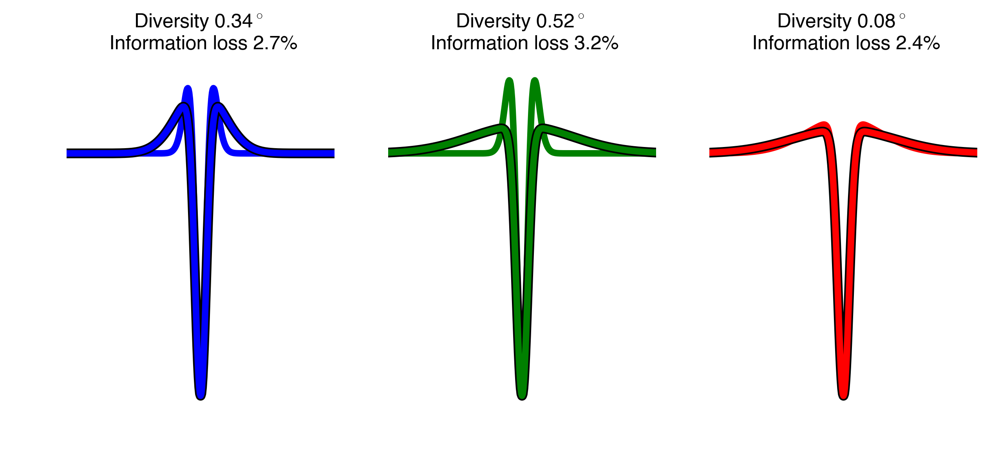

In [503]:
colors = ['b', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
#     plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi], linewidth=4)
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi], linewidth=4)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='k', linewidth=6)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi], linewidth=4)
#     plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi], linewidth=4, alpha=0.7)
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples blue green red.pdf')
plt.savefig('12-2 examples blue green red.png', transparent=True)

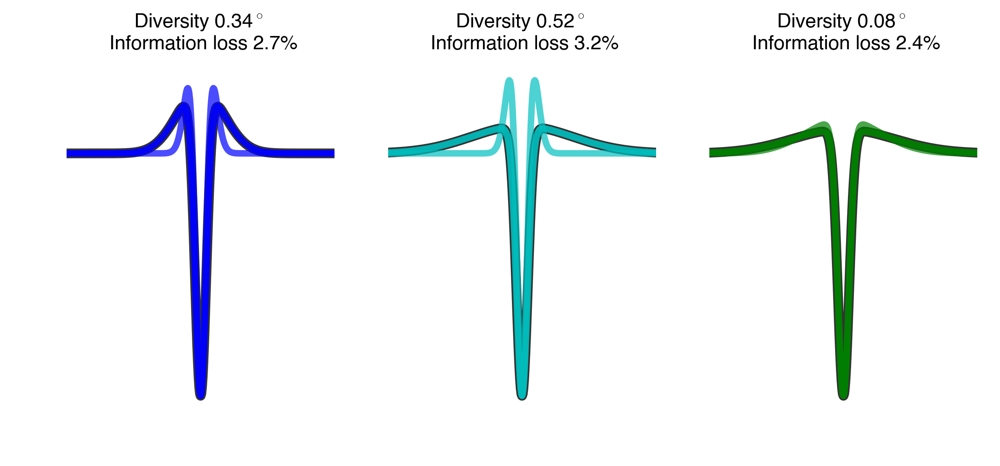

In [504]:
colors = ['b', 'c', 'g']
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color='k', alpha=0.8, linewidth=6)
    plt.plot(space, all_h_rf/np.max(abs(all_h_rf)), color=colors[exi], alpha=0.9, linewidth=4)
    plt.plot(space, all_a_rf/np.max(abs(all_a_rf)), color=colors[exi], alpha=0.7, linewidth=4)
    plt.axis('off')
    plt.ylim(-1.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_rf, 100*(1 - this_info)), fontsize=12)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples blue cyan green.pdf')
plt.savefig('12-2 examples blue cyan green.png', transparent=True)

# In frequency domain

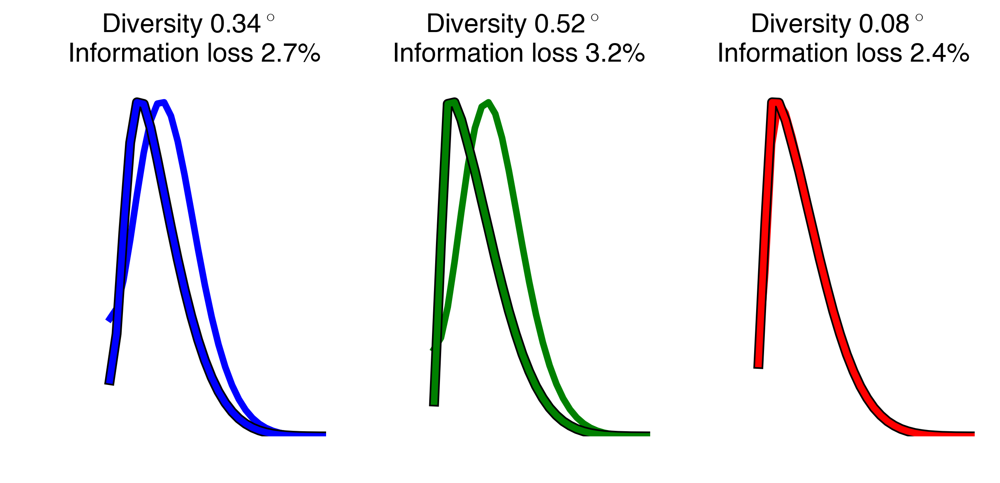

In [509]:
colors = ['b', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(freqs, all_a_fft/np.max(abs(all_a_fft)), color=colors[exi], linewidth=4)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color='k', linewidth=6)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color=colors[exi], linewidth=4)
    plt.axis('off')
    plt.ylim(0, 1.1)
    plt.xlim(-.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_fft, 100*(1 - this_info)), fontsize=16)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples blue green red fft.pdf')
plt.savefig('12-2 examples blue green red fft.png', transparent=True)

### Change aspect ratio

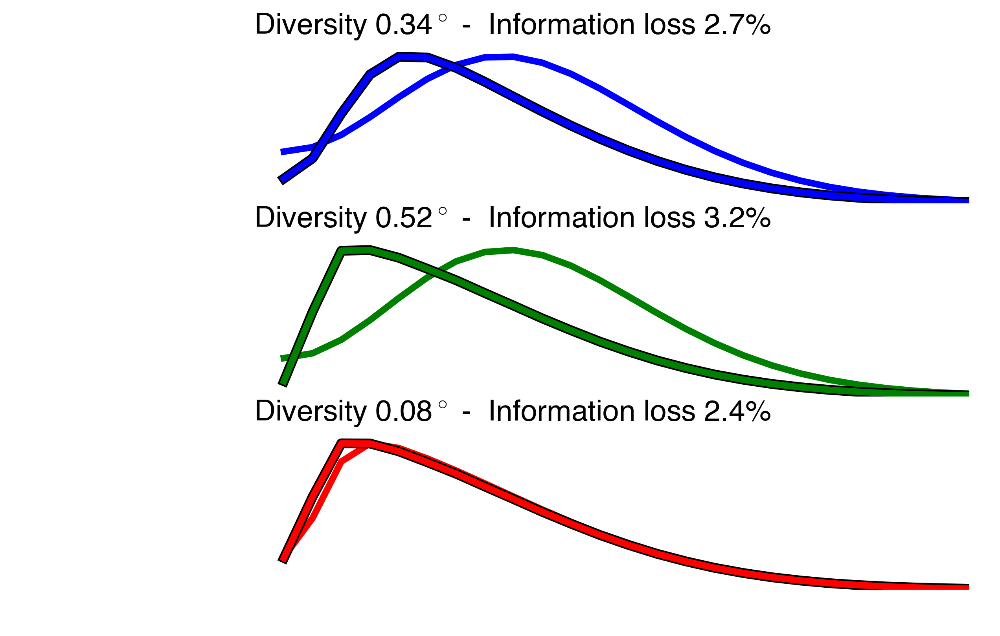

In [612]:
celltype = 'fast_off_adapting'
colors = ['b', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,6))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('31%d' %(exi+1))
    plt.plot(freqs, all_a_fft/np.max(abs(all_a_fft)), color=colors[exi], linewidth=4)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color='k', linewidth=6)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color=colors[exi], linewidth=4)
    plt.axis('off')
    plt.ylim(0, 1.1)
    plt.xlim(-.1, .3)
    plt.title('Diversity %0.2f$^\circ$ -  Information loss %0.1f%%' %(this_angle_fft, 100*(1 - this_info)), 
              fontsize=18)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples blue green red fft long.pdf')
plt.savefig('12-2 examples blue green red fft long.png', transparent=True)

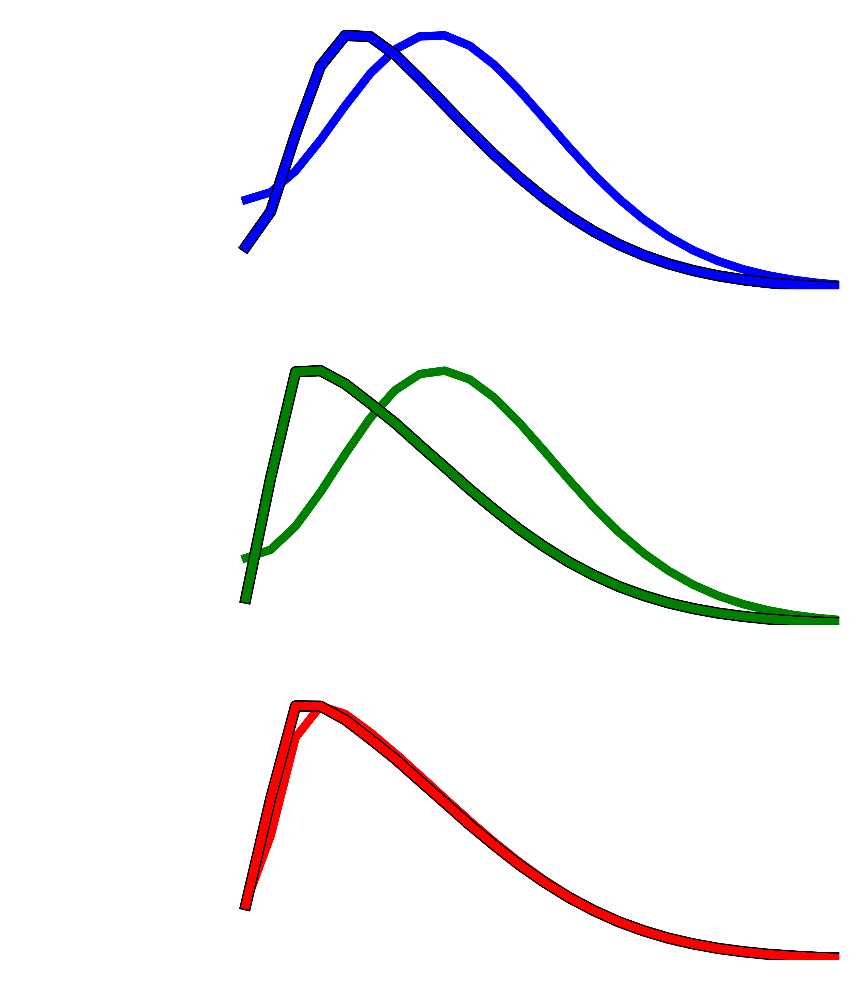

In [639]:
celltype = 'fast_off_adapting'
colors = ['b', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,12))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('31%d' %(exi+1))
    plt.plot(freqs, all_a_fft/np.max(abs(all_a_fft)), color=colors[exi], linewidth=6)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color='k', linewidth=8)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color=colors[exi], linewidth=6)
    plt.axis('off')
    plt.ylim(0, 1.1)
    plt.xlim(-.1, .3)
#     plt.title('Diversity %0.2f$^\circ$ -  Information loss %0.1f%%' %(this_angle_fft, 100*(1 - this_info)), 
#               fontsize=18)
#     adjust_spines(plt.gca())
plt.savefig('12-2 examples blue green red fft long wo titles.png', transparent=True)

In [506]:
example_indices

[[40, 16], [88, 16], [88, 64]]

In [507]:
this_angle_rf

0.077893390966316409

In [508]:
this_angle_fft

0.077786606686578039

In [563]:
pairwise_ganglion_diversity = []
for celltype in receptive_fields.keys():
    for rf in receptive_fields[celltype]:
        for celltype2 in receptive_fields.keys():
            for rf2 in receptive_fields[celltype]:
                pairwise_ganglion_diversity.append(angle(rf, rf2))

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in arccos
  from ipykernel import kernelapp as app


In [569]:
len(pairwise_ganglion_diversity)

7575363

In [570]:
np.min(pairwise_ganglion_diversity)

nan

In [571]:
pairwise_ganglion_diversity = [p for p in pairwise_ganglion_diversity if str(p) != 'nan']

In [572]:
len(pairwise_ganglion_diversity)

7560090

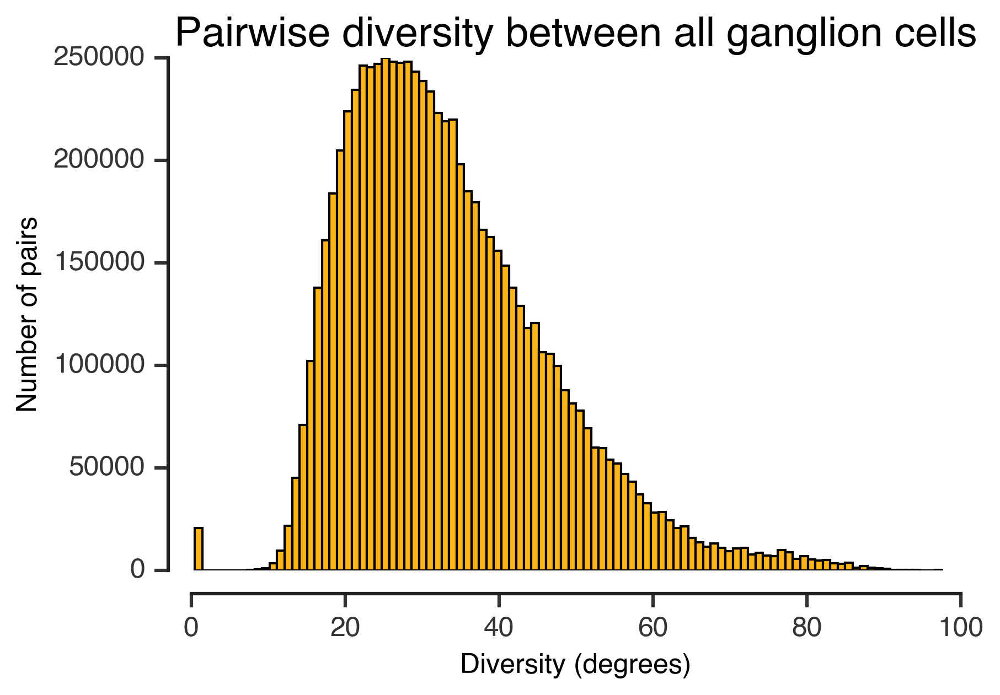

In [584]:
count, bins = np.histogram(radians_to_deg*np.array(pairwise_ganglion_diversity), bins=100)
bin_width = np.mean(np.diff(bins))
plt.bar(bins[:-1] + bin_width/2, count, width=bin_width, color=np.random.rand(3))
plt.xlabel('Diversity (degrees)')
plt.ylabel('Number of pairs')
plt.title('Pairwise diversity between all ganglion cells', fontsize=18)
adjust_spines(plt.gca())

In [581]:
radians_to_deg*np.max(pairwise_ganglion_diversity)

97.132983132058484

## Explore other parameters

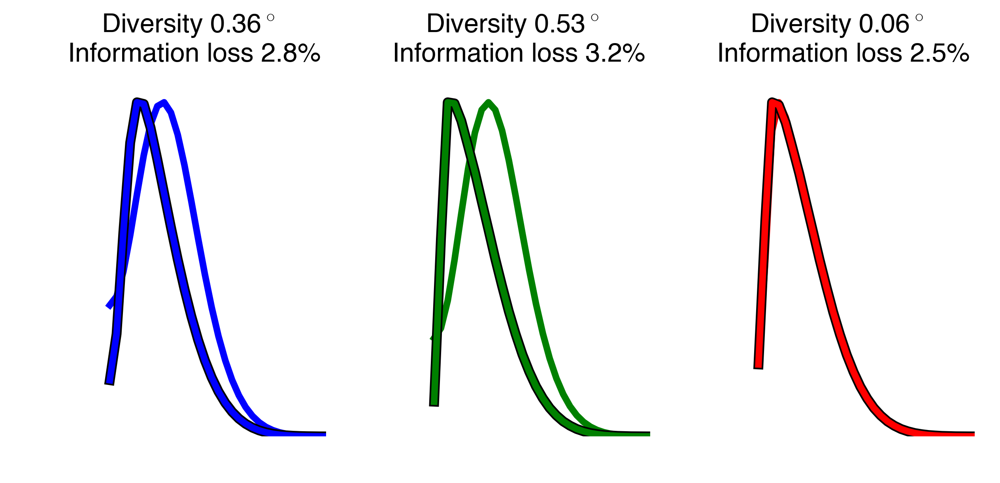

In [655]:
example_indices = [[40, 15], 
                   [90, 15], 
                   [90, 70]]

colors = ['b', 'g', 'r']
fig = plt.gcf()
fig.set_size_inches((10,4))

for exi,ex in enumerate(example_indices):
    w2 = widths[ex[0]]
    w1 = widths[ex[1]]
        
    surround2 = gaussian(x=space, sigma=w2, mu=0.)
    surround2 /= np.sum(surround2)

    surround1 = gaussian(x=space, sigma=w1, mu=0.)
    surround1 /= np.sum(surround1)

    def rf_model(horz_weight, center_weight):
        return center_weight*center + (1-center_weight)*(horz_weight*surround2 + (1-horz_weight)*surround1)

    this_map = infos_varying_width[celltype][(w1,w2)]
    which_fft = np.unravel_index(this_map.argmax(), this_map.shape)
    hw = horz_weights[which_fft[0]]
    cw = center_weights[which_fft[1]]

    mean_info = np.mean(infos_varying_width[celltype][(w1,w2)][:, which_fft[1]])

    all_h_rf = rf_model(horz_weights[-1], cw)
    all_a_rf = rf_model(horz_weights[0], cw)

    all_h_fft = abs(np.fft.rfft(all_h_rf))
    all_a_fft = abs(np.fft.rfft(all_a_rf))

    this_angle_rf = angle(all_h_rf, all_a_rf)
    this_angle_fft = angle(all_h_fft, all_a_fft)
    this_info = mean_info/max_info

    # Plot the two RFs
    plt.subplot('13%d' %(exi+1))
    plt.plot(freqs, all_a_fft/np.max(abs(all_a_fft)), color=colors[exi], linewidth=4)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color='k', linewidth=6)
    plt.plot(freqs, all_h_fft/np.max(abs(all_h_fft)), color=colors[exi], linewidth=4)
    plt.axis('off')
    plt.ylim(0, 1.1)
    plt.xlim(-.1, .4)
    plt.title('Diversity %0.2f$^\circ$ \n Information loss %0.1f%%' %(this_angle_fft, 100*(1 - this_info)), fontsize=16)
#     adjust_spines(plt.gca())
# plt.savefig('12-2 examples blue green red fft.pdf')
# plt.savefig('12-2 examples blue green red fft.png', transparent=True)

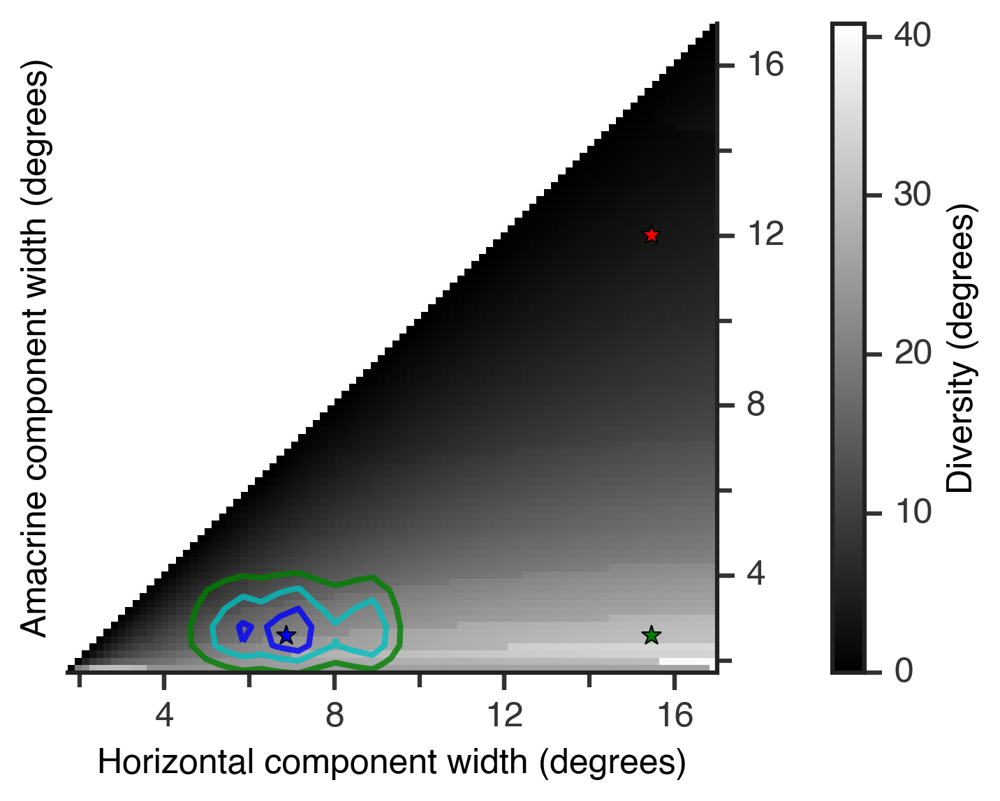

In [656]:
starting_width_idx = 10
ax = plt.gca()
im = plt.imshow(radians_to_deg*half_angles_fft[starting_width_idx:, starting_width_idx:], origin='bottom left', 
                extent=[widths[starting_width_idx], widths[-1], widths[starting_width_idx], widths[-1]],
               clim=[0, np.max(np.tril(radians_to_deg*half_angles_fft[starting_width_idx:, starting_width_idx:].T, k=-1))])
# plt.title('angle between horz only \n and ama only ffts', fontsize=9)
plt.xlim(widths[starting_width_idx], widths[-1])
plt.ylim(widths[starting_width_idx], widths[-1])
plt.xlabel('Horizontal component width (degrees)')

colors = ['b', 'g', 'r']
for exi,ex in enumerate(example_indices):
    plt.plot(widths[ex[0]], widths[ex[1]], colors[exi], marker='*', markersize=7, alpha=1)

# contour
contour_colors = ['g', 'c', 'b']
X, Y = np.meshgrid(horz_edges[:-1] + bar_width/2, ama_edges[:-1] + bar_width/2)
CS = plt.contour(X, Y, smoothed_interneuron_pairs.T, 3, linewidths=2, alpha=0.8, colors=contour_colors)


majorLocator = MultipleLocator(4)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(2)

ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.xaxis.set_minor_locator(minorLocator)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

# axes
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('right')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Amacrine component width (degrees)')
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("right", size="5%", pad=0.55)
cbar = plt.colorbar(im, cax=cax2)
cbar.ax.set_ylabel('Diversity (degrees)', fontsize=12)
cbar.set_ticks([0, 10, 20, 30, 40])

# plt.savefig('lower triangle of diversity smoothed contours with examples degrees 1-23.png', transparent=True)